In [0]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE
import scipy.spatial.distance
from scipy import stats
import scipy
import pandas as pd

from sklearn import svm, datasets
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.utils.multiclass import unique_labels
plt.set_cmap('gray')

np.random.seed(1337)

<Figure size 432x288 with 0 Axes>

In [0]:
#vierte Ebene von Bildern bearbeiten
def rgb2gray(rgb):
    return np.dot(rgb[...,:3], [0.299, 0.587, 0.114])

In [0]:
def data_preparation():
  #Trainings- und Testdaten
  global images_train, labels_train
  cifar = tf.keras.datasets.cifar10.load_data()[0]
  images_train, labels_train = cifar[0], cifar[1]

  global images_test, labels_test
  cifar = tf.keras.datasets.cifar10.load_data()[1]
  images_test, labels_test = cifar[0], cifar[1]
  
  #Anzahl der Samples in train und test
  global n_train
  n_train = images_train.shape[0]
  n_test = images_test.shape[0]

  #Bilder grayscalen
  images_train_gray = []
  for i in range(n_train):
    images_train_gray.append(rgb2gray(images_train[i]))   
  images_train_gray = np.array(images_train_gray)
  
  images_test_gray = []
  for i in range(n_test):
    images_test_gray.append(rgb2gray(images_test[i]))   
  images_test_gray = np.array(images_test_gray)

  #Anzahl der Pixel
  m = images_train.shape[1]**2

  #Vektor aus Matrizen erstellen -> digits flat
  global images_train_gray_flat, images_test_gray_flat
  images_train_gray_flat = images_train_gray.reshape([n_train, m])
  images_test_gray_flat = images_test_gray.reshape([n_test, m])

  #Dimension entfernen
  global labels_train_list
  labels_train_list = []
  for i in range(labels_train.shape[0]):
      labels_train_list.append(labels_train[i][0])
  labels_train_list = np.array(labels_train_list)

  #Subsamples der unserer Datensätze
  idx = np.random.randint(n_train, size = 30000)
  global images_train_sample, labels_train_sample
  images_train_sample = images_train_gray_flat[idx]
  labels_train_sample = labels_train[idx]

  global images_test_sample, labels_test_sample, images_test_sample_n_flat, labels_test_sample_list
  idx = np.random.randint(n_test, size = 500)
  images_test_sample_n_flat = images_test_gray[idx]
  images_test_sample = images_test_gray_flat[idx]
  labels_test_sample = labels_test[idx]
  labels_test_list = []
  for i in range(labels_test_sample.shape[0]):
      labels_test_list.append(labels_test_sample[i][0])
  labels_test_sample_list = np.array(labels_test_list)

## Confusion Matrix

In [0]:
def plot_confusion_matrix(y_true, y_pred, classes,
                          normalize=False,
                          title=None,
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if not title:
        if normalize:
            title = 'Normalized confusion matrix'
        else:
            title = 'Confusion matrix, without normalization'

    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    # Only use the labels that appear in the data
    #classes = classes[unique_labels(y_true, y_pred)]
    classes = unique_labels(y_true, y_pred)
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    fig, ax = plt.subplots()
    im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
    ax.figure.colorbar(im, ax=ax)
    # We want to show all ticks...
    ax.set(xticks=np.arange(cm.shape[1]),
           yticks=np.arange(cm.shape[0]),
           # ... and label them with the respective list entries
           xticklabels=classes, yticklabels=classes,
           title=title,
           ylabel='True label',
           xlabel='Predicted label')

    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
             rotation_mode="anchor")

    # Loop over data dimensions and create text annotations.
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, format(cm[i, j], fmt),
                    ha="center", va="center",
                    color="white" if cm[i, j] > thresh else "black")
    fig.tight_layout()
    return ax

# KNN

In [0]:
def knn(k):
  #Entfernugen berechnen. Man erhält als Matrix alle Entfernungen und kann dann die k nächsten Nachbarn ermitteln
  #k Nachbarn
  print("KNN für k=", k)
  #Distanzen 
  dists = scipy.spatial.distance.cdist(images_train_sample, images_test_sample, metric='euclid')
  #index der nächsten Nachbarn
  idx_nearest = np.argpartition(dists, k, axis=0)[:k]
  nearest_dists = np.take(images_train_sample, idx_nearest)

  knn_neighbors = labels_train_sample[idx_nearest]
  #remove count array with [0]
  knn_result = scipy.stats.mode(knn_neighbors)[0]
  knn_result = knn_result[0]
  return knn_result

In [0]:
def calc_error(knn_result):
  n_error = 0
  check_matrix = labels_test_sample == knn_result
  for check_bool in check_matrix:
    if check_bool == False:
      n_error = n_error + 1
  error_rate = n_error / len(knn_result) * 100
  print("Errorrate: ", error_rate, "%")

  error = {0:0,1:0,2:0,3:0,4:0,5:0,6:0,7:0,8:0,9:0}
  total ={0:0,1:0,2:0,3:0,4:0,5:0,6:0,7:0,8:0,9:0}
  global error_array
  error_array = []
  for i in range(len(labels_test_sample)):
    if labels_test_sample[i] != knn_result[i]:
      error[labels_test_sample_list[i]] +=1
      total[labels_test_sample_list[i]] +=1
      error_array.append(i)
    else:
      total[labels_test_sample_list[i]] +=1
  
  errorrate = {}
  for i in range(0,10):
    errorrate[i] = (error[i] / total[i]) * 100
    print("Errorrate für", i, " = ", round(errorrate[i], 2), "%")
  #print(pd.DataFrame([error]))
  #print(pd.DataFrame([total]))
  print("Index der Fehler im Sampleset: ",error_array)
  
  print("")
  #Alle Bilder anzeigen die falsch zugeordnet wurden
  for i in range(len(error_array)):
    print("Bild Nr.", i+1)
    print("Richtiges Label", labels_test_sample[error_array[i]])
    print("Knn Label Ergebnis:", knn_result[error_array[i]])
    plt.imshow(images_test_sample_n_flat[error_array[i]])
    plt.show()
  plot_confusion_matrix(labels_test_sample, knn_result, classes=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9])

KNN für k= 2
Errorrate:  78.0 %
Errorrate für 0  =  46.15 %
Errorrate für 1  =  89.8 %
Errorrate für 2  =  62.75 %
Errorrate für 3  =  82.26 %
Errorrate für 4  =  77.08 %
Errorrate für 5  =  77.36 %
Errorrate für 6  =  84.62 %
Errorrate für 7  =  94.55 %
Errorrate für 8  =  63.04 %
Errorrate für 9  =  93.33 %
Index der Fehler im Sampleset:  [0, 1, 3, 4, 5, 6, 7, 9, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 24, 25, 26, 28, 29, 30, 31, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 55, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 69, 70, 73, 74, 75, 76, 77, 78, 80, 81, 82, 84, 85, 86, 87, 88, 90, 91, 92, 93, 94, 96, 97, 100, 101, 102, 103, 105, 106, 107, 108, 110, 111, 112, 113, 115, 116, 117, 118, 120, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 133, 134, 136, 137, 139, 140, 141, 142, 143, 144, 145, 146, 147, 149, 150, 152, 153, 154, 155, 156, 157, 158, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 173, 175, 176, 177, 179, 180, 181, 182, 1

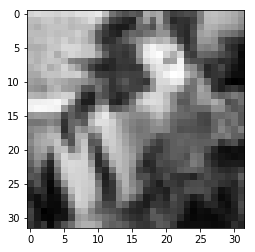

Bild Nr. 2
Richtiges Label [5]
Knn Label Ergebnis: [8]


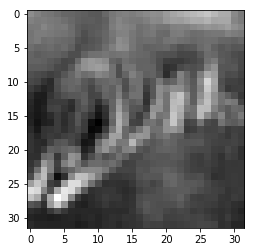

Bild Nr. 3
Richtiges Label [1]
Knn Label Ergebnis: [4]


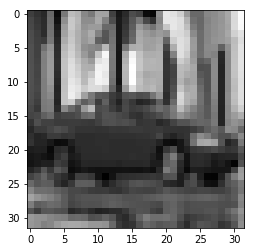

Bild Nr. 4
Richtiges Label [2]
Knn Label Ergebnis: [4]


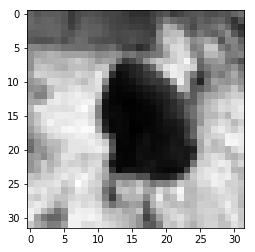

Bild Nr. 5
Richtiges Label [6]
Knn Label Ergebnis: [4]


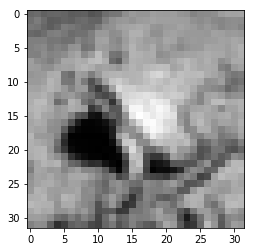

Bild Nr. 6
Richtiges Label [1]
Knn Label Ergebnis: [8]


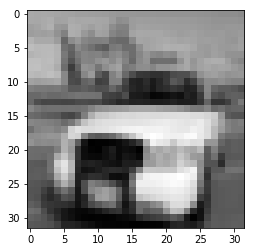

Bild Nr. 7
Richtiges Label [9]
Knn Label Ergebnis: [8]


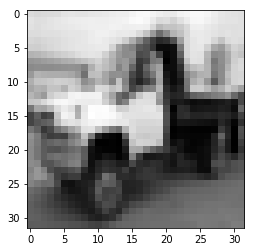

Bild Nr. 8
Richtiges Label [1]
Knn Label Ergebnis: [8]


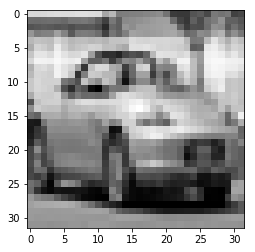

Bild Nr. 9
Richtiges Label [5]
Knn Label Ergebnis: [0]


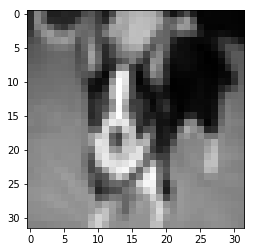

Bild Nr. 10
Richtiges Label [3]
Knn Label Ergebnis: [4]


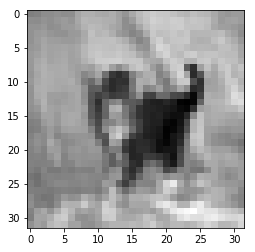

Bild Nr. 11
Richtiges Label [6]
Knn Label Ergebnis: [2]


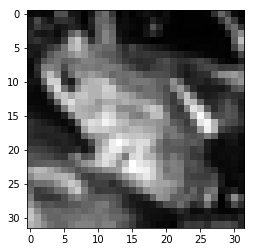

Bild Nr. 12
Richtiges Label [2]
Knn Label Ergebnis: [3]


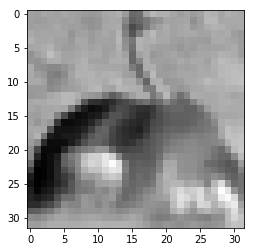

Bild Nr. 13
Richtiges Label [7]
Knn Label Ergebnis: [8]


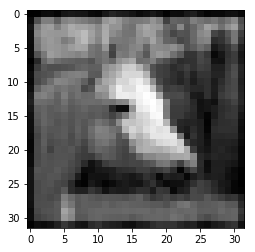

Bild Nr. 14
Richtiges Label [6]
Knn Label Ergebnis: [3]


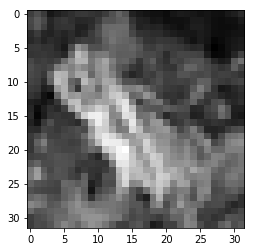

Bild Nr. 15
Richtiges Label [7]
Knn Label Ergebnis: [0]


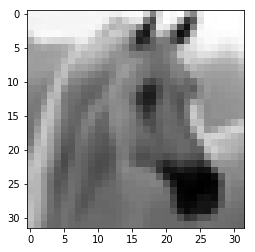

Bild Nr. 16
Richtiges Label [1]
Knn Label Ergebnis: [6]


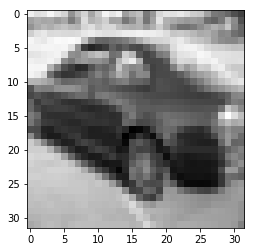

Bild Nr. 17
Richtiges Label [8]
Knn Label Ergebnis: [4]


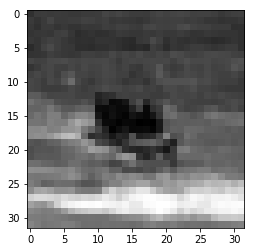

Bild Nr. 18
Richtiges Label [0]
Knn Label Ergebnis: [7]


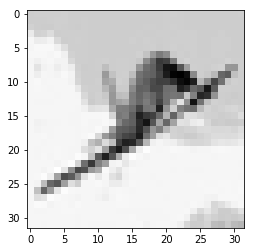

Bild Nr. 19
Richtiges Label [6]
Knn Label Ergebnis: [4]


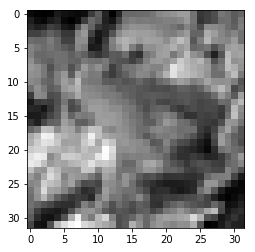

Bild Nr. 20
Richtiges Label [9]
Knn Label Ergebnis: [3]


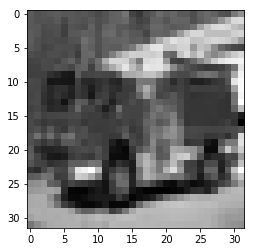

Bild Nr. 21
Richtiges Label [0]
Knn Label Ergebnis: [2]


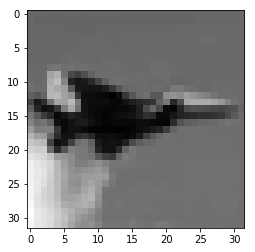

Bild Nr. 22
Richtiges Label [2]
Knn Label Ergebnis: [5]


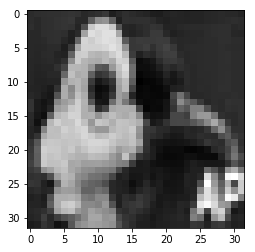

Bild Nr. 23
Richtiges Label [3]
Knn Label Ergebnis: [5]


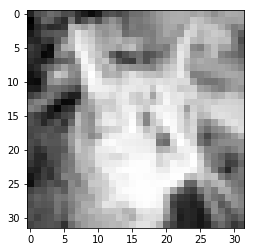

Bild Nr. 24
Richtiges Label [3]
Knn Label Ergebnis: [2]


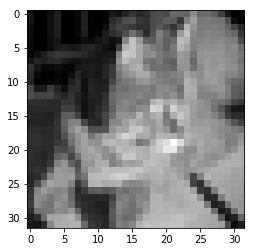

Bild Nr. 25
Richtiges Label [2]
Knn Label Ergebnis: [0]


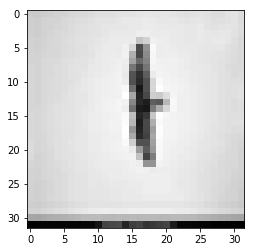

Bild Nr. 26
Richtiges Label [1]
Knn Label Ergebnis: [0]


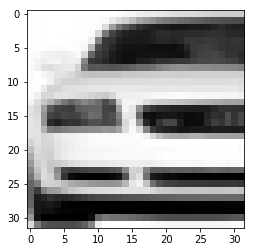

Bild Nr. 27
Richtiges Label [6]
Knn Label Ergebnis: [2]


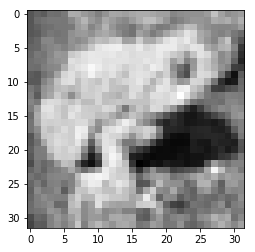

Bild Nr. 28
Richtiges Label [7]
Knn Label Ergebnis: [0]


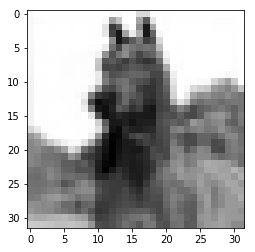

Bild Nr. 29
Richtiges Label [5]
Knn Label Ergebnis: [4]


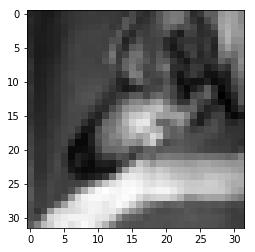

Bild Nr. 30
Richtiges Label [6]
Knn Label Ergebnis: [2]


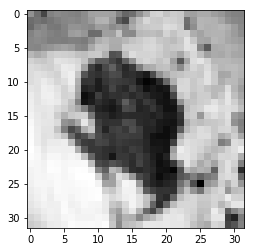

Bild Nr. 31
Richtiges Label [1]
Knn Label Ergebnis: [8]


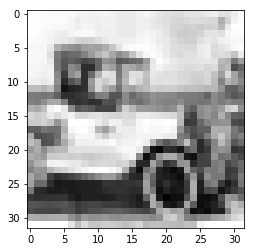

Bild Nr. 32
Richtiges Label [8]
Knn Label Ergebnis: [0]


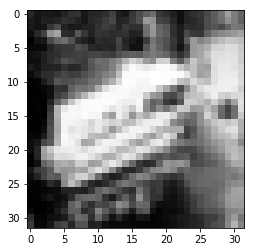

Bild Nr. 33
Richtiges Label [9]
Knn Label Ergebnis: [4]


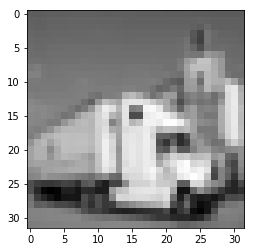

Bild Nr. 34
Richtiges Label [7]
Knn Label Ergebnis: [1]


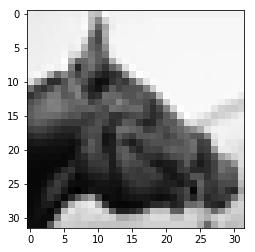

Bild Nr. 35
Richtiges Label [5]
Knn Label Ergebnis: [2]


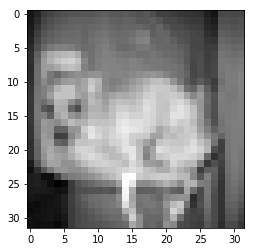

Bild Nr. 36
Richtiges Label [1]
Knn Label Ergebnis: [2]


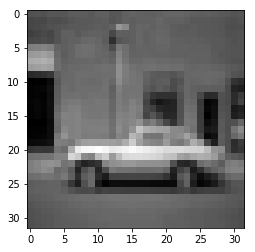

Bild Nr. 37
Richtiges Label [8]
Knn Label Ergebnis: [2]


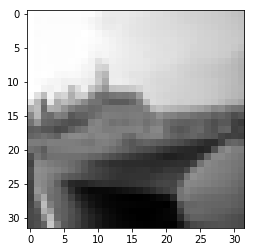

Bild Nr. 38
Richtiges Label [7]
Knn Label Ergebnis: [0]


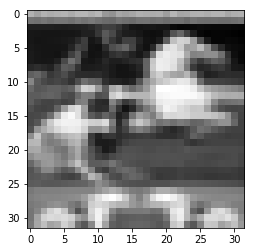

Bild Nr. 39
Richtiges Label [6]
Knn Label Ergebnis: [5]


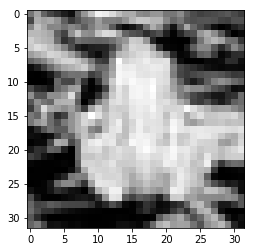

Bild Nr. 40
Richtiges Label [9]
Knn Label Ergebnis: [2]


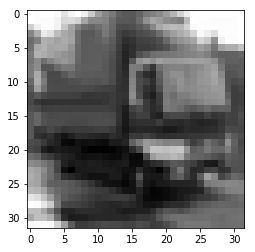

Bild Nr. 41
Richtiges Label [4]
Knn Label Ergebnis: [2]


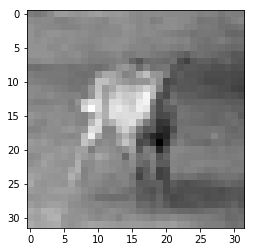

Bild Nr. 42
Richtiges Label [0]
Knn Label Ergebnis: [5]


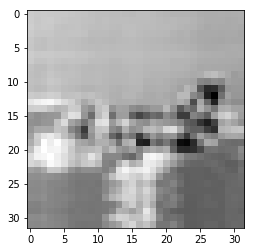

Bild Nr. 43
Richtiges Label [9]
Knn Label Ergebnis: [3]


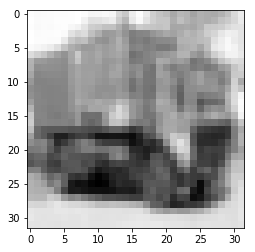

Bild Nr. 44
Richtiges Label [3]
Knn Label Ergebnis: [0]


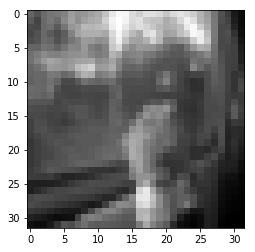

Bild Nr. 45
Richtiges Label [3]
Knn Label Ergebnis: [2]


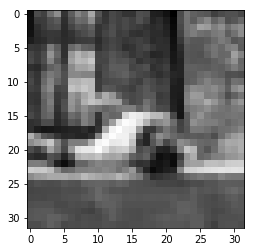

Bild Nr. 46
Richtiges Label [4]
Knn Label Ergebnis: [8]


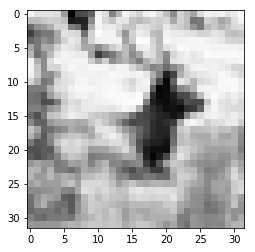

Bild Nr. 47
Richtiges Label [3]
Knn Label Ergebnis: [6]


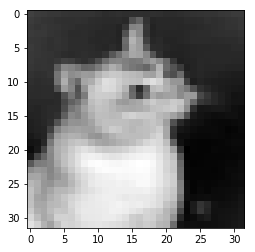

Bild Nr. 48
Richtiges Label [6]
Knn Label Ergebnis: [3]


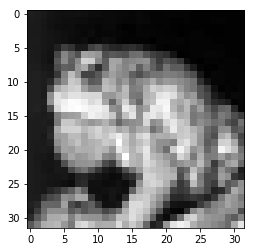

Bild Nr. 49
Richtiges Label [6]
Knn Label Ergebnis: [2]


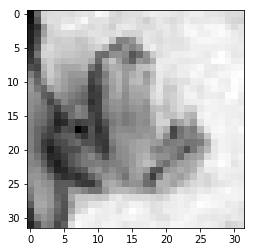

Bild Nr. 50
Richtiges Label [9]
Knn Label Ergebnis: [4]


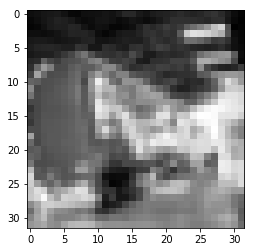

Bild Nr. 51
Richtiges Label [0]
Knn Label Ergebnis: [2]


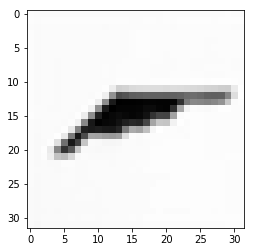

Bild Nr. 52
Richtiges Label [5]
Knn Label Ergebnis: [0]


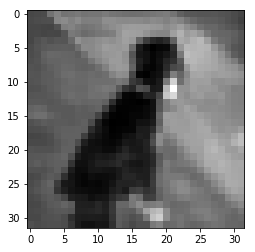

Bild Nr. 53
Richtiges Label [5]
Knn Label Ergebnis: [4]


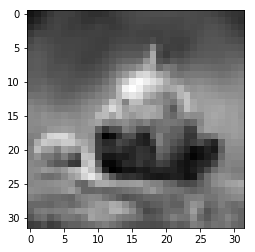

Bild Nr. 54
Richtiges Label [5]
Knn Label Ergebnis: [2]


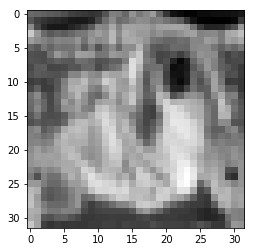

Bild Nr. 55
Richtiges Label [7]
Knn Label Ergebnis: [8]


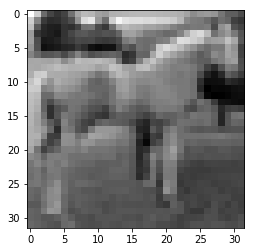

Bild Nr. 56
Richtiges Label [8]
Knn Label Ergebnis: [4]


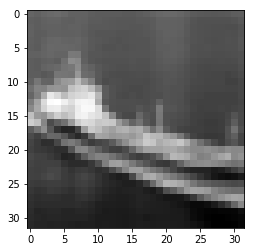

Bild Nr. 57
Richtiges Label [4]
Knn Label Ergebnis: [0]


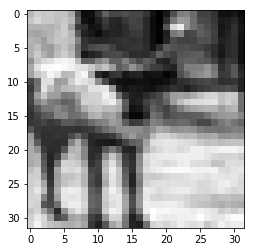

Bild Nr. 58
Richtiges Label [7]
Knn Label Ergebnis: [2]


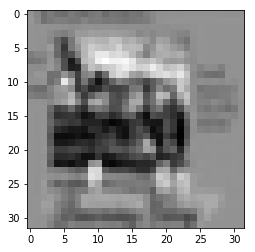

Bild Nr. 59
Richtiges Label [5]
Knn Label Ergebnis: [0]


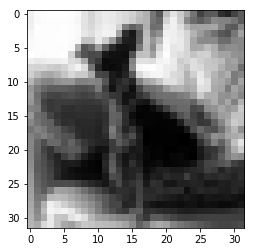

Bild Nr. 60
Richtiges Label [9]
Knn Label Ergebnis: [0]


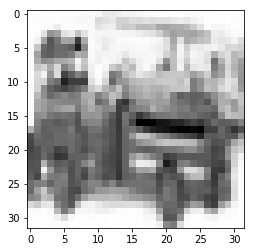

Bild Nr. 61
Richtiges Label [7]
Knn Label Ergebnis: [4]


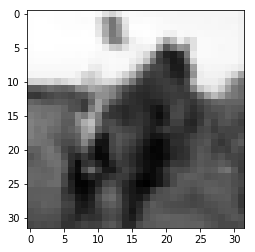

Bild Nr. 62
Richtiges Label [5]
Knn Label Ergebnis: [8]


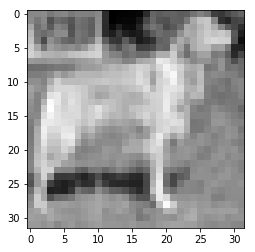

Bild Nr. 63
Richtiges Label [7]
Knn Label Ergebnis: [3]


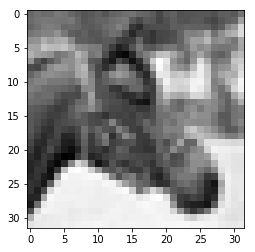

Bild Nr. 64
Richtiges Label [9]
Knn Label Ergebnis: [2]


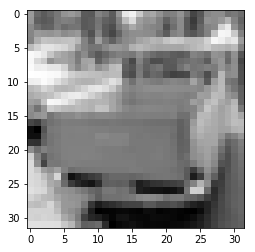

Bild Nr. 65
Richtiges Label [4]
Knn Label Ergebnis: [6]


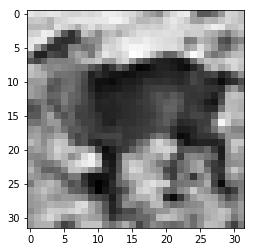

Bild Nr. 66
Richtiges Label [9]
Knn Label Ergebnis: [4]


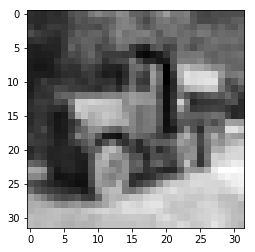

Bild Nr. 67
Richtiges Label [5]
Knn Label Ergebnis: [4]


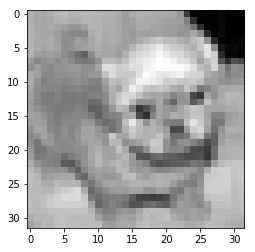

Bild Nr. 68
Richtiges Label [9]
Knn Label Ergebnis: [3]


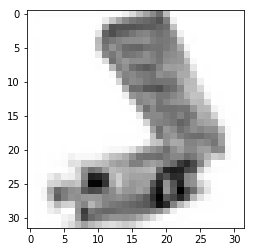

Bild Nr. 69
Richtiges Label [5]
Knn Label Ergebnis: [2]


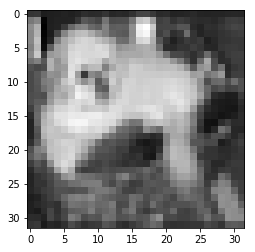

Bild Nr. 70
Richtiges Label [8]
Knn Label Ergebnis: [2]


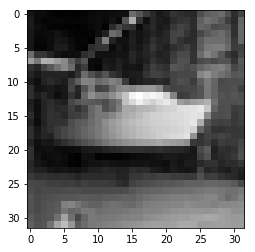

Bild Nr. 71
Richtiges Label [3]
Knn Label Ergebnis: [2]


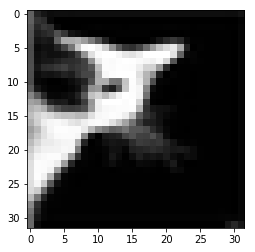

Bild Nr. 72
Richtiges Label [0]
Knn Label Ergebnis: [8]


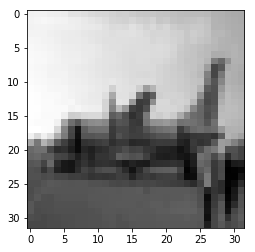

Bild Nr. 73
Richtiges Label [9]
Knn Label Ergebnis: [4]


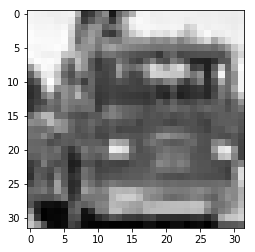

Bild Nr. 74
Richtiges Label [9]
Knn Label Ergebnis: [0]


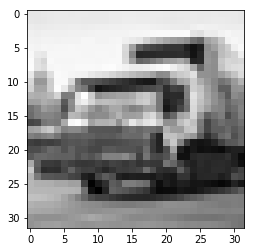

Bild Nr. 75
Richtiges Label [2]
Knn Label Ergebnis: [4]


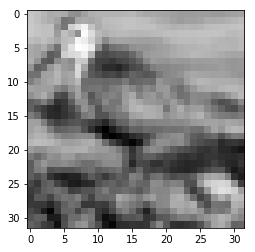

Bild Nr. 76
Richtiges Label [3]
Knn Label Ergebnis: [2]


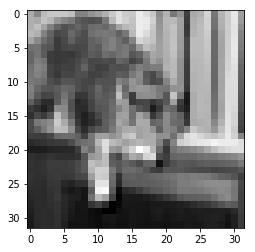

Bild Nr. 77
Richtiges Label [6]
Knn Label Ergebnis: [0]


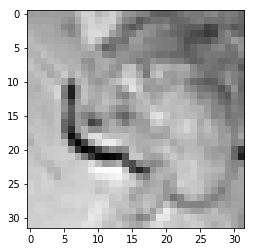

Bild Nr. 78
Richtiges Label [4]
Knn Label Ergebnis: [2]


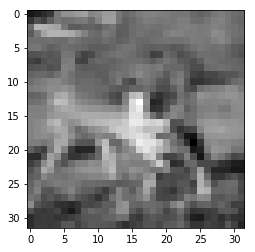

Bild Nr. 79
Richtiges Label [4]
Knn Label Ergebnis: [0]


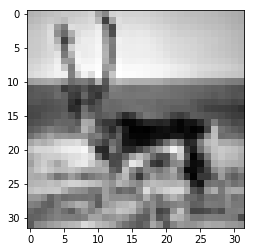

Bild Nr. 80
Richtiges Label [5]
Knn Label Ergebnis: [2]


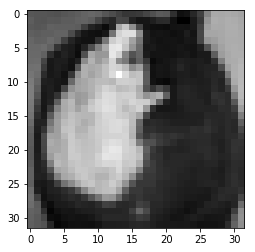

Bild Nr. 81
Richtiges Label [3]
Knn Label Ergebnis: [0]


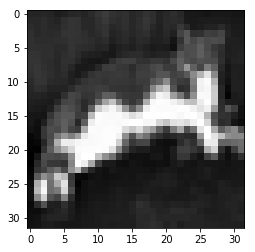

Bild Nr. 82
Richtiges Label [0]
Knn Label Ergebnis: [2]


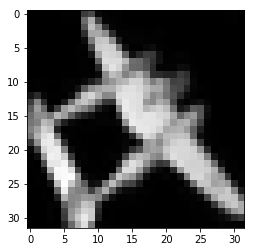

Bild Nr. 83
Richtiges Label [5]
Knn Label Ergebnis: [0]


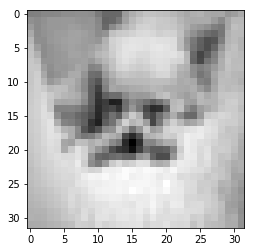

Bild Nr. 84
Richtiges Label [6]
Knn Label Ergebnis: [8]


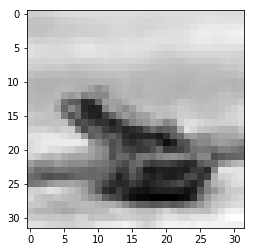

Bild Nr. 85
Richtiges Label [8]
Knn Label Ergebnis: [0]


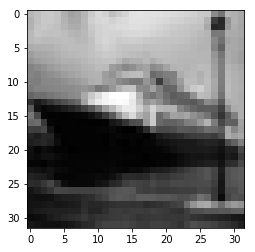

Bild Nr. 86
Richtiges Label [4]
Knn Label Ergebnis: [2]


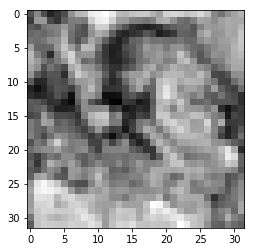

Bild Nr. 87
Richtiges Label [4]
Knn Label Ergebnis: [3]


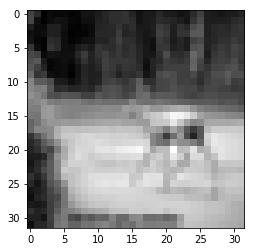

Bild Nr. 88
Richtiges Label [9]
Knn Label Ergebnis: [8]


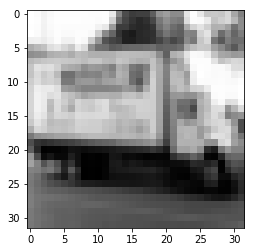

Bild Nr. 89
Richtiges Label [7]
Knn Label Ergebnis: [2]


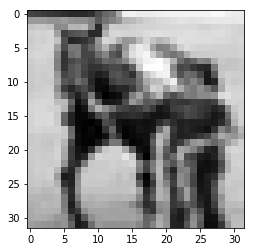

Bild Nr. 90
Richtiges Label [4]
Knn Label Ergebnis: [7]


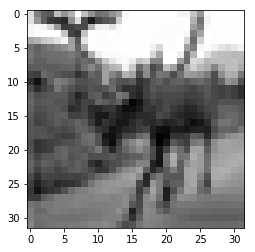

Bild Nr. 91
Richtiges Label [7]
Knn Label Ergebnis: [0]


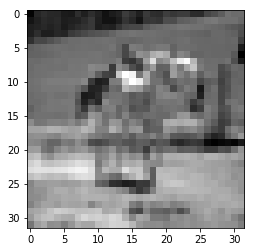

Bild Nr. 92
Richtiges Label [7]
Knn Label Ergebnis: [2]


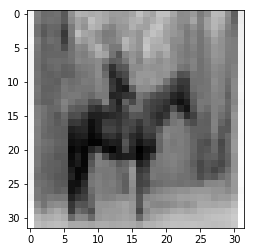

Bild Nr. 93
Richtiges Label [8]
Knn Label Ergebnis: [0]


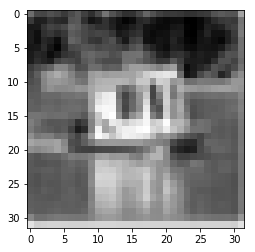

Bild Nr. 94
Richtiges Label [8]
Knn Label Ergebnis: [2]


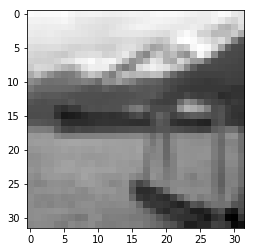

Bild Nr. 95
Richtiges Label [0]
Knn Label Ergebnis: [2]


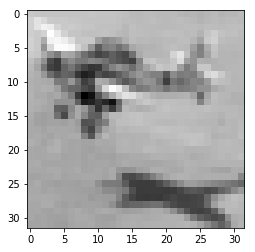

Bild Nr. 96
Richtiges Label [4]
Knn Label Ergebnis: [2]


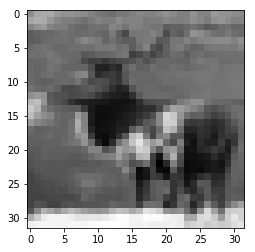

Bild Nr. 97
Richtiges Label [1]
Knn Label Ergebnis: [4]


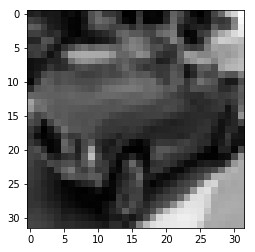

Bild Nr. 98
Richtiges Label [2]
Knn Label Ergebnis: [4]


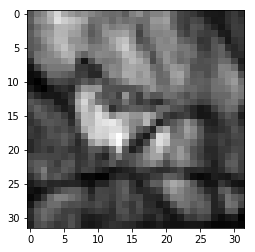

Bild Nr. 99
Richtiges Label [7]
Knn Label Ergebnis: [2]


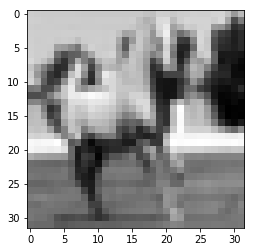

Bild Nr. 100
Richtiges Label [3]
Knn Label Ergebnis: [0]


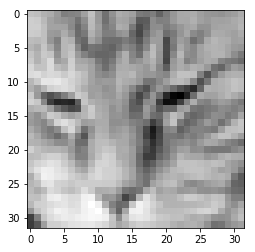

Bild Nr. 101
Richtiges Label [6]
Knn Label Ergebnis: [0]


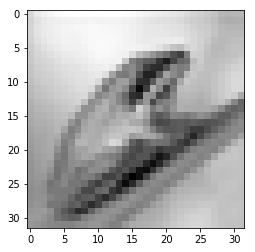

Bild Nr. 102
Richtiges Label [9]
Knn Label Ergebnis: [1]


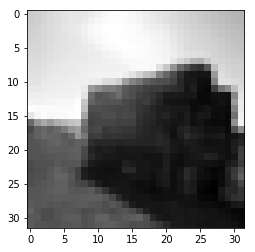

Bild Nr. 103
Richtiges Label [1]
Knn Label Ergebnis: [2]


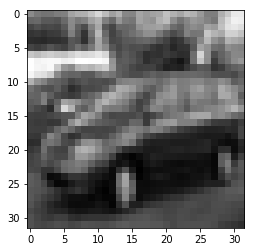

Bild Nr. 104
Richtiges Label [4]
Knn Label Ergebnis: [2]


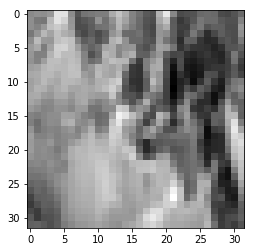

Bild Nr. 105
Richtiges Label [7]
Knn Label Ergebnis: [0]


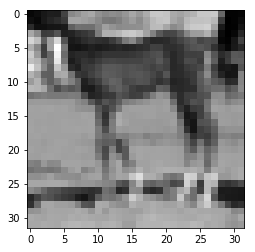

Bild Nr. 106
Richtiges Label [9]
Knn Label Ergebnis: [0]


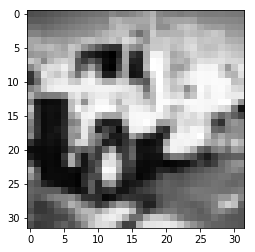

Bild Nr. 107
Richtiges Label [7]
Knn Label Ergebnis: [2]


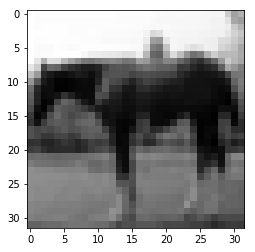

Bild Nr. 108
Richtiges Label [1]
Knn Label Ergebnis: [4]


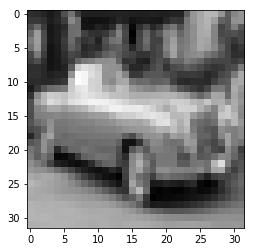

Bild Nr. 109
Richtiges Label [3]
Knn Label Ergebnis: [4]


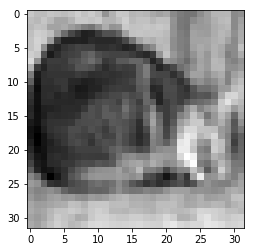

Bild Nr. 110
Richtiges Label [2]
Knn Label Ergebnis: [0]


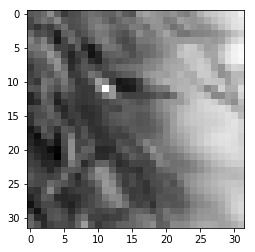

Bild Nr. 111
Richtiges Label [3]
Knn Label Ergebnis: [0]


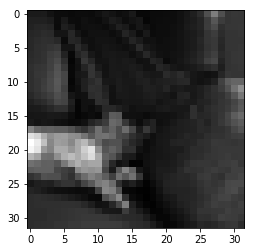

Bild Nr. 112
Richtiges Label [5]
Knn Label Ergebnis: [4]


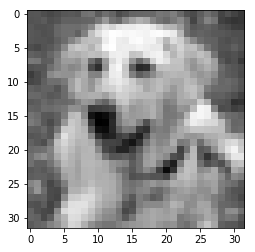

Bild Nr. 113
Richtiges Label [1]
Knn Label Ergebnis: [8]


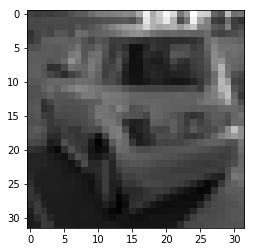

Bild Nr. 114
Richtiges Label [1]
Knn Label Ergebnis: [4]


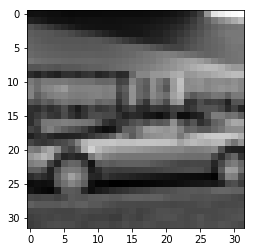

Bild Nr. 115
Richtiges Label [1]
Knn Label Ergebnis: [6]


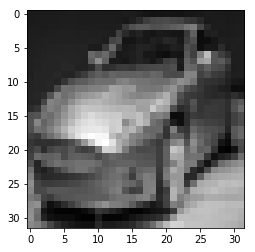

Bild Nr. 116
Richtiges Label [6]
Knn Label Ergebnis: [4]


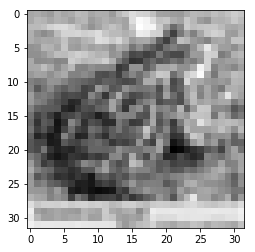

Bild Nr. 117
Richtiges Label [7]
Knn Label Ergebnis: [0]


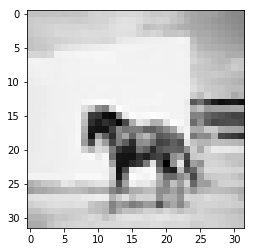

Bild Nr. 118
Richtiges Label [8]
Knn Label Ergebnis: [4]


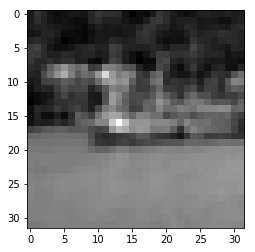

Bild Nr. 119
Richtiges Label [1]
Knn Label Ergebnis: [2]


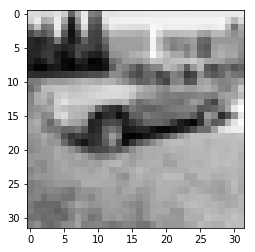

Bild Nr. 120
Richtiges Label [9]
Knn Label Ergebnis: [0]


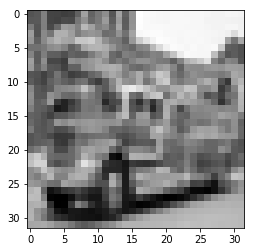

Bild Nr. 121
Richtiges Label [4]
Knn Label Ergebnis: [2]


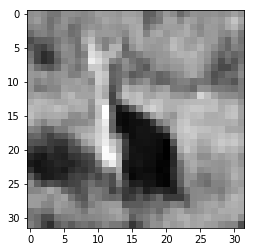

Bild Nr. 122
Richtiges Label [3]
Knn Label Ergebnis: [8]


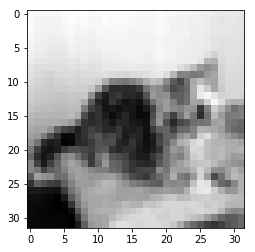

Bild Nr. 123
Richtiges Label [7]
Knn Label Ergebnis: [3]


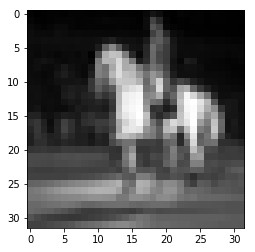

Bild Nr. 124
Richtiges Label [1]
Knn Label Ergebnis: [3]


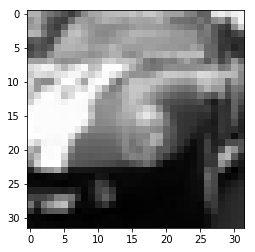

Bild Nr. 125
Richtiges Label [4]
Knn Label Ergebnis: [2]


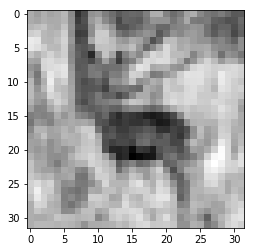

Bild Nr. 126
Richtiges Label [5]
Knn Label Ergebnis: [3]


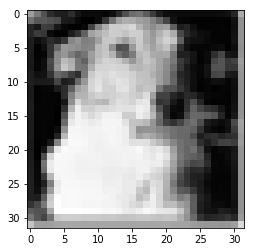

Bild Nr. 127
Richtiges Label [3]
Knn Label Ergebnis: [4]


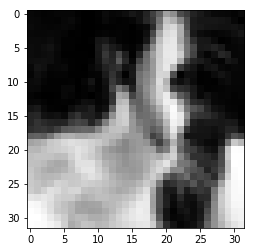

Bild Nr. 128
Richtiges Label [9]
Knn Label Ergebnis: [6]


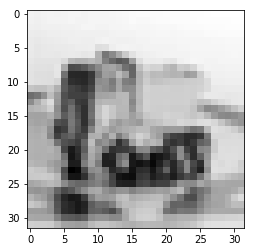

Bild Nr. 129
Richtiges Label [6]
Knn Label Ergebnis: [0]


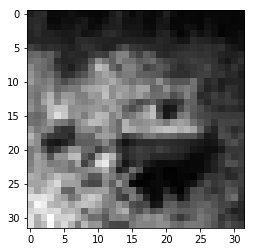

Bild Nr. 130
Richtiges Label [3]
Knn Label Ergebnis: [2]


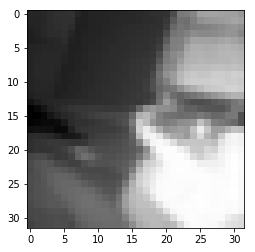

Bild Nr. 131
Richtiges Label [4]
Knn Label Ergebnis: [5]


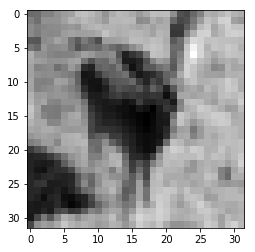

Bild Nr. 132
Richtiges Label [3]
Knn Label Ergebnis: [8]


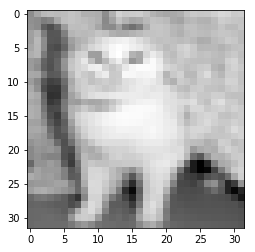

Bild Nr. 133
Richtiges Label [5]
Knn Label Ergebnis: [2]


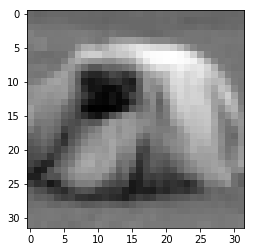

Bild Nr. 134
Richtiges Label [6]
Knn Label Ergebnis: [4]


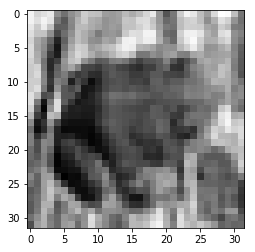

Bild Nr. 135
Richtiges Label [8]
Knn Label Ergebnis: [0]


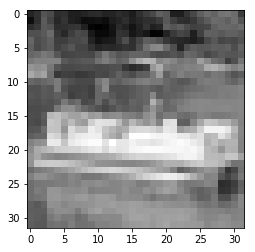

Bild Nr. 136
Richtiges Label [6]
Knn Label Ergebnis: [8]


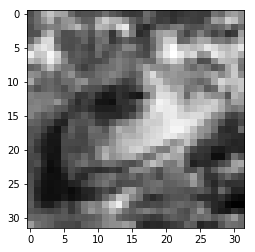

Bild Nr. 137
Richtiges Label [8]
Knn Label Ergebnis: [1]


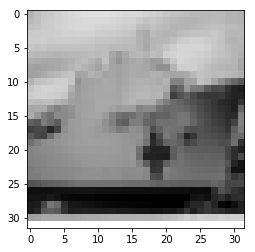

Bild Nr. 138
Richtiges Label [1]
Knn Label Ergebnis: [8]


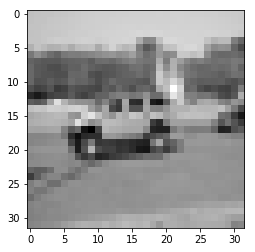

Bild Nr. 139
Richtiges Label [3]
Knn Label Ergebnis: [0]


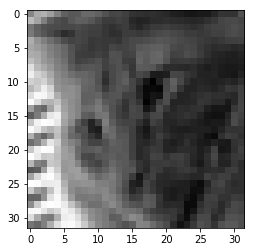

Bild Nr. 140
Richtiges Label [9]
Knn Label Ergebnis: [8]


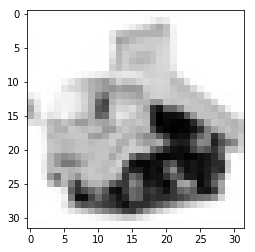

Bild Nr. 141
Richtiges Label [2]
Knn Label Ergebnis: [6]


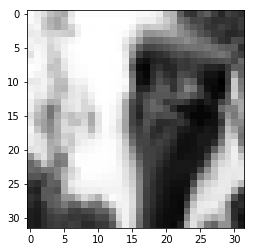

Bild Nr. 142
Richtiges Label [3]
Knn Label Ergebnis: [0]


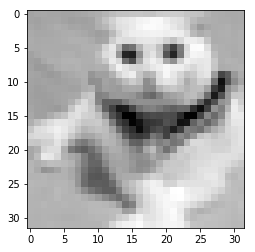

Bild Nr. 143
Richtiges Label [3]
Knn Label Ergebnis: [0]


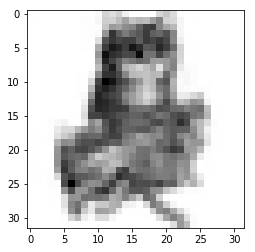

Bild Nr. 144
Richtiges Label [8]
Knn Label Ergebnis: [0]


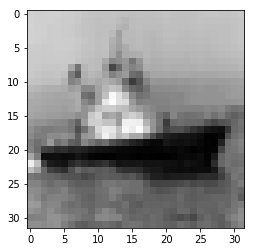

Bild Nr. 145
Richtiges Label [3]
Knn Label Ergebnis: [0]


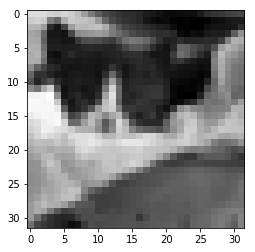

Bild Nr. 146
Richtiges Label [2]
Knn Label Ergebnis: [4]


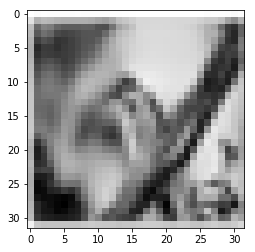

Bild Nr. 147
Richtiges Label [1]
Knn Label Ergebnis: [0]


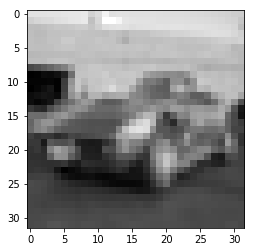

Bild Nr. 148
Richtiges Label [3]
Knn Label Ergebnis: [0]


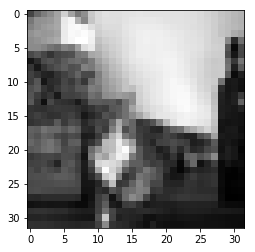

Bild Nr. 149
Richtiges Label [3]
Knn Label Ergebnis: [0]


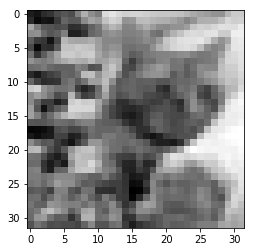

Bild Nr. 150
Richtiges Label [9]
Knn Label Ergebnis: [4]


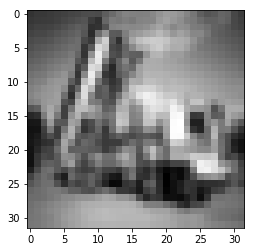

Bild Nr. 151
Richtiges Label [3]
Knn Label Ergebnis: [6]


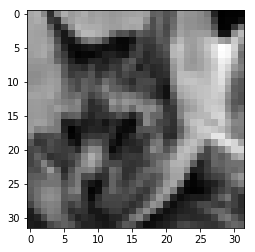

Bild Nr. 152
Richtiges Label [7]
Knn Label Ergebnis: [2]


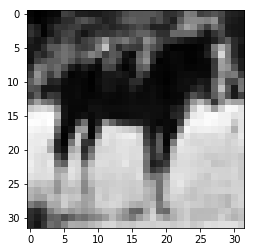

Bild Nr. 153
Richtiges Label [4]
Knn Label Ergebnis: [2]


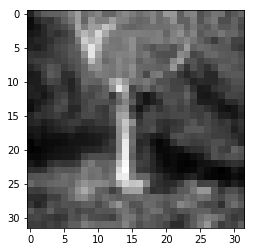

Bild Nr. 154
Richtiges Label [7]
Knn Label Ergebnis: [4]


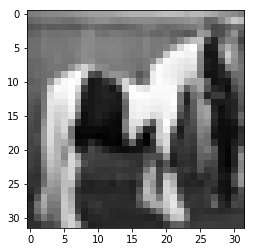

Bild Nr. 155
Richtiges Label [7]
Knn Label Ergebnis: [0]


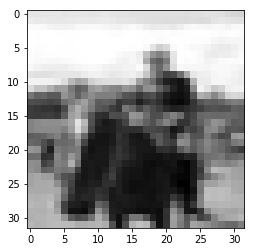

Bild Nr. 156
Richtiges Label [6]
Knn Label Ergebnis: [0]


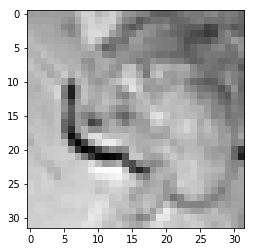

Bild Nr. 157
Richtiges Label [8]
Knn Label Ergebnis: [2]


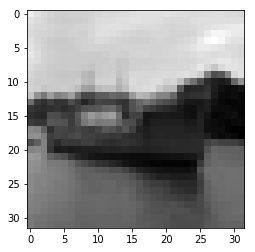

Bild Nr. 158
Richtiges Label [3]
Knn Label Ergebnis: [2]


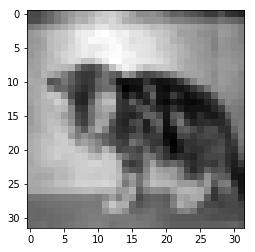

Bild Nr. 159
Richtiges Label [8]
Knn Label Ergebnis: [4]


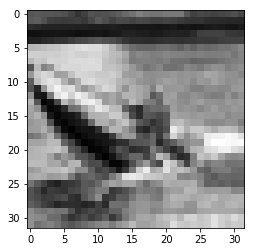

Bild Nr. 160
Richtiges Label [2]
Knn Label Ergebnis: [0]


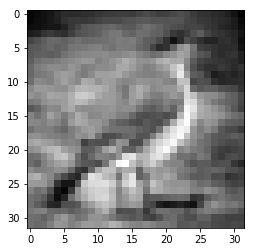

Bild Nr. 161
Richtiges Label [0]
Knn Label Ergebnis: [8]


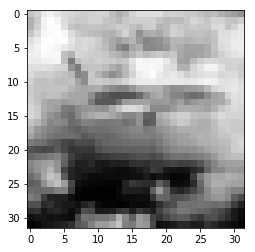

Bild Nr. 162
Richtiges Label [9]
Knn Label Ergebnis: [4]


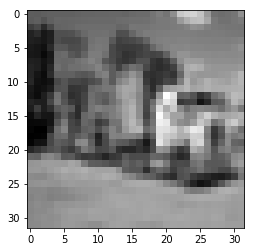

Bild Nr. 163
Richtiges Label [3]
Knn Label Ergebnis: [2]


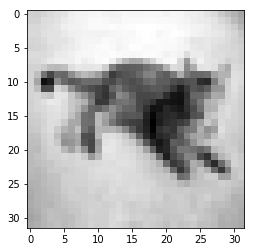

Bild Nr. 164
Richtiges Label [3]
Knn Label Ergebnis: [4]


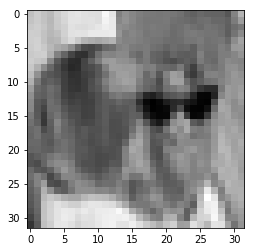

Bild Nr. 165
Richtiges Label [9]
Knn Label Ergebnis: [8]


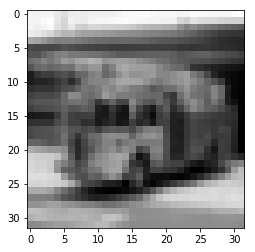

Bild Nr. 166
Richtiges Label [8]
Knn Label Ergebnis: [4]


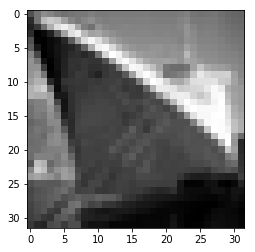

Bild Nr. 167
Richtiges Label [0]
Knn Label Ergebnis: [8]


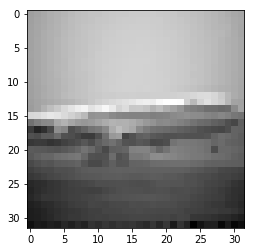

Bild Nr. 168
Richtiges Label [7]
Knn Label Ergebnis: [3]


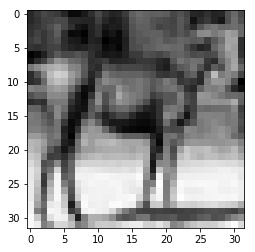

Bild Nr. 169
Richtiges Label [7]
Knn Label Ergebnis: [4]


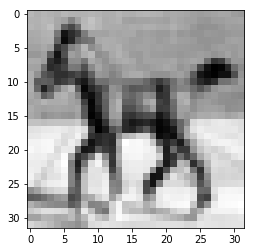

Bild Nr. 170
Richtiges Label [3]
Knn Label Ergebnis: [4]


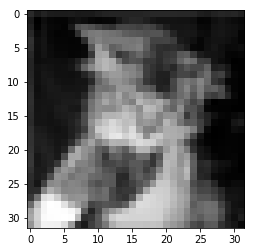

Bild Nr. 171
Richtiges Label [5]
Knn Label Ergebnis: [3]


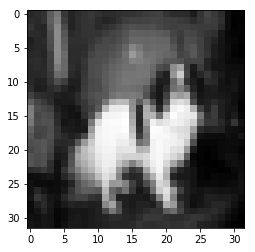

Bild Nr. 172
Richtiges Label [1]
Knn Label Ergebnis: [3]


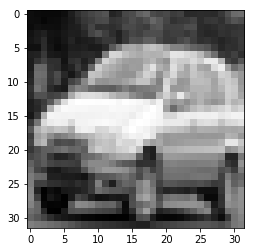

Bild Nr. 173
Richtiges Label [4]
Knn Label Ergebnis: [2]


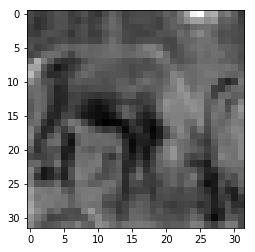

Bild Nr. 174
Richtiges Label [6]
Knn Label Ergebnis: [3]


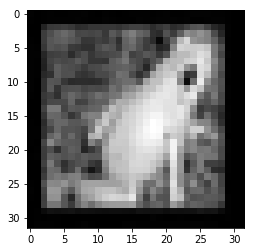

Bild Nr. 175
Richtiges Label [7]
Knn Label Ergebnis: [2]


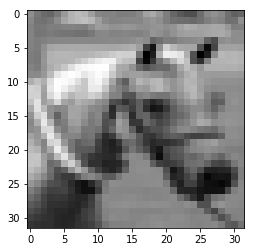

Bild Nr. 176
Richtiges Label [4]
Knn Label Ergebnis: [3]


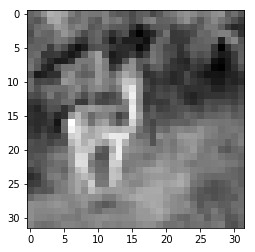

Bild Nr. 177
Richtiges Label [5]
Knn Label Ergebnis: [4]


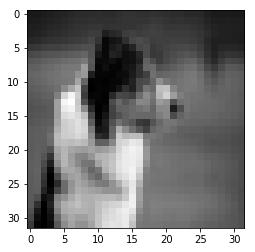

Bild Nr. 178
Richtiges Label [3]
Knn Label Ergebnis: [0]


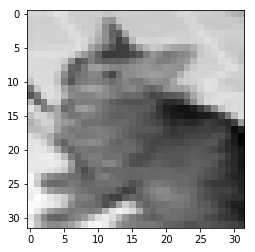

Bild Nr. 179
Richtiges Label [9]
Knn Label Ergebnis: [8]


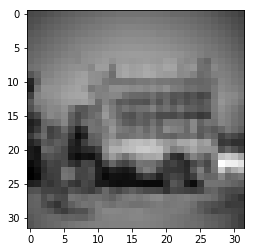

Bild Nr. 180
Richtiges Label [9]
Knn Label Ergebnis: [2]


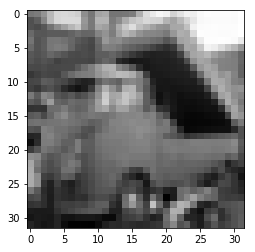

Bild Nr. 181
Richtiges Label [6]
Knn Label Ergebnis: [3]


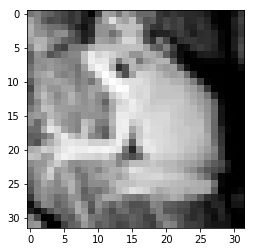

Bild Nr. 182
Richtiges Label [8]
Knn Label Ergebnis: [0]


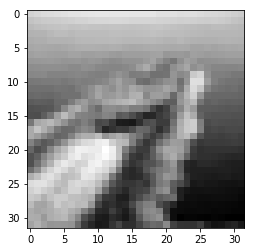

Bild Nr. 183
Richtiges Label [2]
Knn Label Ergebnis: [4]


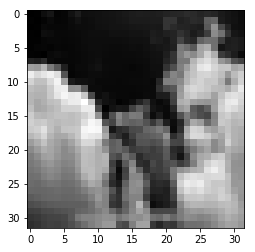

Bild Nr. 184
Richtiges Label [0]
Knn Label Ergebnis: [8]


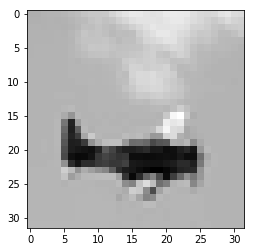

Bild Nr. 185
Richtiges Label [8]
Knn Label Ergebnis: [0]


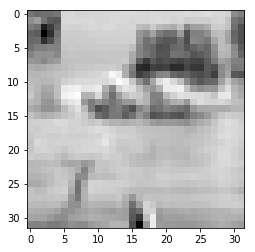

Bild Nr. 186
Richtiges Label [0]
Knn Label Ergebnis: [4]


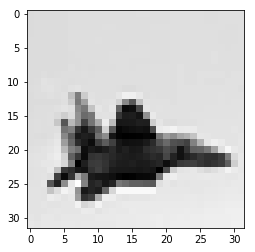

Bild Nr. 187
Richtiges Label [1]
Knn Label Ergebnis: [6]


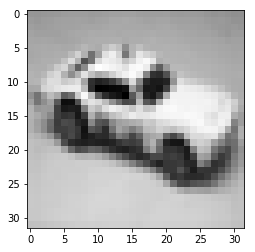

Bild Nr. 188
Richtiges Label [2]
Knn Label Ergebnis: [0]


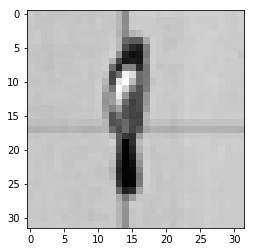

Bild Nr. 189
Richtiges Label [4]
Knn Label Ergebnis: [2]


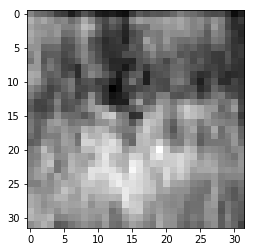

Bild Nr. 190
Richtiges Label [4]
Knn Label Ergebnis: [3]


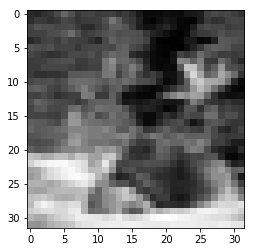

Bild Nr. 191
Richtiges Label [1]
Knn Label Ergebnis: [0]


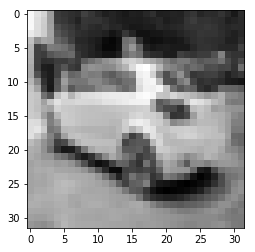

Bild Nr. 192
Richtiges Label [9]
Knn Label Ergebnis: [3]


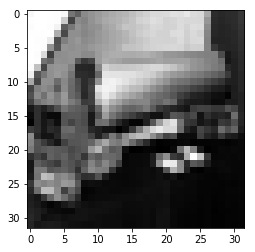

Bild Nr. 193
Richtiges Label [6]
Knn Label Ergebnis: [4]


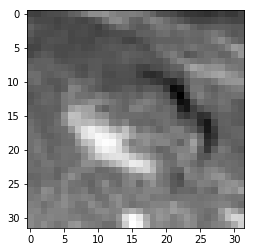

Bild Nr. 194
Richtiges Label [2]
Knn Label Ergebnis: [4]


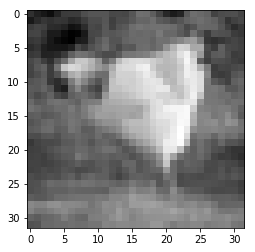

Bild Nr. 195
Richtiges Label [3]
Knn Label Ergebnis: [4]


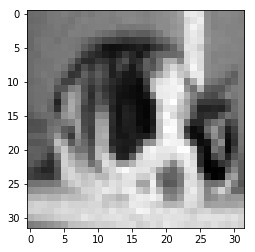

Bild Nr. 196
Richtiges Label [0]
Knn Label Ergebnis: [4]


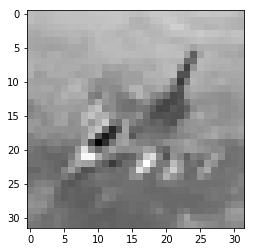

Bild Nr. 197
Richtiges Label [7]
Knn Label Ergebnis: [8]


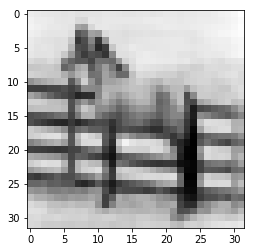

Bild Nr. 198
Richtiges Label [8]
Knn Label Ergebnis: [0]


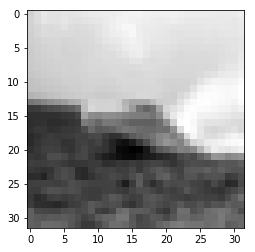

Bild Nr. 199
Richtiges Label [1]
Knn Label Ergebnis: [8]


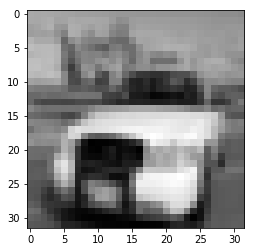

Bild Nr. 200
Richtiges Label [1]
Knn Label Ergebnis: [0]


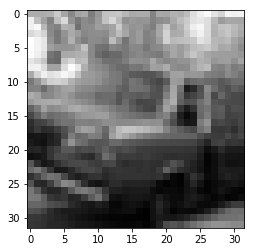

Bild Nr. 201
Richtiges Label [3]
Knn Label Ergebnis: [6]


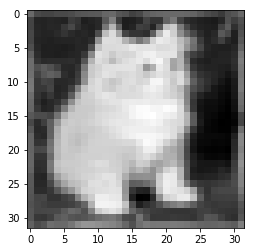

Bild Nr. 202
Richtiges Label [0]
Knn Label Ergebnis: [4]


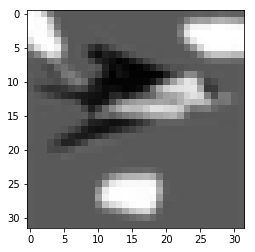

Bild Nr. 203
Richtiges Label [4]
Knn Label Ergebnis: [3]


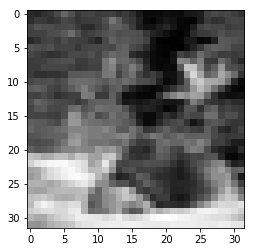

Bild Nr. 204
Richtiges Label [7]
Knn Label Ergebnis: [0]


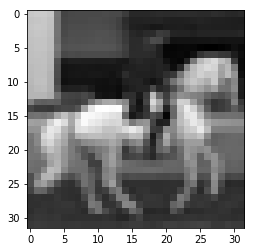

Bild Nr. 205
Richtiges Label [9]
Knn Label Ergebnis: [0]


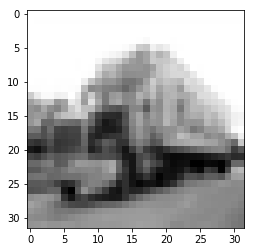

Bild Nr. 206
Richtiges Label [1]
Knn Label Ergebnis: [4]


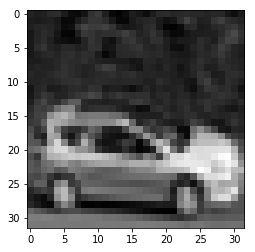

Bild Nr. 207
Richtiges Label [7]
Knn Label Ergebnis: [3]


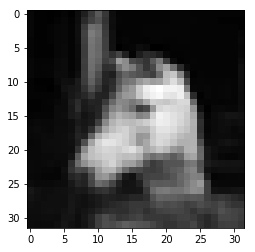

Bild Nr. 208
Richtiges Label [5]
Knn Label Ergebnis: [4]


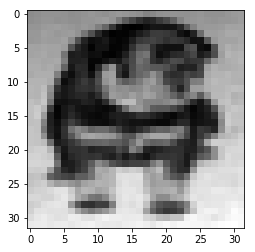

Bild Nr. 209
Richtiges Label [3]
Knn Label Ergebnis: [2]


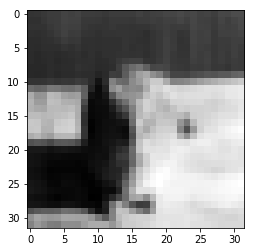

Bild Nr. 210
Richtiges Label [3]
Knn Label Ergebnis: [2]


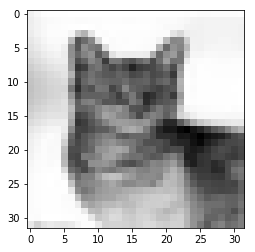

Bild Nr. 211
Richtiges Label [2]
Knn Label Ergebnis: [0]


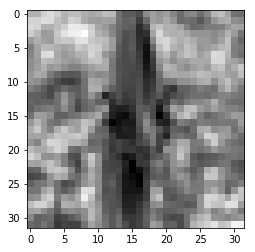

Bild Nr. 212
Richtiges Label [7]
Knn Label Ergebnis: [5]


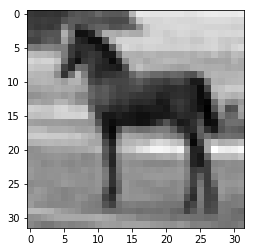

Bild Nr. 213
Richtiges Label [6]
Knn Label Ergebnis: [2]


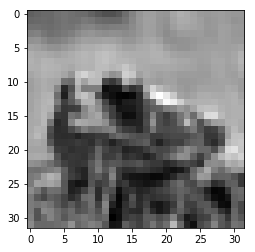

Bild Nr. 214
Richtiges Label [3]
Knn Label Ergebnis: [0]


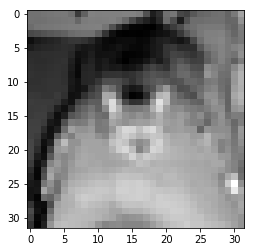

Bild Nr. 215
Richtiges Label [7]
Knn Label Ergebnis: [2]


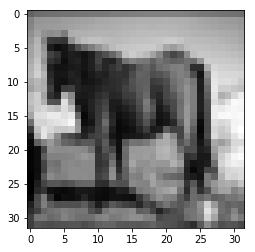

Bild Nr. 216
Richtiges Label [2]
Knn Label Ergebnis: [4]


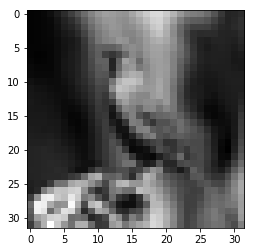

Bild Nr. 217
Richtiges Label [4]
Knn Label Ergebnis: [2]


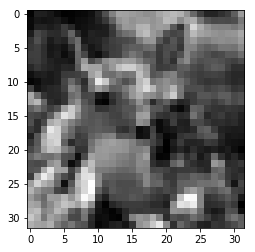

Bild Nr. 218
Richtiges Label [4]
Knn Label Ergebnis: [2]


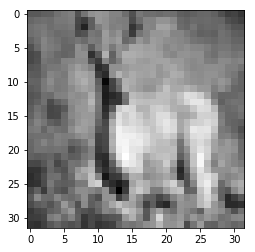

Bild Nr. 219
Richtiges Label [7]
Knn Label Ergebnis: [1]


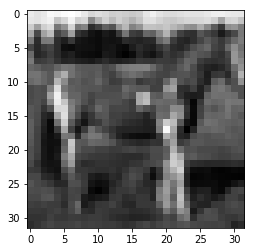

Bild Nr. 220
Richtiges Label [8]
Knn Label Ergebnis: [0]


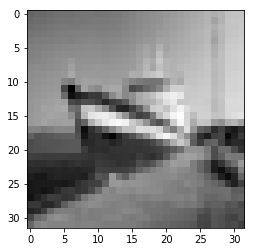

Bild Nr. 221
Richtiges Label [9]
Knn Label Ergebnis: [0]


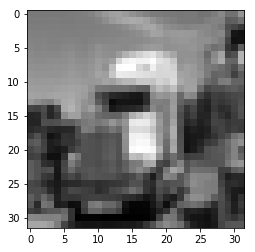

Bild Nr. 222
Richtiges Label [2]
Knn Label Ergebnis: [4]


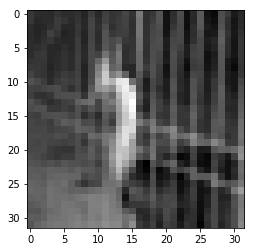

Bild Nr. 223
Richtiges Label [3]
Knn Label Ergebnis: [4]


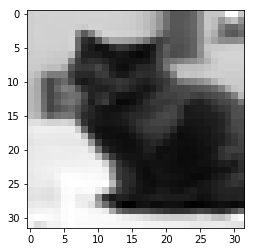

Bild Nr. 224
Richtiges Label [1]
Knn Label Ergebnis: [6]


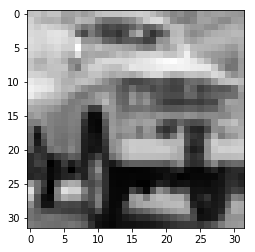

Bild Nr. 225
Richtiges Label [9]
Knn Label Ergebnis: [8]


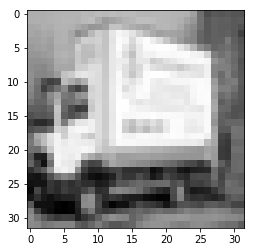

Bild Nr. 226
Richtiges Label [9]
Knn Label Ergebnis: [8]


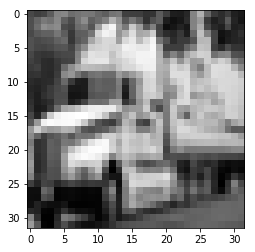

Bild Nr. 227
Richtiges Label [2]
Knn Label Ergebnis: [0]


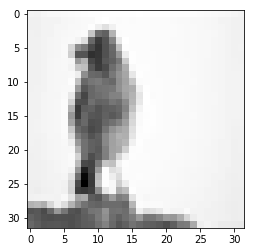

Bild Nr. 228
Richtiges Label [8]
Knn Label Ergebnis: [2]


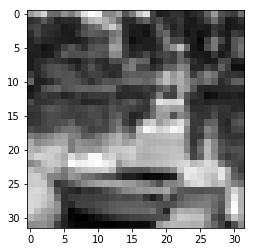

Bild Nr. 229
Richtiges Label [8]
Knn Label Ergebnis: [4]


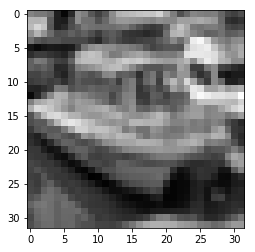

Bild Nr. 230
Richtiges Label [8]
Knn Label Ergebnis: [4]


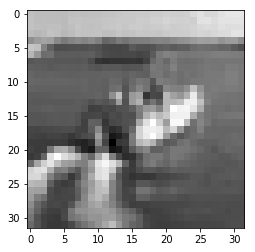

Bild Nr. 231
Richtiges Label [3]
Knn Label Ergebnis: [9]


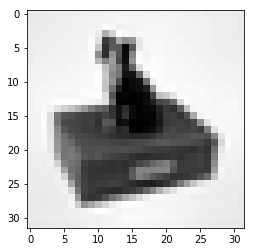

Bild Nr. 232
Richtiges Label [1]
Knn Label Ergebnis: [8]


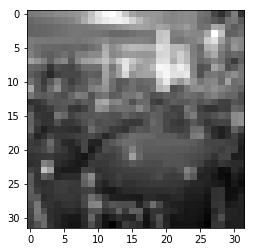

Bild Nr. 233
Richtiges Label [5]
Knn Label Ergebnis: [2]


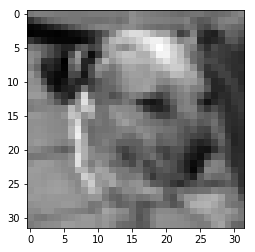

Bild Nr. 234
Richtiges Label [1]
Knn Label Ergebnis: [0]


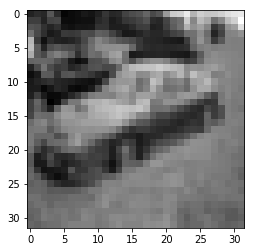

Bild Nr. 235
Richtiges Label [6]
Knn Label Ergebnis: [0]


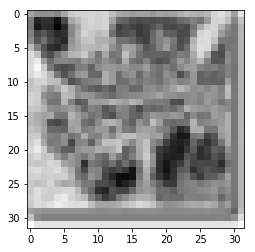

Bild Nr. 236
Richtiges Label [7]
Knn Label Ergebnis: [0]


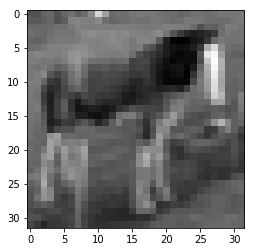

Bild Nr. 237
Richtiges Label [6]
Knn Label Ergebnis: [3]


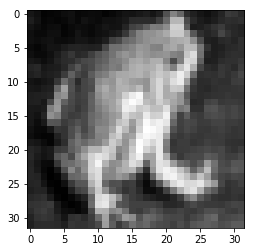

Bild Nr. 238
Richtiges Label [4]
Knn Label Ergebnis: [3]


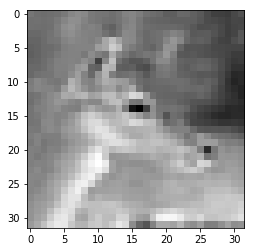

Bild Nr. 239
Richtiges Label [1]
Knn Label Ergebnis: [8]


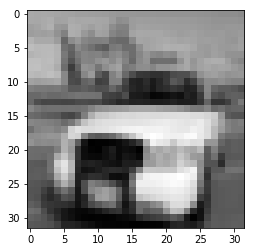

Bild Nr. 240
Richtiges Label [9]
Knn Label Ergebnis: [3]


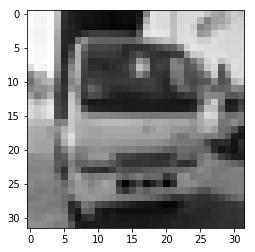

Bild Nr. 241
Richtiges Label [6]
Knn Label Ergebnis: [5]


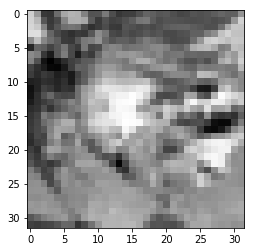

Bild Nr. 242
Richtiges Label [2]
Knn Label Ergebnis: [3]


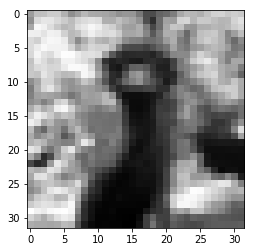

Bild Nr. 243
Richtiges Label [6]
Knn Label Ergebnis: [0]


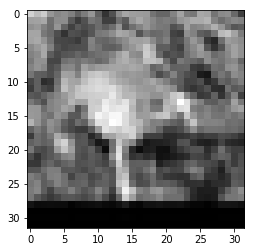

Bild Nr. 244
Richtiges Label [3]
Knn Label Ergebnis: [4]


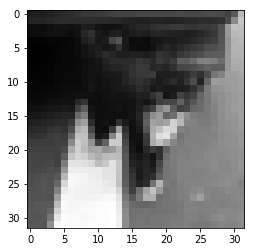

Bild Nr. 245
Richtiges Label [6]
Knn Label Ergebnis: [2]


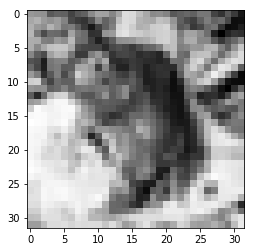

Bild Nr. 246
Richtiges Label [9]
Knn Label Ergebnis: [0]


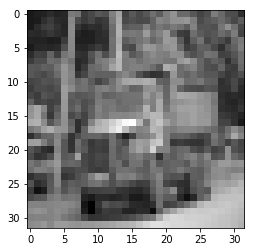

Bild Nr. 247
Richtiges Label [0]
Knn Label Ergebnis: [4]


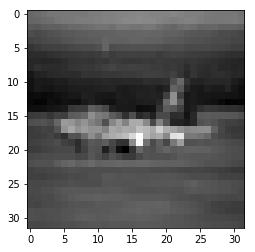

Bild Nr. 248
Richtiges Label [6]
Knn Label Ergebnis: [0]


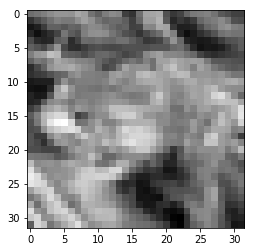

Bild Nr. 249
Richtiges Label [6]
Knn Label Ergebnis: [8]


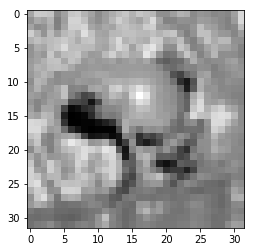

Bild Nr. 250
Richtiges Label [3]
Knn Label Ergebnis: [2]


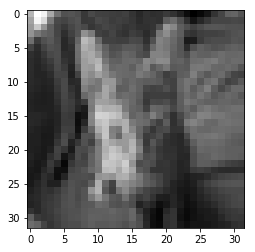

Bild Nr. 251
Richtiges Label [3]
Knn Label Ergebnis: [6]


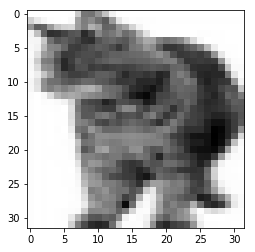

Bild Nr. 252
Richtiges Label [8]
Knn Label Ergebnis: [2]


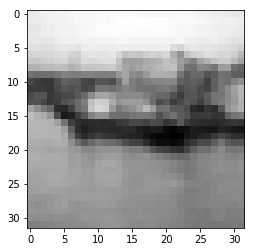

Bild Nr. 253
Richtiges Label [5]
Knn Label Ergebnis: [2]


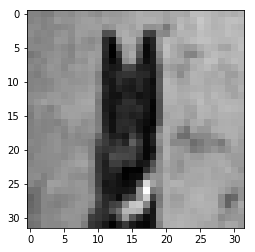

Bild Nr. 254
Richtiges Label [6]
Knn Label Ergebnis: [2]


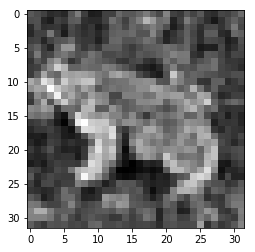

Bild Nr. 255
Richtiges Label [1]
Knn Label Ergebnis: [4]


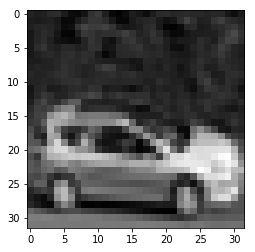

Bild Nr. 256
Richtiges Label [1]
Knn Label Ergebnis: [2]


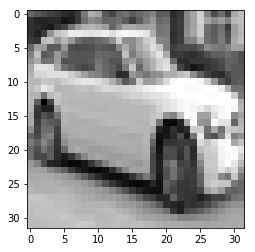

Bild Nr. 257
Richtiges Label [4]
Knn Label Ergebnis: [2]


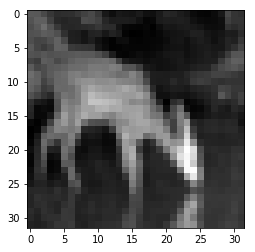

Bild Nr. 258
Richtiges Label [1]
Knn Label Ergebnis: [0]


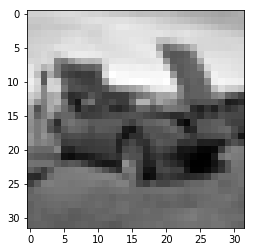

Bild Nr. 259
Richtiges Label [5]
Knn Label Ergebnis: [0]


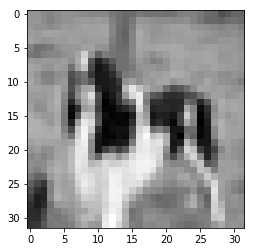

Bild Nr. 260
Richtiges Label [7]
Knn Label Ergebnis: [0]


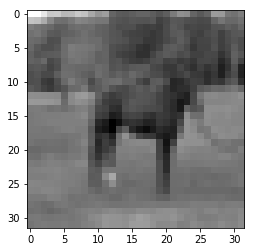

Bild Nr. 261
Richtiges Label [6]
Knn Label Ergebnis: [4]


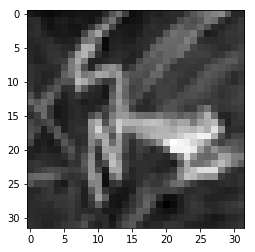

Bild Nr. 262
Richtiges Label [5]
Knn Label Ergebnis: [0]


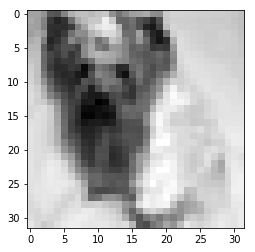

Bild Nr. 263
Richtiges Label [1]
Knn Label Ergebnis: [0]


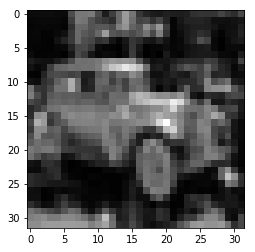

Bild Nr. 264
Richtiges Label [6]
Knn Label Ergebnis: [4]


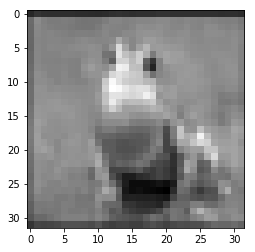

Bild Nr. 265
Richtiges Label [6]
Knn Label Ergebnis: [2]


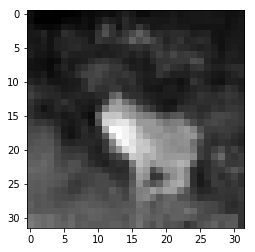

Bild Nr. 266
Richtiges Label [6]
Knn Label Ergebnis: [4]


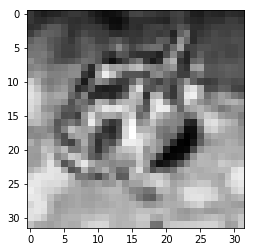

Bild Nr. 267
Richtiges Label [4]
Knn Label Ergebnis: [2]


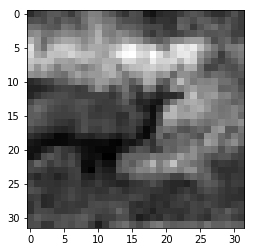

Bild Nr. 268
Richtiges Label [6]
Knn Label Ergebnis: [0]


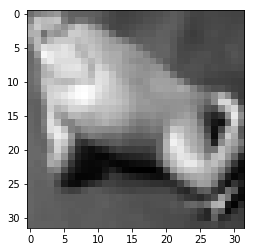

Bild Nr. 269
Richtiges Label [3]
Knn Label Ergebnis: [8]


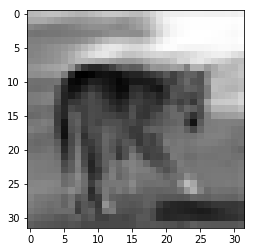

Bild Nr. 270
Richtiges Label [9]
Knn Label Ergebnis: [0]


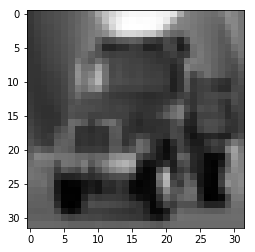

Bild Nr. 271
Richtiges Label [7]
Knn Label Ergebnis: [6]


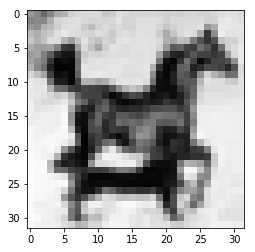

Bild Nr. 272
Richtiges Label [9]
Knn Label Ergebnis: [0]


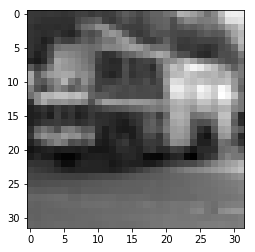

Bild Nr. 273
Richtiges Label [0]
Knn Label Ergebnis: [2]


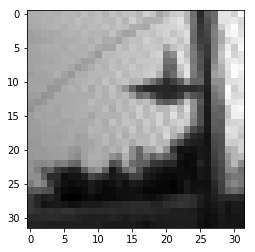

Bild Nr. 274
Richtiges Label [9]
Knn Label Ergebnis: [0]


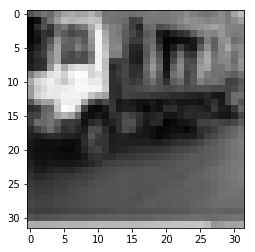

Bild Nr. 275
Richtiges Label [1]
Knn Label Ergebnis: [2]


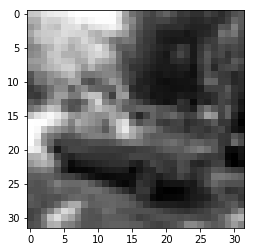

Bild Nr. 276
Richtiges Label [9]
Knn Label Ergebnis: [8]


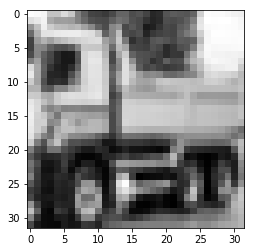

Bild Nr. 277
Richtiges Label [5]
Knn Label Ergebnis: [0]


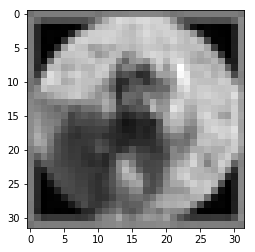

Bild Nr. 278
Richtiges Label [8]
Knn Label Ergebnis: [3]


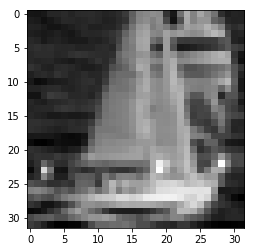

Bild Nr. 279
Richtiges Label [1]
Knn Label Ergebnis: [7]


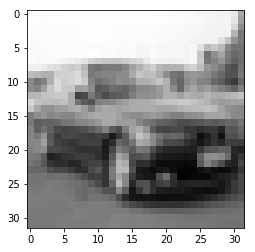

Bild Nr. 280
Richtiges Label [7]
Knn Label Ergebnis: [0]


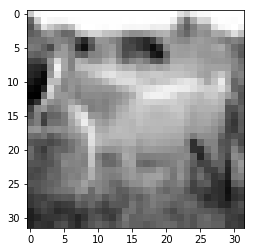

Bild Nr. 281
Richtiges Label [3]
Knn Label Ergebnis: [6]


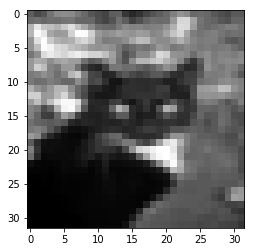

Bild Nr. 282
Richtiges Label [5]
Knn Label Ergebnis: [0]


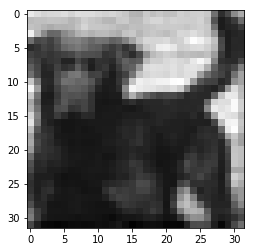

Bild Nr. 283
Richtiges Label [7]
Knn Label Ergebnis: [4]


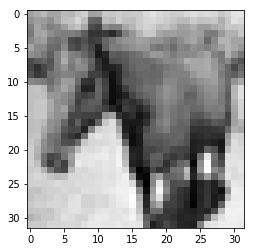

Bild Nr. 284
Richtiges Label [2]
Knn Label Ergebnis: [6]


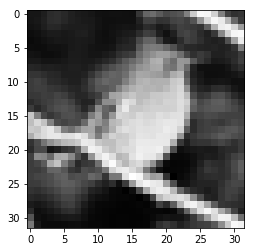

Bild Nr. 285
Richtiges Label [0]
Knn Label Ergebnis: [2]


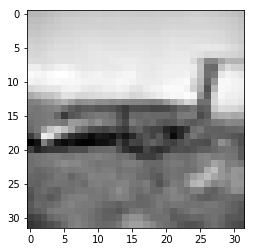

Bild Nr. 286
Richtiges Label [7]
Knn Label Ergebnis: [0]


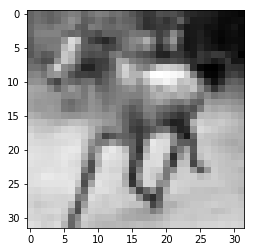

Bild Nr. 287
Richtiges Label [5]
Knn Label Ergebnis: [2]


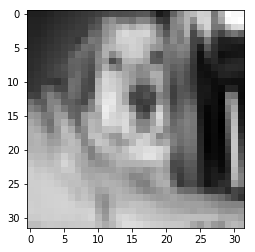

Bild Nr. 288
Richtiges Label [2]
Knn Label Ergebnis: [8]


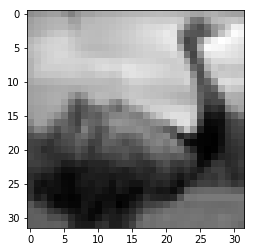

Bild Nr. 289
Richtiges Label [2]
Knn Label Ergebnis: [3]


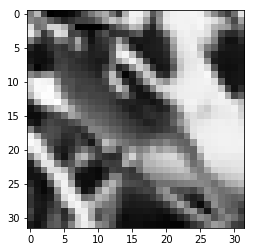

Bild Nr. 290
Richtiges Label [3]
Knn Label Ergebnis: [2]


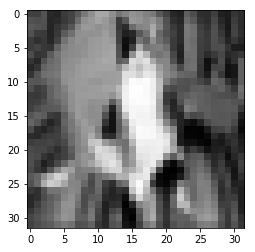

Bild Nr. 291
Richtiges Label [7]
Knn Label Ergebnis: [8]


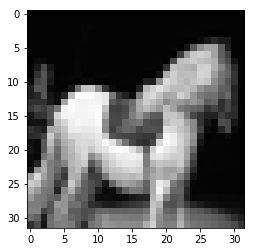

Bild Nr. 292
Richtiges Label [2]
Knn Label Ergebnis: [0]


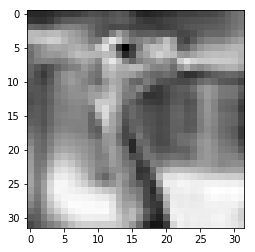

Bild Nr. 293
Richtiges Label [9]
Knn Label Ergebnis: [8]


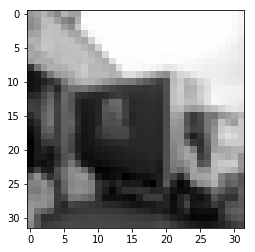

Bild Nr. 294
Richtiges Label [3]
Knn Label Ergebnis: [2]


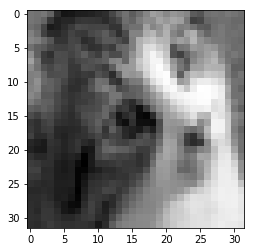

Bild Nr. 295
Richtiges Label [2]
Knn Label Ergebnis: [0]


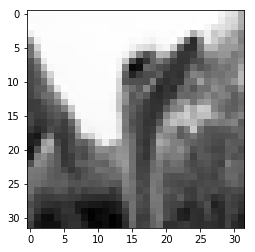

Bild Nr. 296
Richtiges Label [6]
Knn Label Ergebnis: [8]


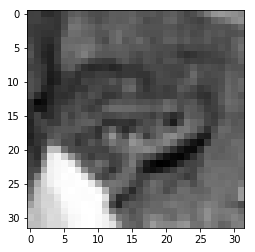

Bild Nr. 297
Richtiges Label [8]
Knn Label Ergebnis: [4]


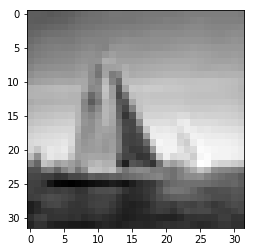

Bild Nr. 298
Richtiges Label [9]
Knn Label Ergebnis: [0]


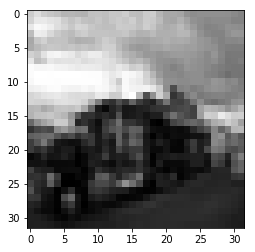

Bild Nr. 299
Richtiges Label [1]
Knn Label Ergebnis: [5]


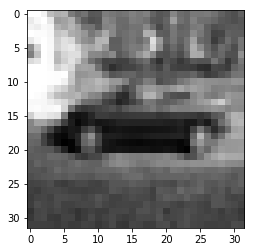

Bild Nr. 300
Richtiges Label [5]
Knn Label Ergebnis: [0]


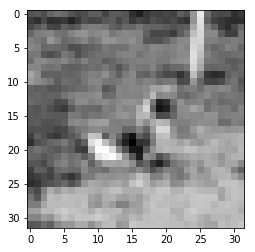

Bild Nr. 301
Richtiges Label [4]
Knn Label Ergebnis: [5]


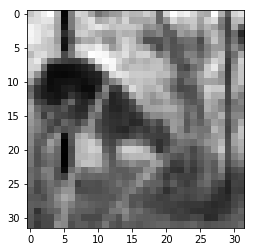

Bild Nr. 302
Richtiges Label [5]
Knn Label Ergebnis: [0]


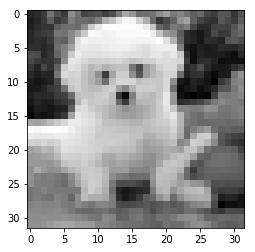

Bild Nr. 303
Richtiges Label [5]
Knn Label Ergebnis: [4]


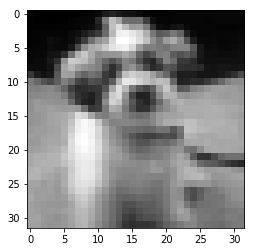

Bild Nr. 304
Richtiges Label [4]
Knn Label Ergebnis: [0]


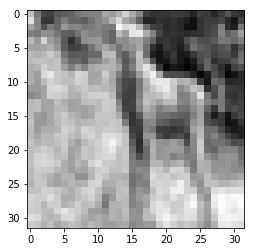

Bild Nr. 305
Richtiges Label [6]
Knn Label Ergebnis: [8]


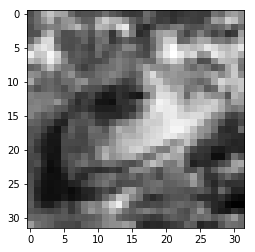

Bild Nr. 306
Richtiges Label [4]
Knn Label Ergebnis: [0]


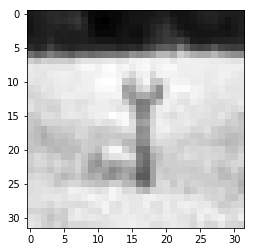

Bild Nr. 307
Richtiges Label [4]
Knn Label Ergebnis: [0]


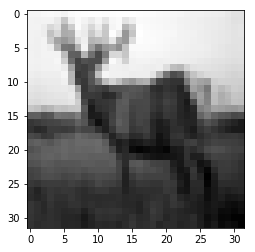

Bild Nr. 308
Richtiges Label [9]
Knn Label Ergebnis: [2]


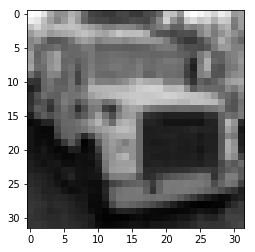

Bild Nr. 309
Richtiges Label [7]
Knn Label Ergebnis: [2]


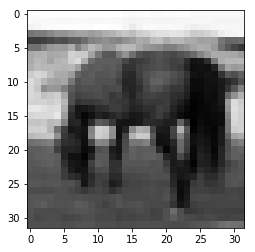

Bild Nr. 310
Richtiges Label [1]
Knn Label Ergebnis: [0]


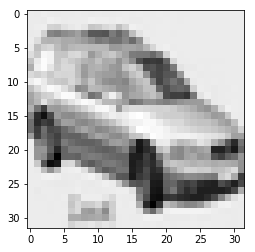

Bild Nr. 311
Richtiges Label [6]
Knn Label Ergebnis: [2]


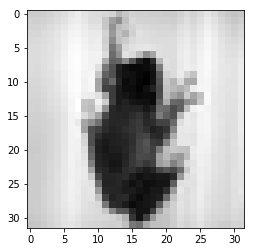

Bild Nr. 312
Richtiges Label [1]
Knn Label Ergebnis: [7]


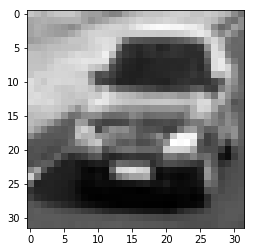

Bild Nr. 313
Richtiges Label [5]
Knn Label Ergebnis: [0]


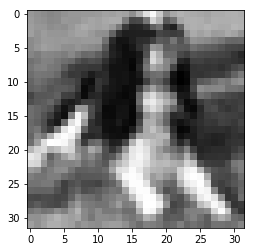

Bild Nr. 314
Richtiges Label [7]
Knn Label Ergebnis: [0]


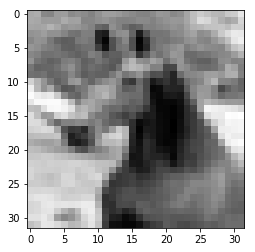

Bild Nr. 315
Richtiges Label [2]
Knn Label Ergebnis: [5]


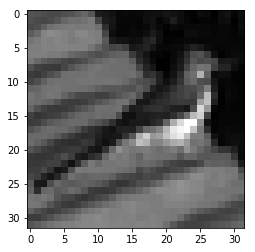

Bild Nr. 316
Richtiges Label [7]
Knn Label Ergebnis: [2]


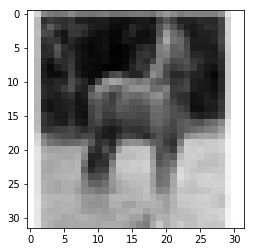

Bild Nr. 317
Richtiges Label [9]
Knn Label Ergebnis: [3]


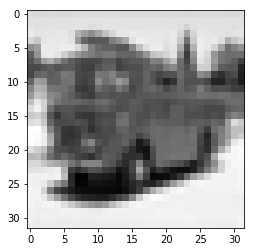

Bild Nr. 318
Richtiges Label [1]
Knn Label Ergebnis: [3]


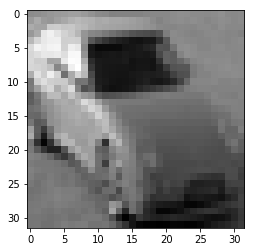

Bild Nr. 319
Richtiges Label [8]
Knn Label Ergebnis: [4]


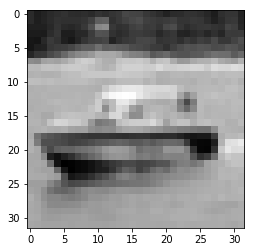

Bild Nr. 320
Richtiges Label [2]
Knn Label Ergebnis: [7]


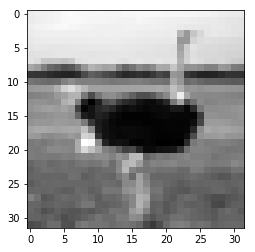

Bild Nr. 321
Richtiges Label [2]
Knn Label Ergebnis: [0]


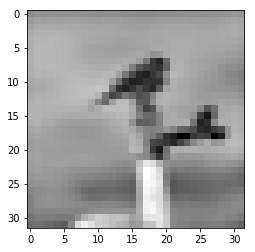

Bild Nr. 322
Richtiges Label [9]
Knn Label Ergebnis: [8]


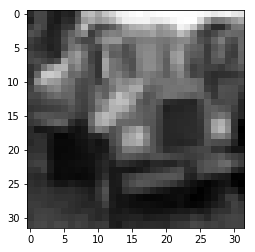

Bild Nr. 323
Richtiges Label [2]
Knn Label Ergebnis: [4]


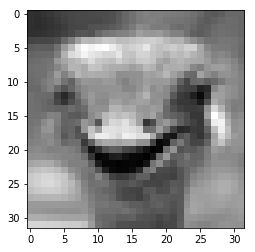

Bild Nr. 324
Richtiges Label [1]
Knn Label Ergebnis: [0]


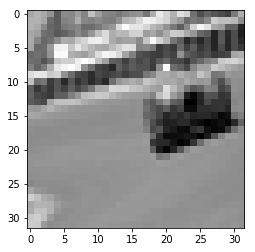

Bild Nr. 325
Richtiges Label [2]
Knn Label Ergebnis: [0]


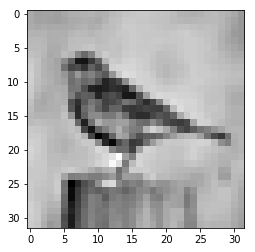

Bild Nr. 326
Richtiges Label [8]
Knn Label Ergebnis: [1]


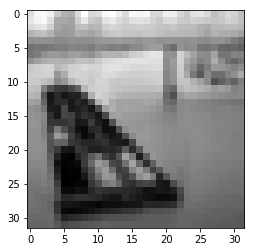

Bild Nr. 327
Richtiges Label [1]
Knn Label Ergebnis: [0]


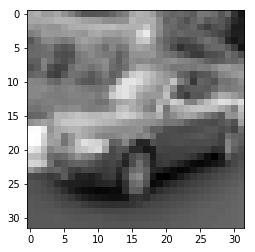

Bild Nr. 328
Richtiges Label [7]
Knn Label Ergebnis: [2]


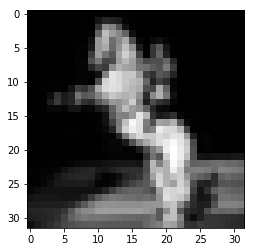

Bild Nr. 329
Richtiges Label [5]
Knn Label Ergebnis: [4]


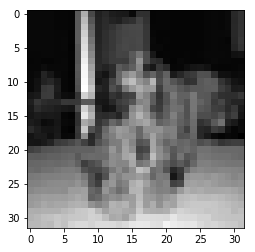

Bild Nr. 330
Richtiges Label [3]
Knn Label Ergebnis: [0]


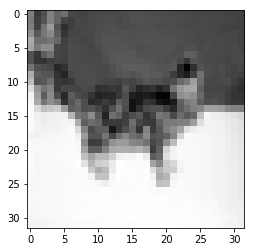

Bild Nr. 331
Richtiges Label [2]
Knn Label Ergebnis: [6]


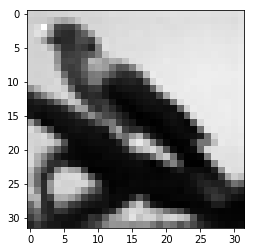

Bild Nr. 332
Richtiges Label [7]
Knn Label Ergebnis: [0]


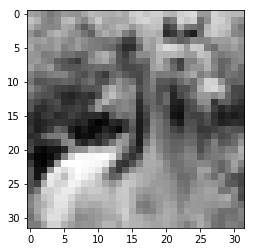

Bild Nr. 333
Richtiges Label [3]
Knn Label Ergebnis: [6]


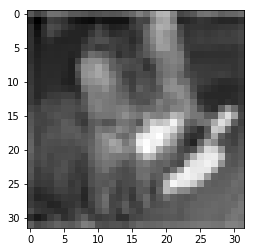

Bild Nr. 334
Richtiges Label [4]
Knn Label Ergebnis: [6]


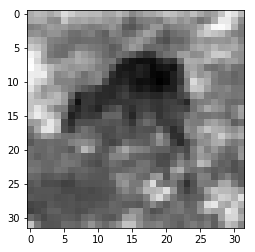

Bild Nr. 335
Richtiges Label [6]
Knn Label Ergebnis: [0]


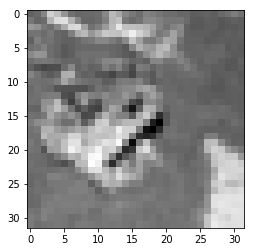

Bild Nr. 336
Richtiges Label [4]
Knn Label Ergebnis: [0]


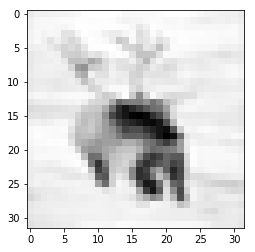

Bild Nr. 337
Richtiges Label [4]
Knn Label Ergebnis: [0]


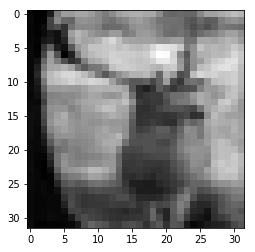

Bild Nr. 338
Richtiges Label [3]
Knn Label Ergebnis: [4]


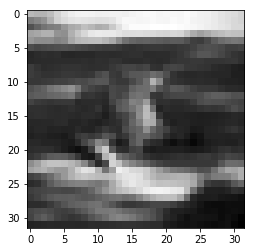

Bild Nr. 339
Richtiges Label [7]
Knn Label Ergebnis: [4]


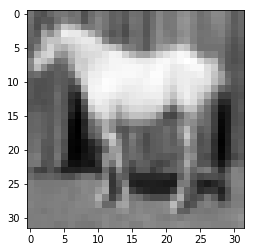

Bild Nr. 340
Richtiges Label [5]
Knn Label Ergebnis: [2]


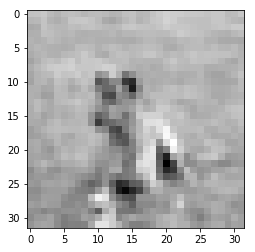

Bild Nr. 341
Richtiges Label [8]
Knn Label Ergebnis: [3]


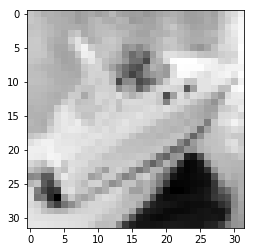

Bild Nr. 342
Richtiges Label [2]
Knn Label Ergebnis: [3]


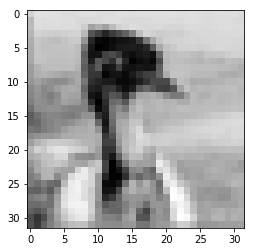

Bild Nr. 343
Richtiges Label [5]
Knn Label Ergebnis: [0]


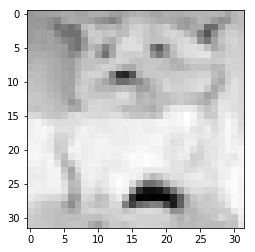

Bild Nr. 344
Richtiges Label [0]
Knn Label Ergebnis: [2]


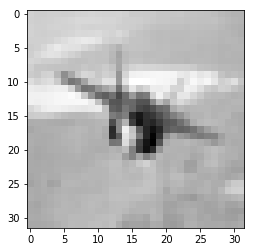

Bild Nr. 345
Richtiges Label [1]
Knn Label Ergebnis: [0]


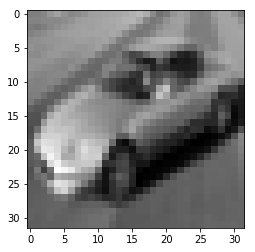

Bild Nr. 346
Richtiges Label [5]
Knn Label Ergebnis: [8]


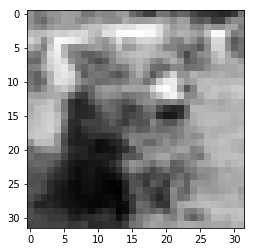

Bild Nr. 347
Richtiges Label [7]
Knn Label Ergebnis: [0]


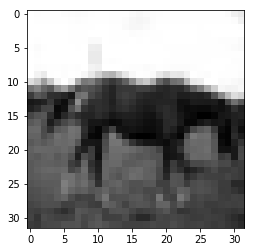

Bild Nr. 348
Richtiges Label [7]
Knn Label Ergebnis: [6]


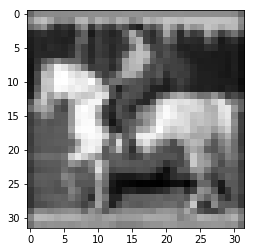

Bild Nr. 349
Richtiges Label [9]
Knn Label Ergebnis: [8]


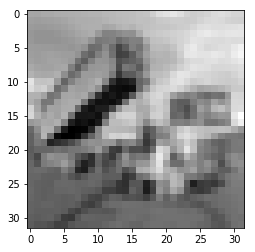

Bild Nr. 350
Richtiges Label [6]
Knn Label Ergebnis: [0]


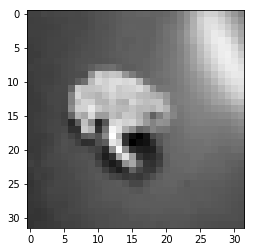

Bild Nr. 351
Richtiges Label [7]
Knn Label Ergebnis: [4]


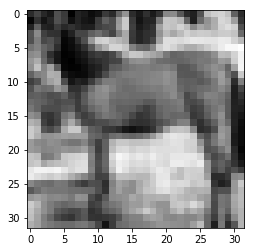

Bild Nr. 352
Richtiges Label [6]
Knn Label Ergebnis: [5]


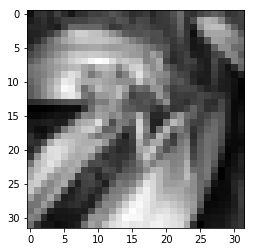

Bild Nr. 353
Richtiges Label [1]
Knn Label Ergebnis: [0]


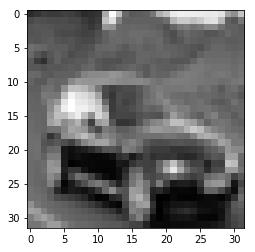

Bild Nr. 354
Richtiges Label [4]
Knn Label Ergebnis: [8]


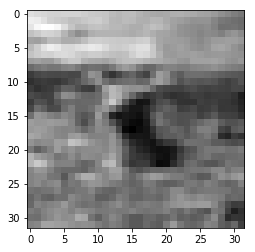

Bild Nr. 355
Richtiges Label [5]
Knn Label Ergebnis: [2]


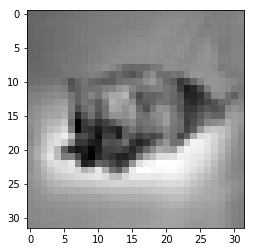

Bild Nr. 356
Richtiges Label [0]
Knn Label Ergebnis: [6]


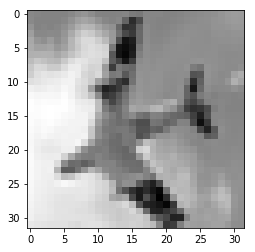

Bild Nr. 357
Richtiges Label [1]
Knn Label Ergebnis: [9]


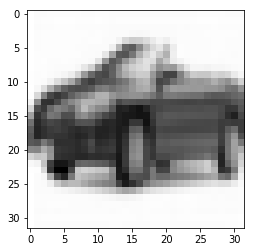

Bild Nr. 358
Richtiges Label [7]
Knn Label Ergebnis: [4]


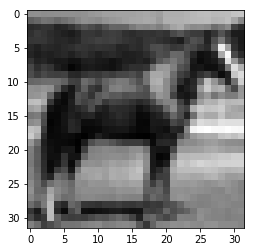

Bild Nr. 359
Richtiges Label [6]
Knn Label Ergebnis: [4]


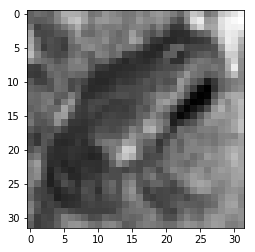

Bild Nr. 360
Richtiges Label [7]
Knn Label Ergebnis: [6]


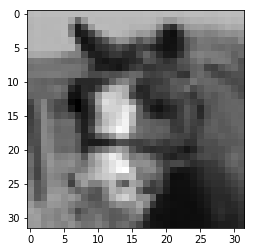

Bild Nr. 361
Richtiges Label [6]
Knn Label Ergebnis: [9]


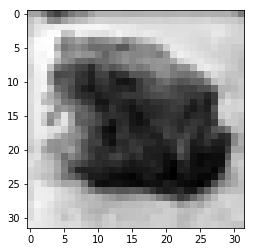

Bild Nr. 362
Richtiges Label [7]
Knn Label Ergebnis: [2]


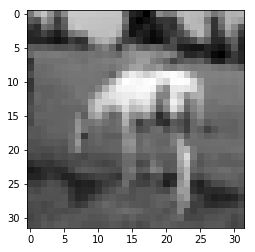

Bild Nr. 363
Richtiges Label [4]
Knn Label Ergebnis: [0]


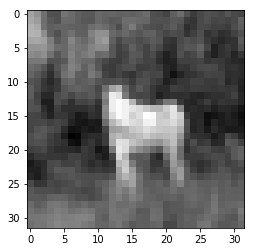

Bild Nr. 364
Richtiges Label [9]
Knn Label Ergebnis: [1]


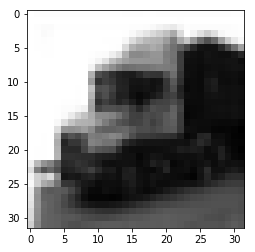

Bild Nr. 365
Richtiges Label [6]
Knn Label Ergebnis: [2]


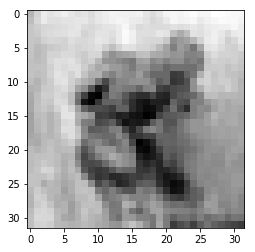

Bild Nr. 366
Richtiges Label [9]
Knn Label Ergebnis: [6]


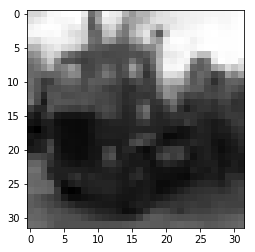

Bild Nr. 367
Richtiges Label [2]
Knn Label Ergebnis: [5]


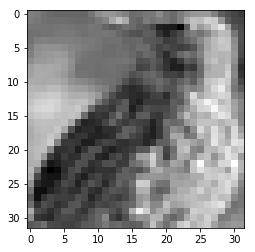

Bild Nr. 368
Richtiges Label [5]
Knn Label Ergebnis: [6]


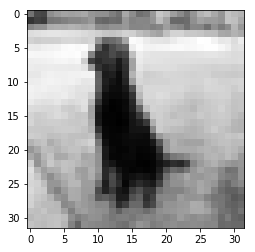

Bild Nr. 369
Richtiges Label [5]
Knn Label Ergebnis: [6]


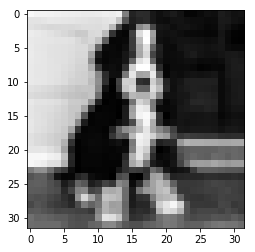

Bild Nr. 370
Richtiges Label [6]
Knn Label Ergebnis: [2]


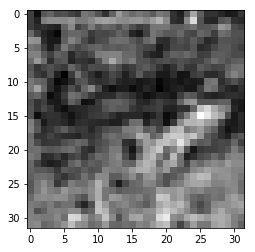

Bild Nr. 371
Richtiges Label [5]
Knn Label Ergebnis: [6]


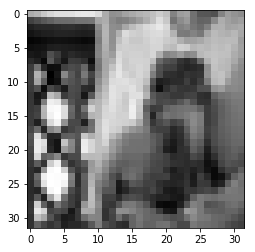

Bild Nr. 372
Richtiges Label [7]
Knn Label Ergebnis: [0]


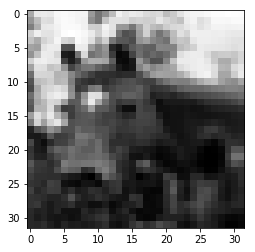

Bild Nr. 373
Richtiges Label [5]
Knn Label Ergebnis: [4]


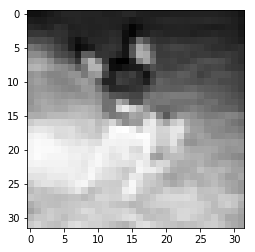

Bild Nr. 374
Richtiges Label [3]
Knn Label Ergebnis: [0]


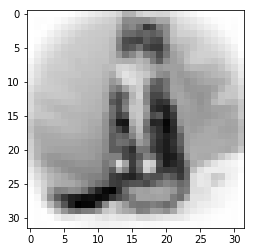

Bild Nr. 375
Richtiges Label [3]
Knn Label Ergebnis: [2]


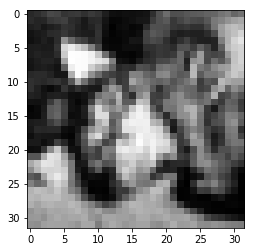

Bild Nr. 376
Richtiges Label [5]
Knn Label Ergebnis: [2]


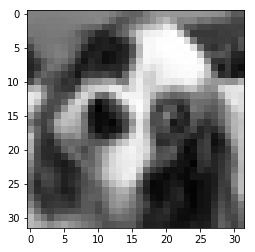

Bild Nr. 377
Richtiges Label [4]
Knn Label Ergebnis: [0]


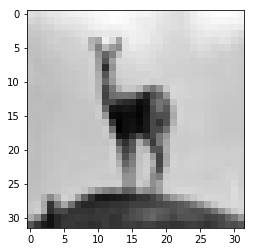

Bild Nr. 378
Richtiges Label [3]
Knn Label Ergebnis: [6]


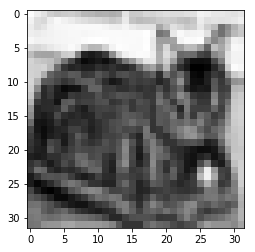

Bild Nr. 379
Richtiges Label [1]
Knn Label Ergebnis: [2]


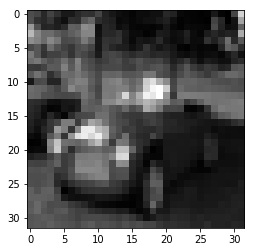

Bild Nr. 380
Richtiges Label [7]
Knn Label Ergebnis: [2]


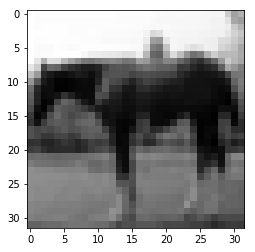

Bild Nr. 381
Richtiges Label [1]
Knn Label Ergebnis: [2]


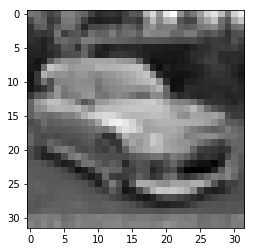

Bild Nr. 382
Richtiges Label [7]
Knn Label Ergebnis: [0]


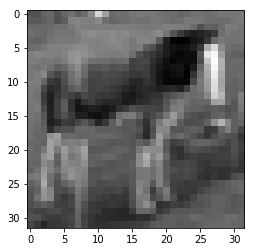

Bild Nr. 383
Richtiges Label [4]
Knn Label Ergebnis: [0]


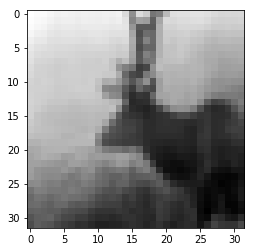

Bild Nr. 384
Richtiges Label [4]
Knn Label Ergebnis: [2]


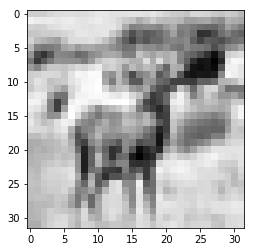

Bild Nr. 385
Richtiges Label [5]
Knn Label Ergebnis: [6]


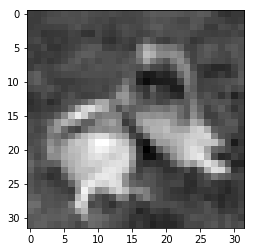

Bild Nr. 386
Richtiges Label [7]
Knn Label Ergebnis: [8]


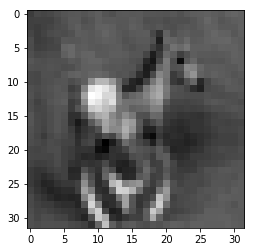

Bild Nr. 387
Richtiges Label [3]
Knn Label Ergebnis: [5]


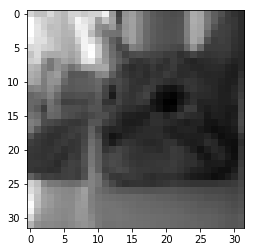

Bild Nr. 388
Richtiges Label [8]
Knn Label Ergebnis: [0]


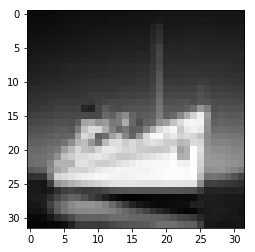

Bild Nr. 389
Richtiges Label [2]
Knn Label Ergebnis: [0]


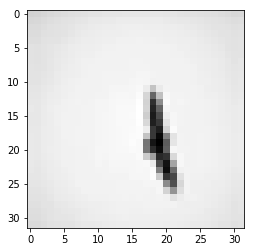

Bild Nr. 390
Richtiges Label [3]
Knn Label Ergebnis: [5]


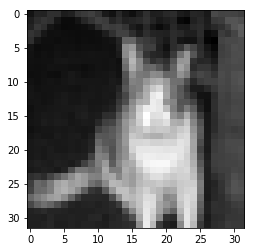

Confusion matrix, without normalization
[[21  0  7  0  4  1  1  1  4  0]
 [12  5  7  3  6  1  4  2  8  1]
 [11  0 19  4  9  3  3  1  1  0]
 [15  0 13 11  9  3  7  0  3  1]
 [10  0 15  5 11  2  2  1  2  0]
 [12  0 11  2  9 12  4  0  3  0]
 [10  0 11  5  9  3  8  0  5  1]
 [17  2 13  4  7  1  3  3  5  0]
 [10  2  6  2  9  0  0  0 17  0]
 [11  2  4  6  6  0  2  0 11  3]]


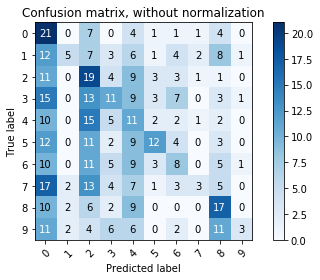

In [0]:
data_preparation()
knn_result = knn(2)
calc_error(knn_result)

KNN für k= 4
Errorrate:  79.4 %
Errorrate für 0  =  66.67 %
Errorrate für 1  =  89.8 %
Errorrate für 2  =  64.71 %
Errorrate für 3  =  85.48 %
Errorrate für 4  =  72.92 %
Errorrate für 5  =  81.13 %
Errorrate für 6  =  88.46 %
Errorrate für 7  =  89.09 %
Errorrate für 8  =  56.52 %
Errorrate für 9  =  93.33 %
Index der Fehler im Sampleset:  [0, 1, 3, 4, 5, 6, 7, 9, 11, 12, 13, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 36, 37, 38, 39, 40, 41, 42, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 55, 56, 57, 58, 60, 61, 62, 63, 65, 66, 67, 69, 70, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 100, 101, 102, 103, 106, 107, 108, 110, 111, 112, 115, 116, 117, 118, 120, 122, 123, 124, 125, 126, 127, 128, 130, 131, 132, 133, 134, 136, 137, 139, 140, 141, 142, 143, 144, 145, 146, 147, 149, 150, 151, 152, 153, 154, 155, 156, 159, 161, 162, 164, 165, 166, 167, 168, 169, 170, 173, 175, 176, 177, 178, 179, 180, 181, 182,

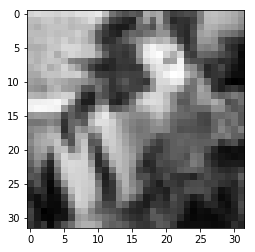

Bild Nr. 2
Richtiges Label [5]
Knn Label Ergebnis: [8]


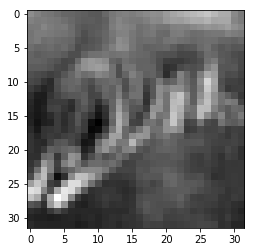

Bild Nr. 3
Richtiges Label [1]
Knn Label Ergebnis: [3]


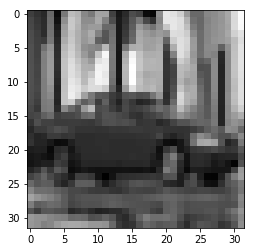

Bild Nr. 4
Richtiges Label [2]
Knn Label Ergebnis: [4]


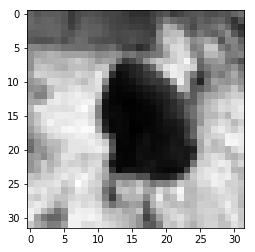

Bild Nr. 5
Richtiges Label [6]
Knn Label Ergebnis: [4]


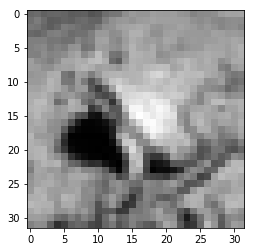

Bild Nr. 6
Richtiges Label [1]
Knn Label Ergebnis: [8]


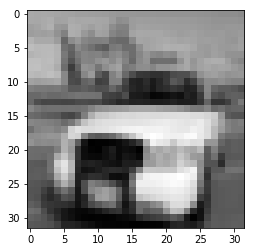

Bild Nr. 7
Richtiges Label [9]
Knn Label Ergebnis: [1]


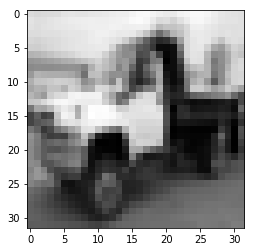

Bild Nr. 8
Richtiges Label [1]
Knn Label Ergebnis: [8]


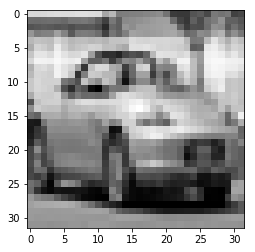

Bild Nr. 9
Richtiges Label [5]
Knn Label Ergebnis: [7]


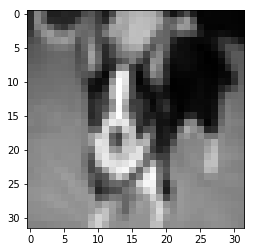

Bild Nr. 10
Richtiges Label [3]
Knn Label Ergebnis: [4]


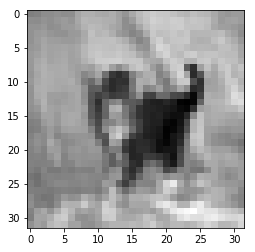

Bild Nr. 11
Richtiges Label [6]
Knn Label Ergebnis: [2]


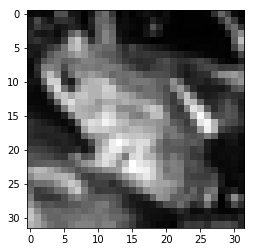

Bild Nr. 12
Richtiges Label [7]
Knn Label Ergebnis: [8]


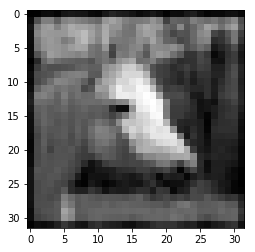

Bild Nr. 13
Richtiges Label [6]
Knn Label Ergebnis: [3]


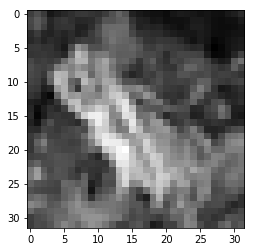

Bild Nr. 14
Richtiges Label [7]
Knn Label Ergebnis: [8]


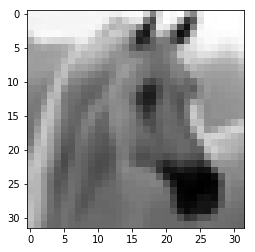

Bild Nr. 15
Richtiges Label [1]
Knn Label Ergebnis: [6]


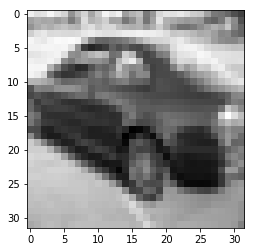

Bild Nr. 16
Richtiges Label [8]
Knn Label Ergebnis: [4]


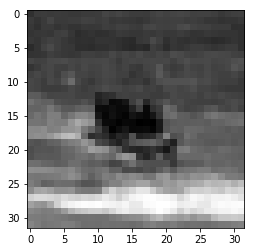

Bild Nr. 17
Richtiges Label [0]
Knn Label Ergebnis: [7]


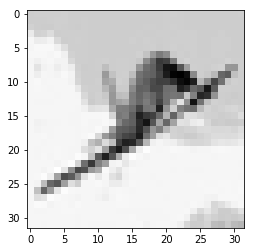

Bild Nr. 18
Richtiges Label [6]
Knn Label Ergebnis: [0]


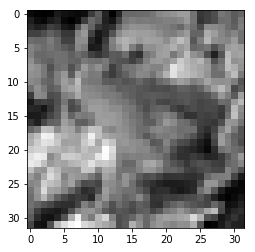

Bild Nr. 19
Richtiges Label [9]
Knn Label Ergebnis: [2]


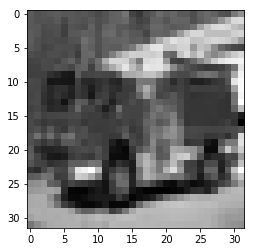

Bild Nr. 20
Richtiges Label [0]
Knn Label Ergebnis: [8]


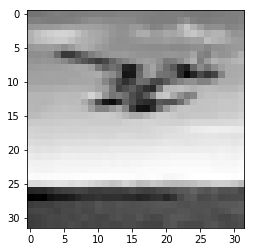

Bild Nr. 21
Richtiges Label [0]
Knn Label Ergebnis: [2]


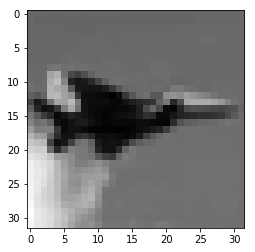

Bild Nr. 22
Richtiges Label [2]
Knn Label Ergebnis: [4]


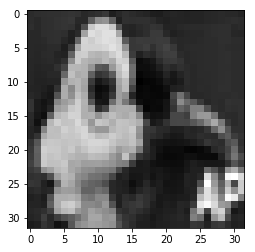

Bild Nr. 23
Richtiges Label [3]
Knn Label Ergebnis: [4]


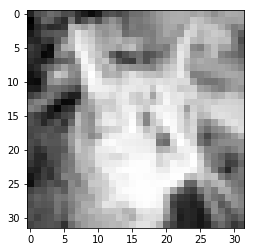

Bild Nr. 24
Richtiges Label [4]
Knn Label Ergebnis: [0]


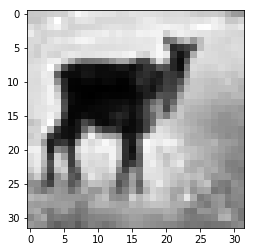

Bild Nr. 25
Richtiges Label [3]
Knn Label Ergebnis: [2]


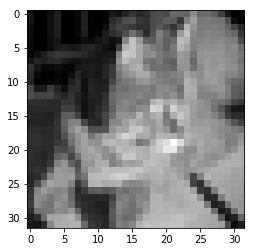

Bild Nr. 26
Richtiges Label [2]
Knn Label Ergebnis: [0]


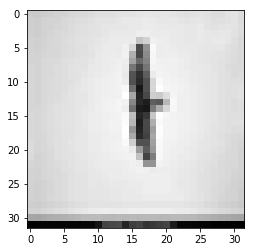

Bild Nr. 27
Richtiges Label [1]
Knn Label Ergebnis: [5]


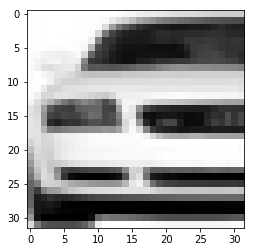

Bild Nr. 28
Richtiges Label [6]
Knn Label Ergebnis: [2]


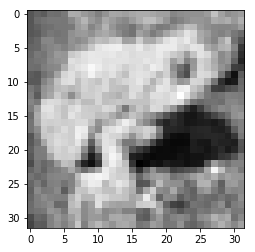

Bild Nr. 29
Richtiges Label [7]
Knn Label Ergebnis: [0]


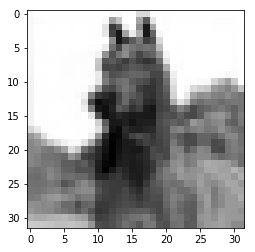

Bild Nr. 30
Richtiges Label [5]
Knn Label Ergebnis: [8]


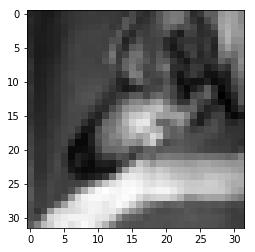

Bild Nr. 31
Richtiges Label [1]
Knn Label Ergebnis: [8]


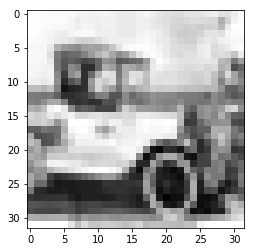

Bild Nr. 32
Richtiges Label [8]
Knn Label Ergebnis: [0]


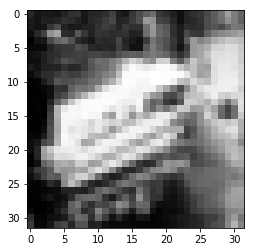

Bild Nr. 33
Richtiges Label [9]
Knn Label Ergebnis: [8]


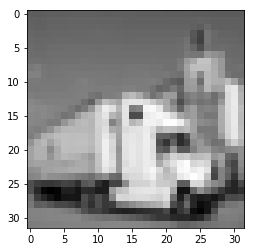

Bild Nr. 34
Richtiges Label [7]
Knn Label Ergebnis: [1]


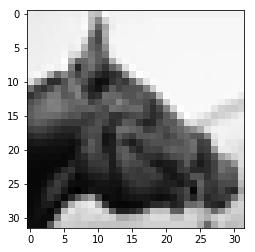

Bild Nr. 35
Richtiges Label [5]
Knn Label Ergebnis: [2]


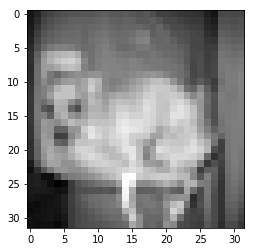

Bild Nr. 36
Richtiges Label [1]
Knn Label Ergebnis: [2]


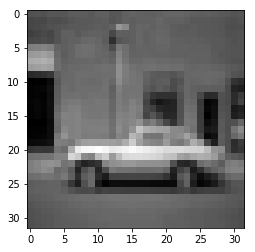

Bild Nr. 37
Richtiges Label [8]
Knn Label Ergebnis: [0]


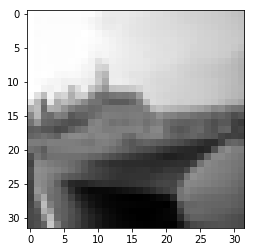

Bild Nr. 38
Richtiges Label [7]
Knn Label Ergebnis: [0]


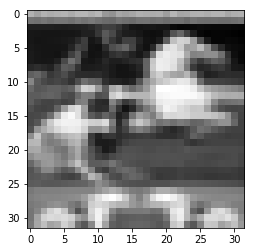

Bild Nr. 39
Richtiges Label [6]
Knn Label Ergebnis: [5]


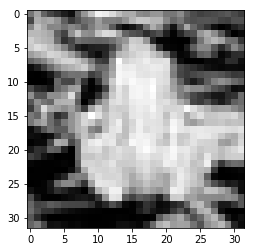

Bild Nr. 40
Richtiges Label [9]
Knn Label Ergebnis: [2]


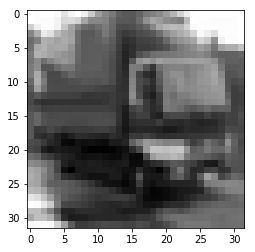

Bild Nr. 41
Richtiges Label [4]
Knn Label Ergebnis: [2]


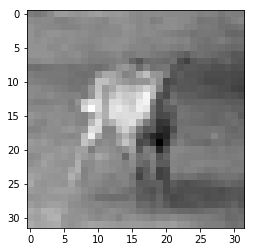

Bild Nr. 42
Richtiges Label [0]
Knn Label Ergebnis: [8]


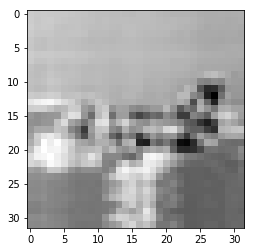

Bild Nr. 43
Richtiges Label [9]
Knn Label Ergebnis: [3]


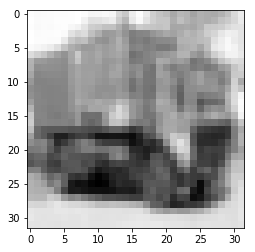

Bild Nr. 44
Richtiges Label [3]
Knn Label Ergebnis: [0]


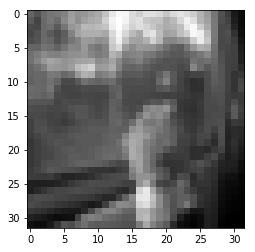

Bild Nr. 45
Richtiges Label [3]
Knn Label Ergebnis: [2]


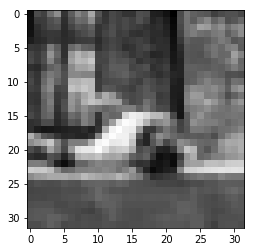

Bild Nr. 46
Richtiges Label [4]
Knn Label Ergebnis: [8]


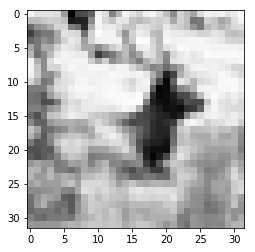

Bild Nr. 47
Richtiges Label [3]
Knn Label Ergebnis: [6]


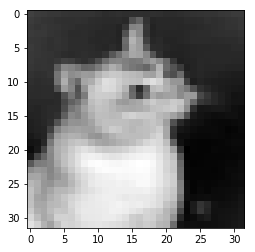

Bild Nr. 48
Richtiges Label [6]
Knn Label Ergebnis: [5]


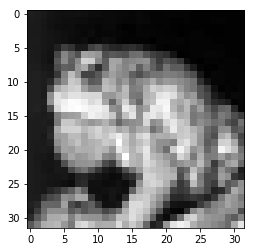

Bild Nr. 49
Richtiges Label [5]
Knn Label Ergebnis: [2]


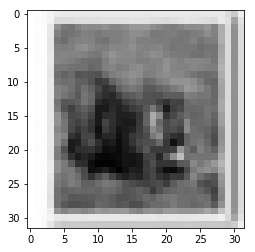

Bild Nr. 50
Richtiges Label [6]
Knn Label Ergebnis: [0]


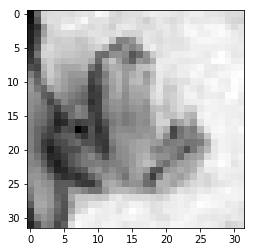

Bild Nr. 51
Richtiges Label [9]
Knn Label Ergebnis: [4]


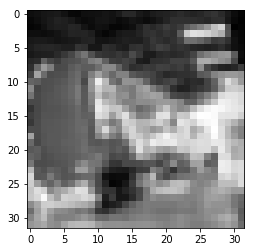

Bild Nr. 52
Richtiges Label [5]
Knn Label Ergebnis: [0]


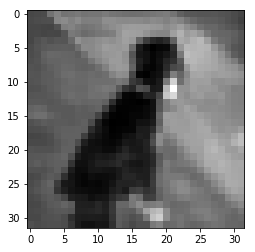

Bild Nr. 53
Richtiges Label [5]
Knn Label Ergebnis: [4]


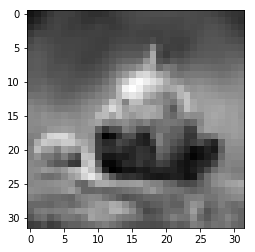

Bild Nr. 54
Richtiges Label [5]
Knn Label Ergebnis: [0]


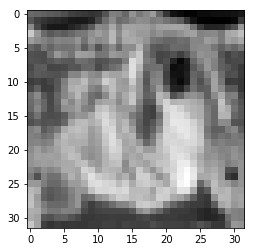

Bild Nr. 55
Richtiges Label [7]
Knn Label Ergebnis: [4]


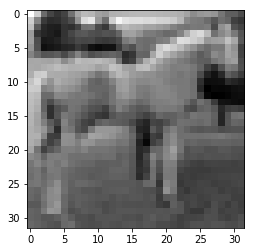

Bild Nr. 56
Richtiges Label [4]
Knn Label Ergebnis: [0]


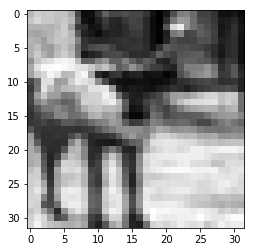

Bild Nr. 57
Richtiges Label [7]
Knn Label Ergebnis: [2]


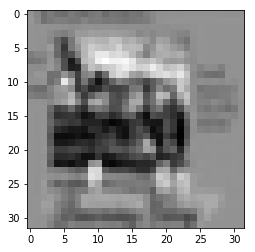

Bild Nr. 58
Richtiges Label [5]
Knn Label Ergebnis: [0]


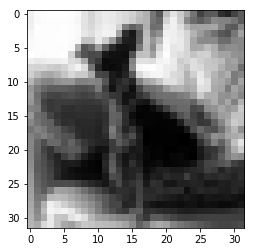

Bild Nr. 59
Richtiges Label [9]
Knn Label Ergebnis: [0]


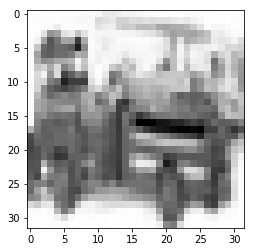

Bild Nr. 60
Richtiges Label [7]
Knn Label Ergebnis: [2]


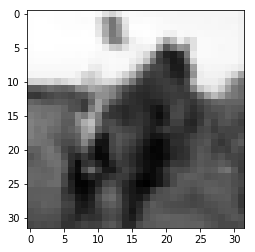

Bild Nr. 61
Richtiges Label [0]
Knn Label Ergebnis: [4]


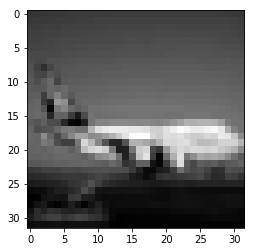

Bild Nr. 62
Richtiges Label [5]
Knn Label Ergebnis: [4]


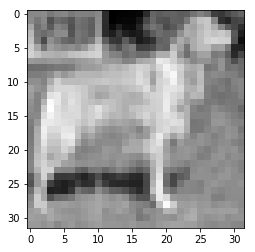

Bild Nr. 63
Richtiges Label [7]
Knn Label Ergebnis: [3]


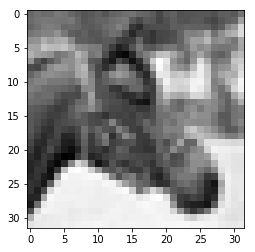

Bild Nr. 64
Richtiges Label [9]
Knn Label Ergebnis: [4]


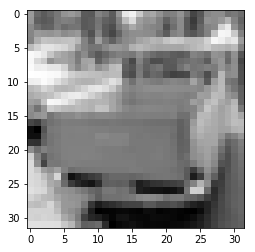

Bild Nr. 65
Richtiges Label [4]
Knn Label Ergebnis: [6]


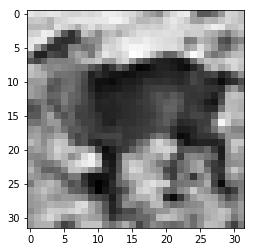

Bild Nr. 66
Richtiges Label [9]
Knn Label Ergebnis: [4]


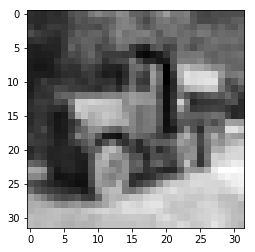

Bild Nr. 67
Richtiges Label [5]
Knn Label Ergebnis: [0]


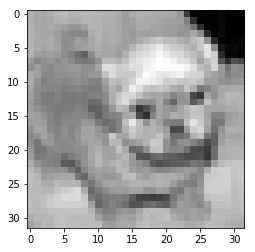

Bild Nr. 68
Richtiges Label [0]
Knn Label Ergebnis: [8]


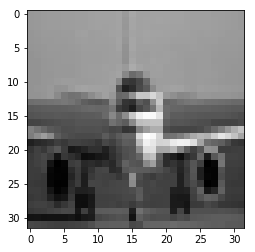

Bild Nr. 69
Richtiges Label [9]
Knn Label Ergebnis: [3]


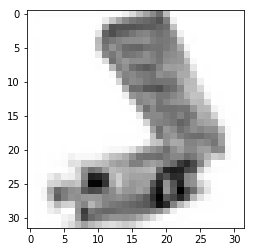

Bild Nr. 70
Richtiges Label [5]
Knn Label Ergebnis: [2]


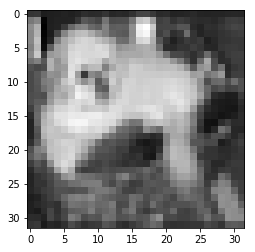

Bild Nr. 71
Richtiges Label [8]
Knn Label Ergebnis: [2]


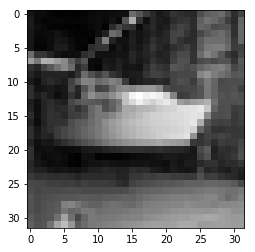

Bild Nr. 72
Richtiges Label [3]
Knn Label Ergebnis: [2]


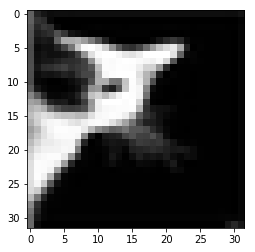

Bild Nr. 73
Richtiges Label [0]
Knn Label Ergebnis: [8]


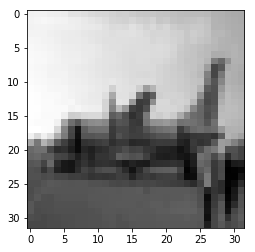

Bild Nr. 74
Richtiges Label [9]
Knn Label Ergebnis: [4]


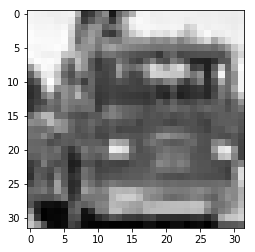

Bild Nr. 75
Richtiges Label [9]
Knn Label Ergebnis: [8]


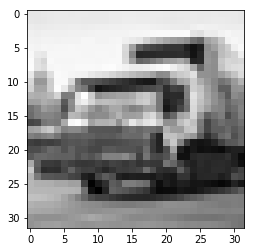

Bild Nr. 76
Richtiges Label [2]
Knn Label Ergebnis: [4]


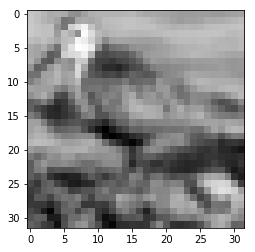

Bild Nr. 77
Richtiges Label [2]
Knn Label Ergebnis: [3]


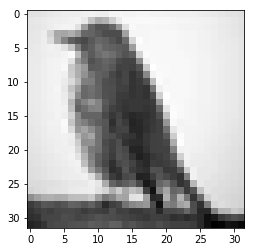

Bild Nr. 78
Richtiges Label [3]
Knn Label Ergebnis: [2]


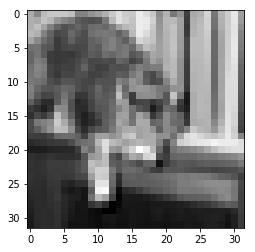

Bild Nr. 79
Richtiges Label [6]
Knn Label Ergebnis: [0]


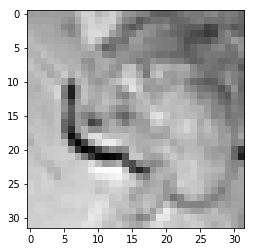

Bild Nr. 80
Richtiges Label [4]
Knn Label Ergebnis: [2]


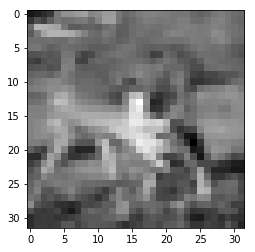

Bild Nr. 81
Richtiges Label [4]
Knn Label Ergebnis: [8]


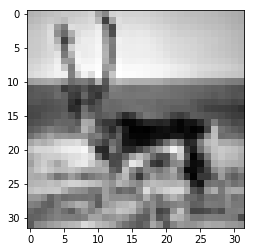

Bild Nr. 82
Richtiges Label [5]
Knn Label Ergebnis: [3]


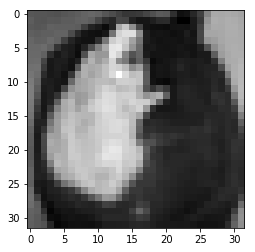

Bild Nr. 83
Richtiges Label [6]
Knn Label Ergebnis: [8]


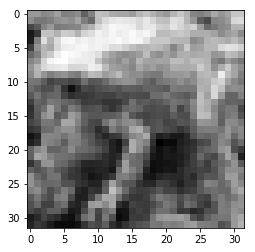

Bild Nr. 84
Richtiges Label [3]
Knn Label Ergebnis: [6]


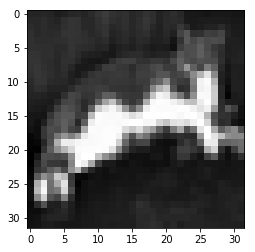

Bild Nr. 85
Richtiges Label [0]
Knn Label Ergebnis: [6]


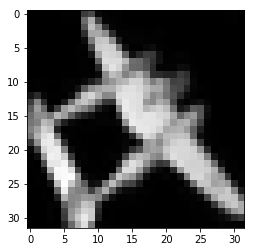

Bild Nr. 86
Richtiges Label [5]
Knn Label Ergebnis: [0]


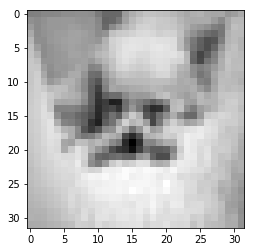

Bild Nr. 87
Richtiges Label [6]
Knn Label Ergebnis: [8]


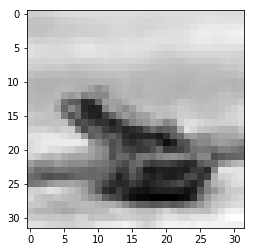

Bild Nr. 88
Richtiges Label [8]
Knn Label Ergebnis: [0]


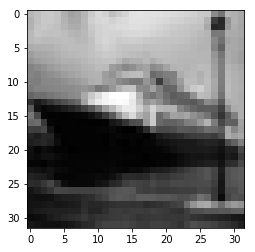

Bild Nr. 89
Richtiges Label [4]
Knn Label Ergebnis: [2]


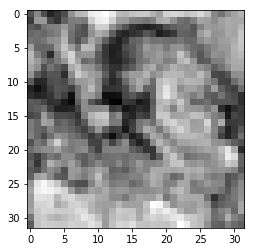

Bild Nr. 90
Richtiges Label [9]
Knn Label Ergebnis: [8]


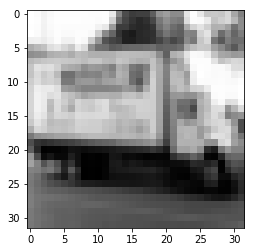

Bild Nr. 91
Richtiges Label [7]
Knn Label Ergebnis: [4]


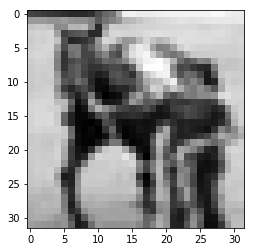

Bild Nr. 92
Richtiges Label [4]
Knn Label Ergebnis: [9]


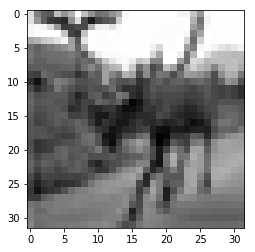

Bild Nr. 93
Richtiges Label [7]
Knn Label Ergebnis: [4]


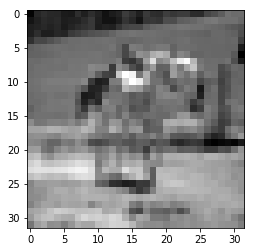

Bild Nr. 94
Richtiges Label [7]
Knn Label Ergebnis: [2]


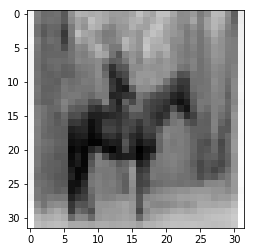

Bild Nr. 95
Richtiges Label [8]
Knn Label Ergebnis: [0]


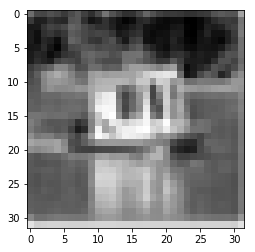

Bild Nr. 96
Richtiges Label [0]
Knn Label Ergebnis: [2]


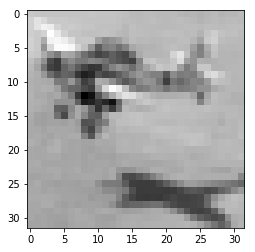

Bild Nr. 97
Richtiges Label [4]
Knn Label Ergebnis: [2]


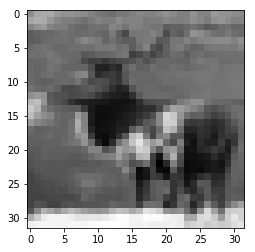

Bild Nr. 98
Richtiges Label [1]
Knn Label Ergebnis: [2]


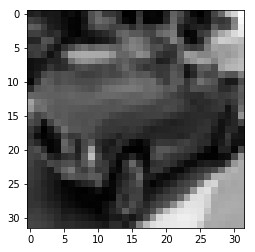

Bild Nr. 99
Richtiges Label [2]
Knn Label Ergebnis: [4]


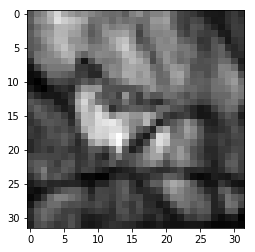

Bild Nr. 100
Richtiges Label [7]
Knn Label Ergebnis: [2]


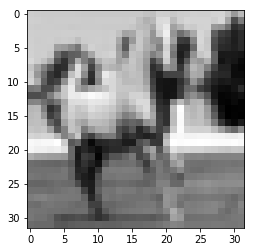

Bild Nr. 101
Richtiges Label [3]
Knn Label Ergebnis: [0]


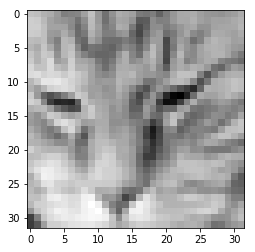

Bild Nr. 102
Richtiges Label [6]
Knn Label Ergebnis: [4]


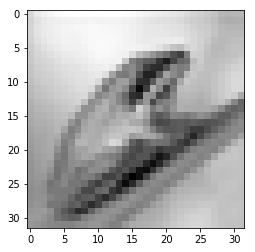

Bild Nr. 103
Richtiges Label [9]
Knn Label Ergebnis: [8]


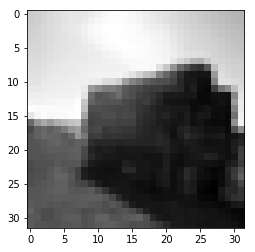

Bild Nr. 104
Richtiges Label [1]
Knn Label Ergebnis: [8]


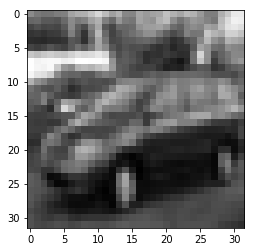

Bild Nr. 105
Richtiges Label [4]
Knn Label Ergebnis: [2]


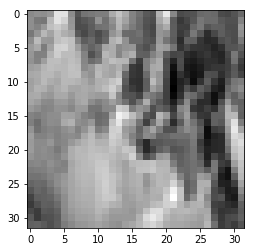

Bild Nr. 106
Richtiges Label [7]
Knn Label Ergebnis: [6]


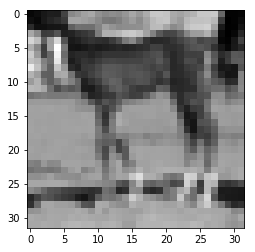

Bild Nr. 107
Richtiges Label [9]
Knn Label Ergebnis: [8]


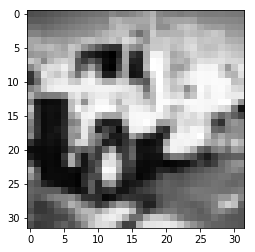

Bild Nr. 108
Richtiges Label [1]
Knn Label Ergebnis: [7]


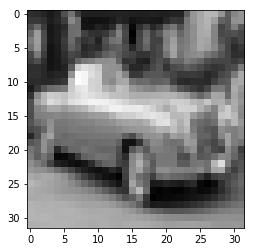

Bild Nr. 109
Richtiges Label [3]
Knn Label Ergebnis: [4]


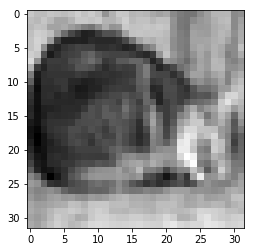

Bild Nr. 110
Richtiges Label [0]
Knn Label Ergebnis: [8]


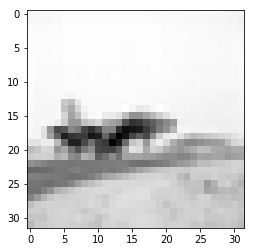

Bild Nr. 111
Richtiges Label [2]
Knn Label Ergebnis: [0]


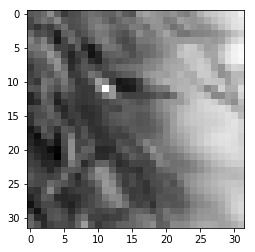

Bild Nr. 112
Richtiges Label [3]
Knn Label Ergebnis: [0]


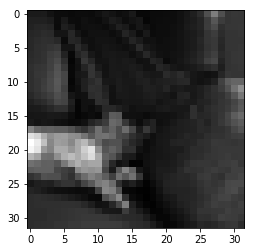

Bild Nr. 113
Richtiges Label [5]
Knn Label Ergebnis: [4]


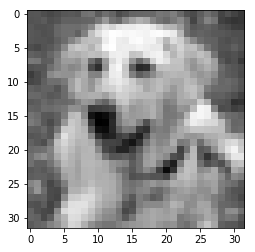

Bild Nr. 114
Richtiges Label [1]
Knn Label Ergebnis: [8]


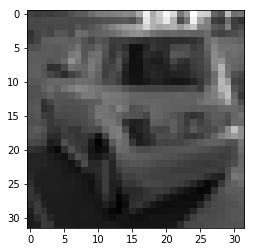

Bild Nr. 115
Richtiges Label [1]
Knn Label Ergebnis: [4]


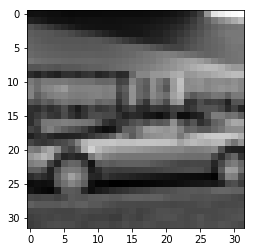

Bild Nr. 116
Richtiges Label [1]
Knn Label Ergebnis: [6]


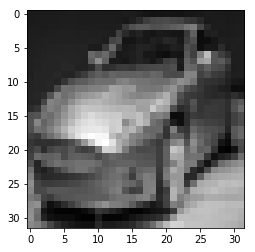

Bild Nr. 117
Richtiges Label [6]
Knn Label Ergebnis: [4]


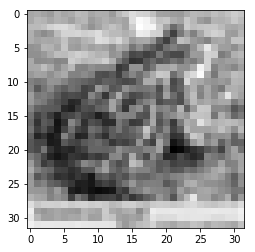

Bild Nr. 118
Richtiges Label [7]
Knn Label Ergebnis: [0]


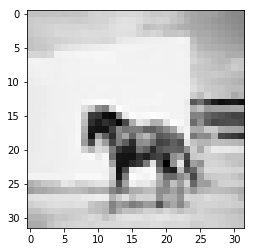

Bild Nr. 119
Richtiges Label [8]
Knn Label Ergebnis: [4]


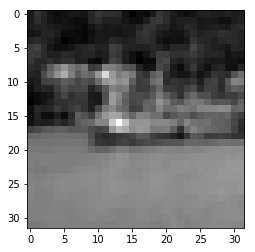

Bild Nr. 120
Richtiges Label [1]
Knn Label Ergebnis: [2]


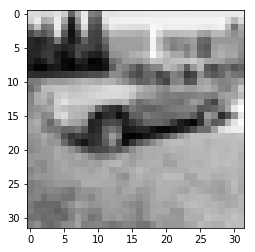

Bild Nr. 121
Richtiges Label [9]
Knn Label Ergebnis: [4]


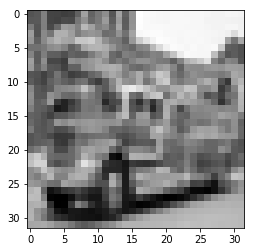

Bild Nr. 122
Richtiges Label [4]
Knn Label Ergebnis: [2]


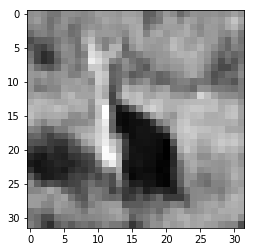

Bild Nr. 123
Richtiges Label [3]
Knn Label Ergebnis: [8]


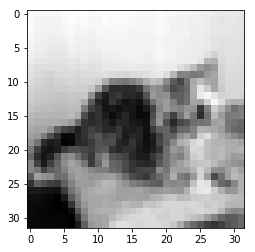

Bild Nr. 124
Richtiges Label [7]
Knn Label Ergebnis: [5]


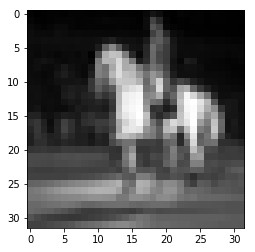

Bild Nr. 125
Richtiges Label [1]
Knn Label Ergebnis: [3]


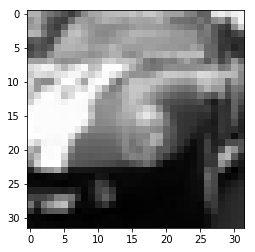

Bild Nr. 126
Richtiges Label [0]
Knn Label Ergebnis: [4]


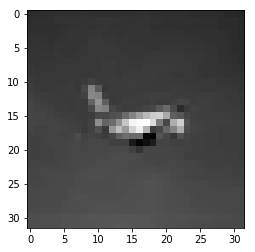

Bild Nr. 127
Richtiges Label [4]
Knn Label Ergebnis: [2]


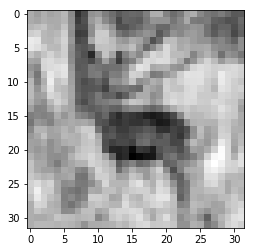

Bild Nr. 128
Richtiges Label [5]
Knn Label Ergebnis: [3]


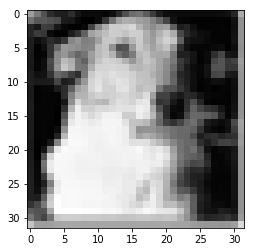

Bild Nr. 129
Richtiges Label [3]
Knn Label Ergebnis: [4]


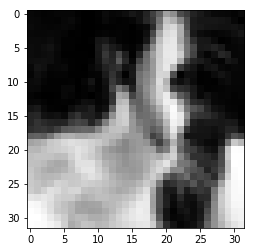

Bild Nr. 130
Richtiges Label [9]
Knn Label Ergebnis: [8]


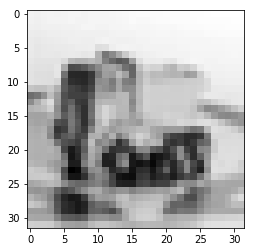

Bild Nr. 131
Richtiges Label [6]
Knn Label Ergebnis: [4]


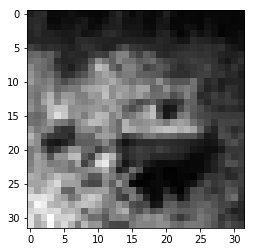

Bild Nr. 132
Richtiges Label [2]
Knn Label Ergebnis: [0]


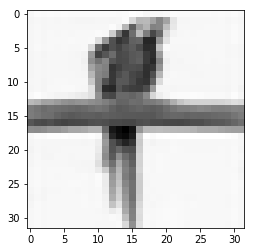

Bild Nr. 133
Richtiges Label [3]
Knn Label Ergebnis: [8]


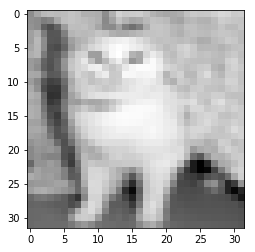

Bild Nr. 134
Richtiges Label [5]
Knn Label Ergebnis: [4]


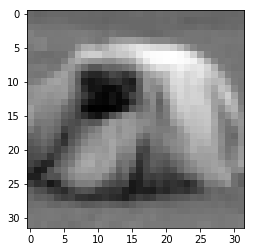

Bild Nr. 135
Richtiges Label [8]
Knn Label Ergebnis: [0]


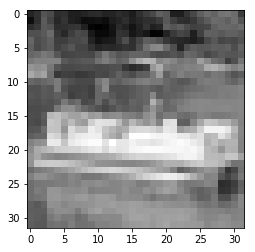

Bild Nr. 136
Richtiges Label [6]
Knn Label Ergebnis: [2]


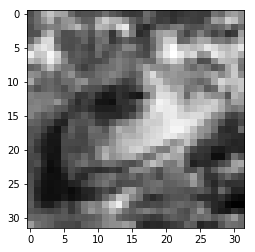

Bild Nr. 137
Richtiges Label [8]
Knn Label Ergebnis: [0]


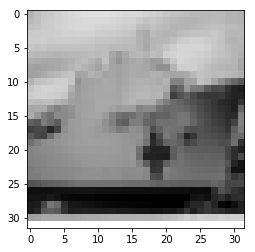

Bild Nr. 138
Richtiges Label [1]
Knn Label Ergebnis: [8]


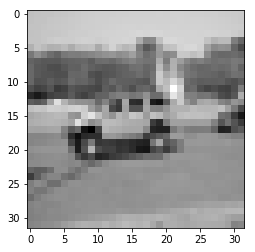

Bild Nr. 139
Richtiges Label [3]
Knn Label Ergebnis: [0]


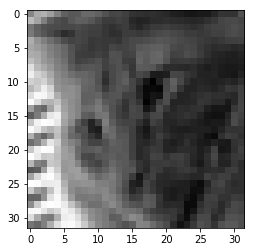

Bild Nr. 140
Richtiges Label [9]
Knn Label Ergebnis: [8]


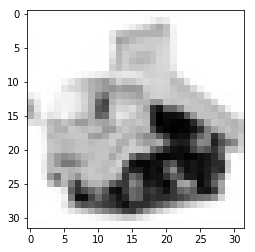

Bild Nr. 141
Richtiges Label [2]
Knn Label Ergebnis: [6]


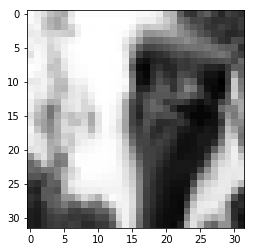

Bild Nr. 142
Richtiges Label [3]
Knn Label Ergebnis: [0]


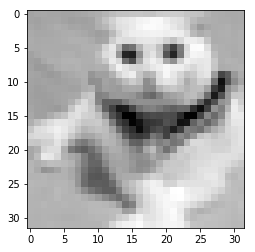

Bild Nr. 143
Richtiges Label [3]
Knn Label Ergebnis: [0]


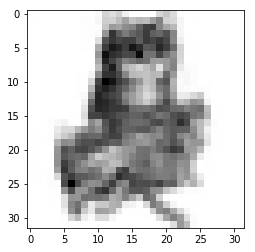

Bild Nr. 144
Richtiges Label [8]
Knn Label Ergebnis: [0]


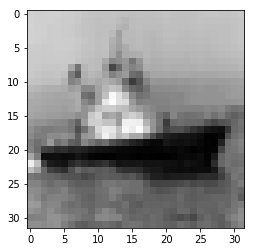

Bild Nr. 145
Richtiges Label [3]
Knn Label Ergebnis: [0]


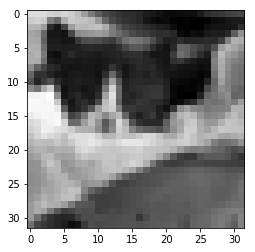

Bild Nr. 146
Richtiges Label [0]
Knn Label Ergebnis: [9]


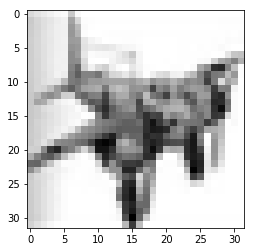

Bild Nr. 147
Richtiges Label [2]
Knn Label Ergebnis: [4]


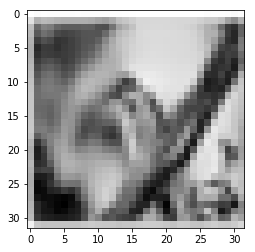

Bild Nr. 148
Richtiges Label [1]
Knn Label Ergebnis: [0]


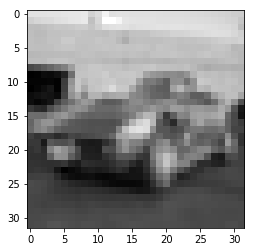

Bild Nr. 149
Richtiges Label [3]
Knn Label Ergebnis: [0]


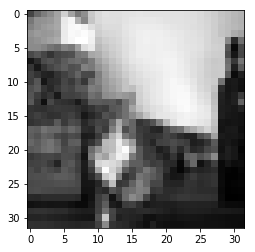

Bild Nr. 150
Richtiges Label [3]
Knn Label Ergebnis: [8]


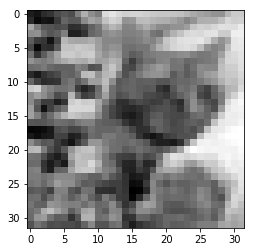

Bild Nr. 151
Richtiges Label [9]
Knn Label Ergebnis: [4]


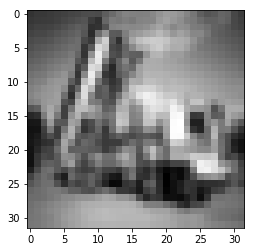

Bild Nr. 152
Richtiges Label [2]
Knn Label Ergebnis: [4]


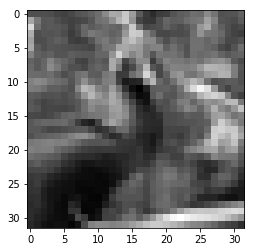

Bild Nr. 153
Richtiges Label [3]
Knn Label Ergebnis: [9]


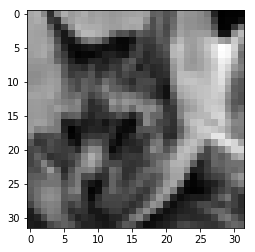

Bild Nr. 154
Richtiges Label [7]
Knn Label Ergebnis: [5]


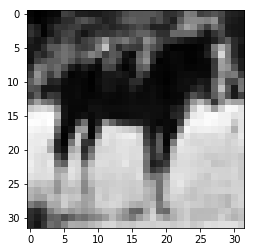

Bild Nr. 155
Richtiges Label [4]
Knn Label Ergebnis: [2]


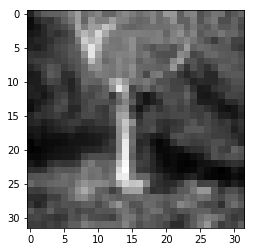

Bild Nr. 156
Richtiges Label [7]
Knn Label Ergebnis: [1]


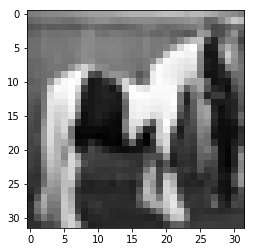

Bild Nr. 157
Richtiges Label [7]
Knn Label Ergebnis: [0]


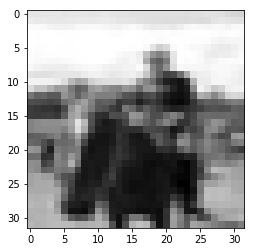

Bild Nr. 158
Richtiges Label [6]
Knn Label Ergebnis: [0]


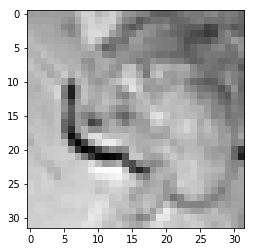

Bild Nr. 159
Richtiges Label [3]
Knn Label Ergebnis: [2]


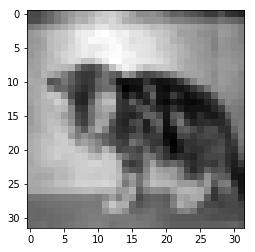

Bild Nr. 160
Richtiges Label [8]
Knn Label Ergebnis: [2]


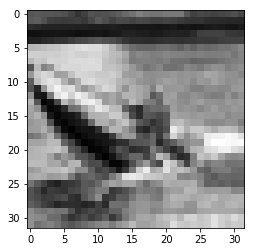

Bild Nr. 161
Richtiges Label [3]
Knn Label Ergebnis: [5]


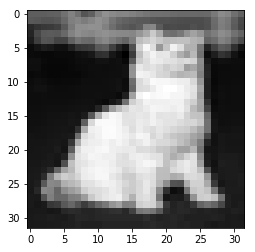

Bild Nr. 162
Richtiges Label [2]
Knn Label Ergebnis: [0]


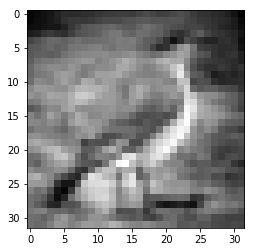

Bild Nr. 163
Richtiges Label [0]
Knn Label Ergebnis: [8]


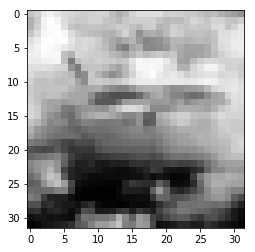

Bild Nr. 164
Richtiges Label [8]
Knn Label Ergebnis: [3]


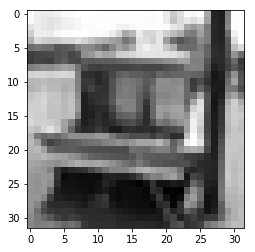

Bild Nr. 165
Richtiges Label [9]
Knn Label Ergebnis: [3]


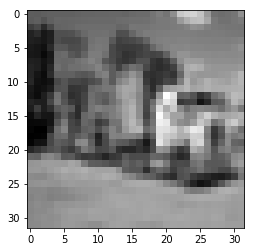

Bild Nr. 166
Richtiges Label [3]
Knn Label Ergebnis: [6]


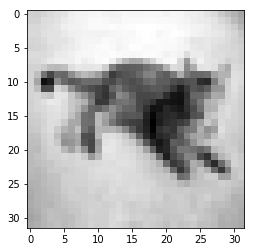

Bild Nr. 167
Richtiges Label [3]
Knn Label Ergebnis: [4]


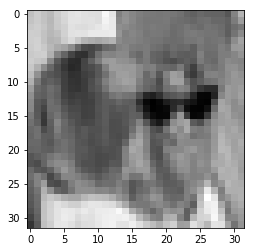

Bild Nr. 168
Richtiges Label [9]
Knn Label Ergebnis: [8]


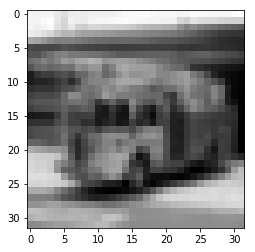

Bild Nr. 169
Richtiges Label [8]
Knn Label Ergebnis: [4]


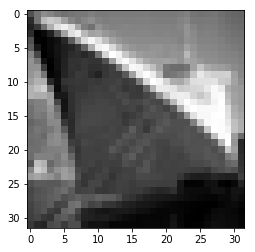

Bild Nr. 170
Richtiges Label [0]
Knn Label Ergebnis: [8]


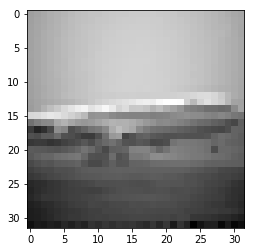

Bild Nr. 171
Richtiges Label [7]
Knn Label Ergebnis: [0]


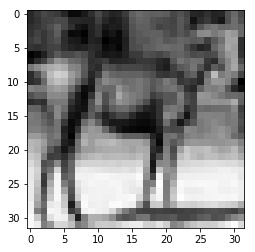

Bild Nr. 172
Richtiges Label [7]
Knn Label Ergebnis: [4]


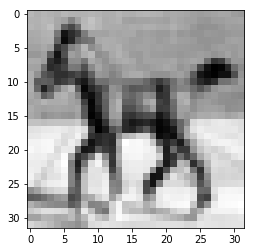

Bild Nr. 173
Richtiges Label [3]
Knn Label Ergebnis: [6]


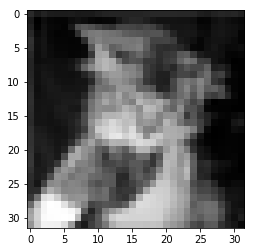

Bild Nr. 174
Richtiges Label [5]
Knn Label Ergebnis: [3]


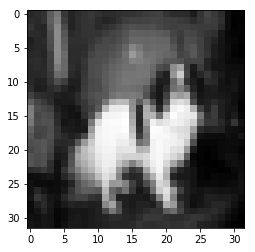

Bild Nr. 175
Richtiges Label [1]
Knn Label Ergebnis: [0]


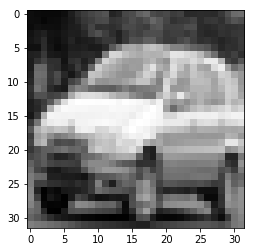

Bild Nr. 176
Richtiges Label [4]
Knn Label Ergebnis: [0]


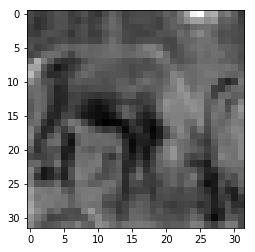

Bild Nr. 177
Richtiges Label [6]
Knn Label Ergebnis: [3]


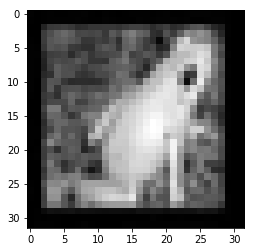

Bild Nr. 178
Richtiges Label [7]
Knn Label Ergebnis: [2]


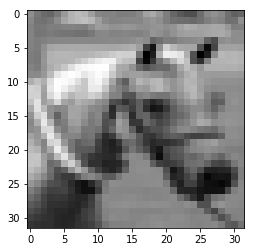

Bild Nr. 179
Richtiges Label [3]
Knn Label Ergebnis: [4]


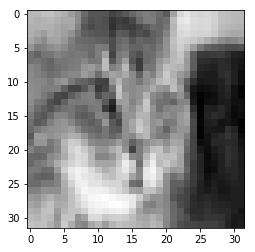

Bild Nr. 180
Richtiges Label [4]
Knn Label Ergebnis: [5]


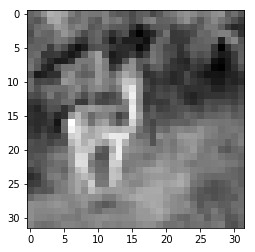

Bild Nr. 181
Richtiges Label [5]
Knn Label Ergebnis: [4]


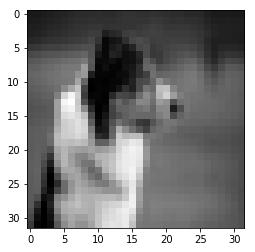

Bild Nr. 182
Richtiges Label [3]
Knn Label Ergebnis: [0]


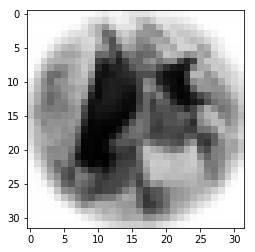

Bild Nr. 183
Richtiges Label [3]
Knn Label Ergebnis: [6]


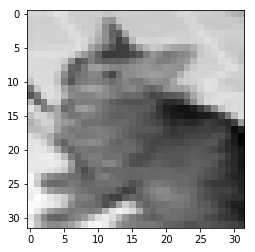

Bild Nr. 184
Richtiges Label [9]
Knn Label Ergebnis: [8]


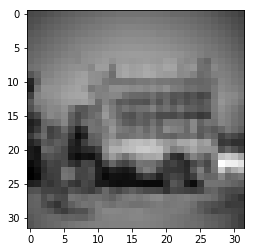

Bild Nr. 185
Richtiges Label [9]
Knn Label Ergebnis: [8]


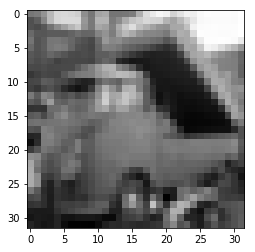

Bild Nr. 186
Richtiges Label [6]
Knn Label Ergebnis: [0]


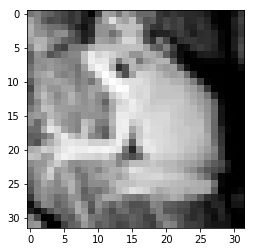

Bild Nr. 187
Richtiges Label [8]
Knn Label Ergebnis: [0]


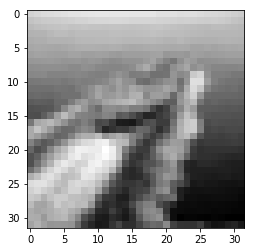

Bild Nr. 188
Richtiges Label [2]
Knn Label Ergebnis: [4]


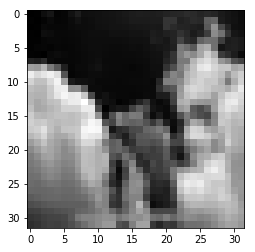

Bild Nr. 189
Richtiges Label [0]
Knn Label Ergebnis: [8]


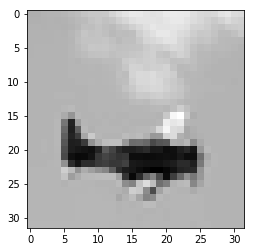

Bild Nr. 190
Richtiges Label [8]
Knn Label Ergebnis: [0]


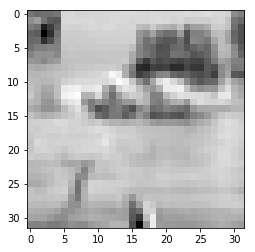

Bild Nr. 191
Richtiges Label [0]
Knn Label Ergebnis: [4]


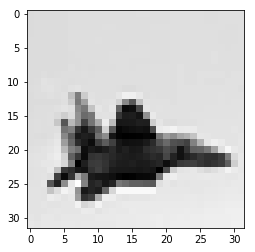

Bild Nr. 192
Richtiges Label [1]
Knn Label Ergebnis: [2]


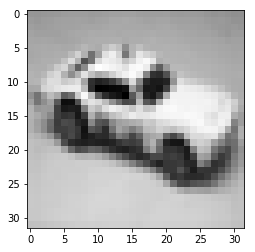

Bild Nr. 193
Richtiges Label [4]
Knn Label Ergebnis: [0]


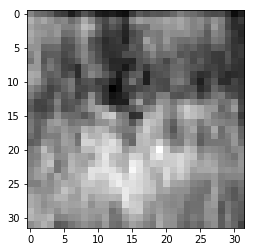

Bild Nr. 194
Richtiges Label [4]
Knn Label Ergebnis: [5]


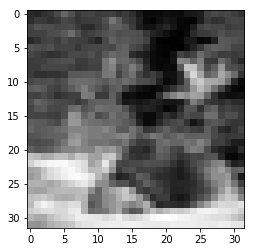

Bild Nr. 195
Richtiges Label [1]
Knn Label Ergebnis: [0]


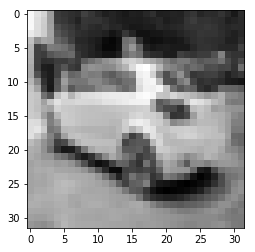

Bild Nr. 196
Richtiges Label [9]
Knn Label Ergebnis: [0]


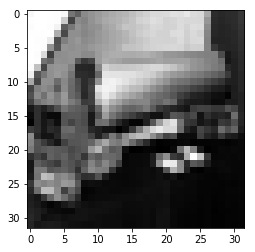

Bild Nr. 197
Richtiges Label [6]
Knn Label Ergebnis: [4]


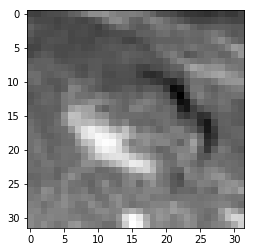

Bild Nr. 198
Richtiges Label [2]
Knn Label Ergebnis: [4]


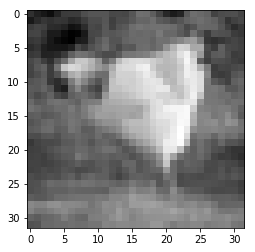

Bild Nr. 199
Richtiges Label [3]
Knn Label Ergebnis: [4]


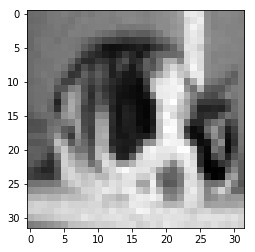

Bild Nr. 200
Richtiges Label [0]
Knn Label Ergebnis: [8]


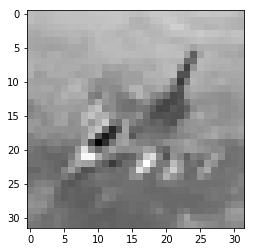

Bild Nr. 201
Richtiges Label [7]
Knn Label Ergebnis: [8]


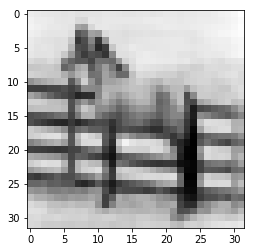

Bild Nr. 202
Richtiges Label [8]
Knn Label Ergebnis: [0]


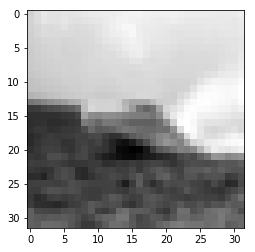

Bild Nr. 203
Richtiges Label [9]
Knn Label Ergebnis: [7]


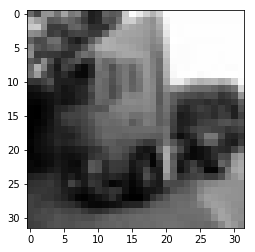

Bild Nr. 204
Richtiges Label [1]
Knn Label Ergebnis: [8]


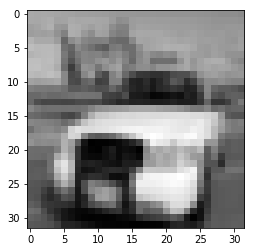

Bild Nr. 205
Richtiges Label [1]
Knn Label Ergebnis: [8]


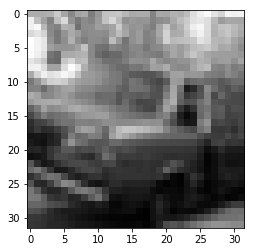

Bild Nr. 206
Richtiges Label [3]
Knn Label Ergebnis: [6]


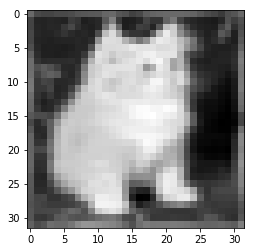

Bild Nr. 207
Richtiges Label [0]
Knn Label Ergebnis: [8]


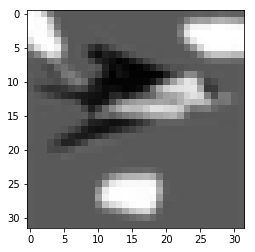

Bild Nr. 208
Richtiges Label [4]
Knn Label Ergebnis: [5]


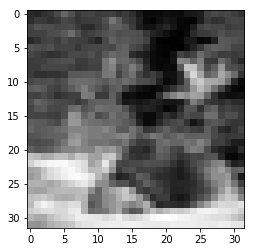

Bild Nr. 209
Richtiges Label [7]
Knn Label Ergebnis: [0]


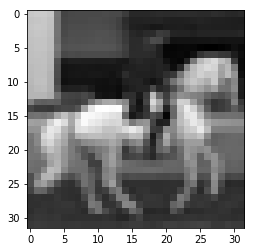

Bild Nr. 210
Richtiges Label [4]
Knn Label Ergebnis: [2]


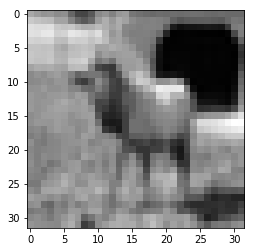

Bild Nr. 211
Richtiges Label [9]
Knn Label Ergebnis: [8]


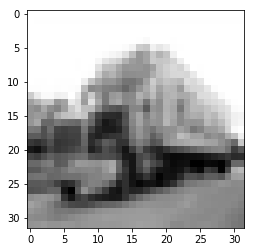

Bild Nr. 212
Richtiges Label [1]
Knn Label Ergebnis: [4]


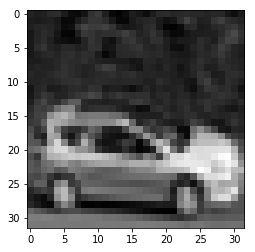

Bild Nr. 213
Richtiges Label [7]
Knn Label Ergebnis: [3]


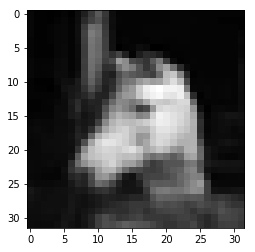

Bild Nr. 214
Richtiges Label [5]
Knn Label Ergebnis: [4]


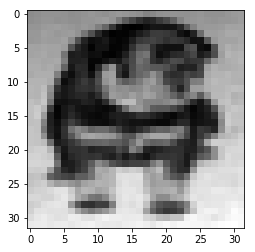

Bild Nr. 215
Richtiges Label [3]
Knn Label Ergebnis: [7]


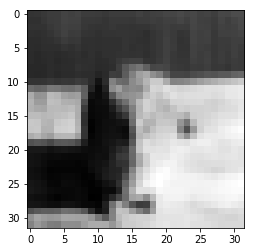

Bild Nr. 216
Richtiges Label [7]
Knn Label Ergebnis: [5]


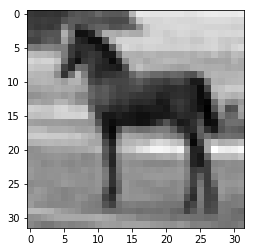

Bild Nr. 217
Richtiges Label [6]
Knn Label Ergebnis: [8]


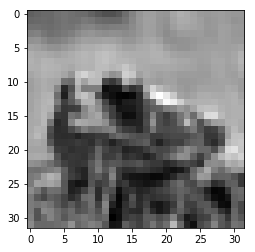

Bild Nr. 218
Richtiges Label [3]
Knn Label Ergebnis: [0]


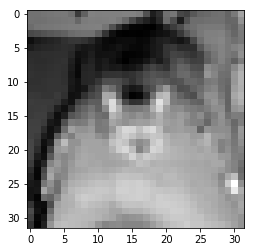

Bild Nr. 219
Richtiges Label [7]
Knn Label Ergebnis: [2]


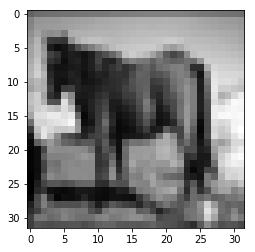

Bild Nr. 220
Richtiges Label [2]
Knn Label Ergebnis: [4]


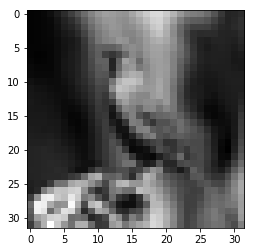

Bild Nr. 221
Richtiges Label [4]
Knn Label Ergebnis: [2]


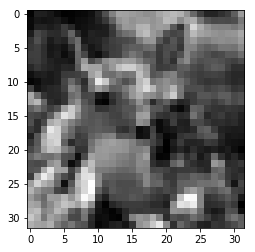

Bild Nr. 222
Richtiges Label [4]
Knn Label Ergebnis: [2]


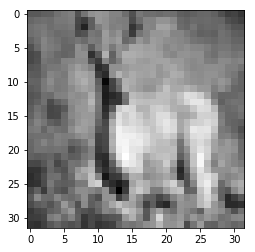

Bild Nr. 223
Richtiges Label [7]
Knn Label Ergebnis: [8]


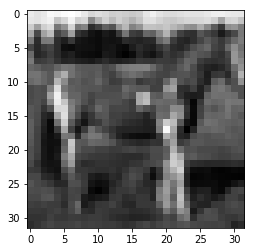

Bild Nr. 224
Richtiges Label [8]
Knn Label Ergebnis: [0]


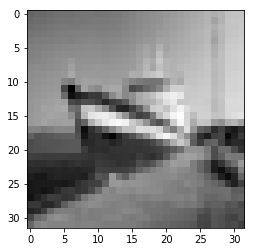

Bild Nr. 225
Richtiges Label [9]
Knn Label Ergebnis: [0]


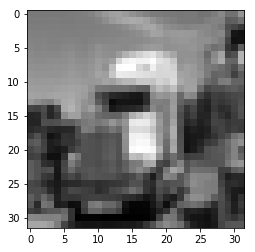

Bild Nr. 226
Richtiges Label [0]
Knn Label Ergebnis: [8]


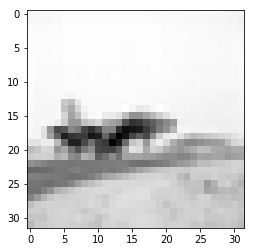

Bild Nr. 227
Richtiges Label [3]
Knn Label Ergebnis: [2]


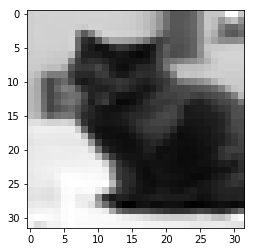

Bild Nr. 228
Richtiges Label [1]
Knn Label Ergebnis: [0]


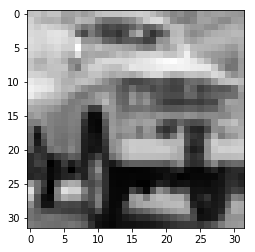

Bild Nr. 229
Richtiges Label [9]
Knn Label Ergebnis: [8]


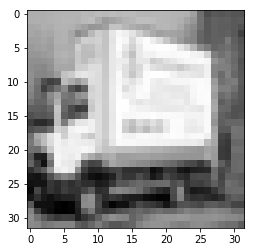

Bild Nr. 230
Richtiges Label [9]
Knn Label Ergebnis: [8]


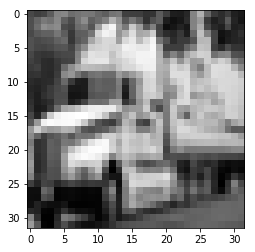

Bild Nr. 231
Richtiges Label [2]
Knn Label Ergebnis: [0]


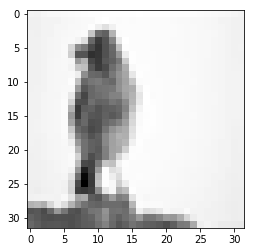

Bild Nr. 232
Richtiges Label [8]
Knn Label Ergebnis: [4]


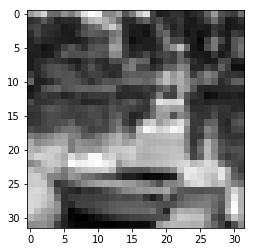

Bild Nr. 233
Richtiges Label [8]
Knn Label Ergebnis: [4]


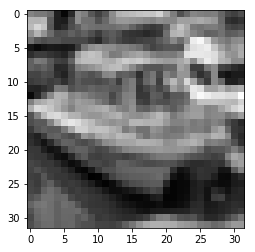

Bild Nr. 234
Richtiges Label [3]
Knn Label Ergebnis: [9]


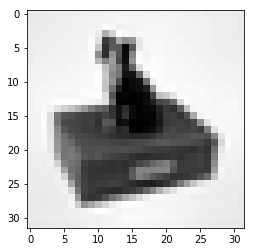

Bild Nr. 235
Richtiges Label [1]
Knn Label Ergebnis: [8]


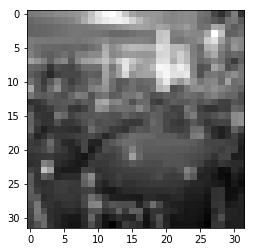

Bild Nr. 236
Richtiges Label [5]
Knn Label Ergebnis: [0]


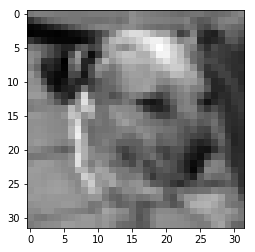

Bild Nr. 237
Richtiges Label [1]
Knn Label Ergebnis: [4]


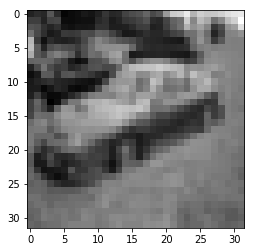

Bild Nr. 238
Richtiges Label [6]
Knn Label Ergebnis: [0]


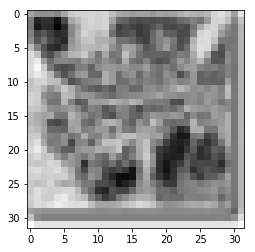

Bild Nr. 239
Richtiges Label [7]
Knn Label Ergebnis: [0]


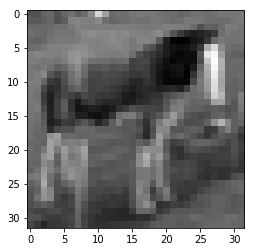

Bild Nr. 240
Richtiges Label [6]
Knn Label Ergebnis: [3]


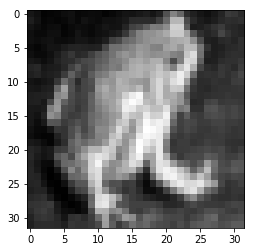

Bild Nr. 241
Richtiges Label [6]
Knn Label Ergebnis: [7]


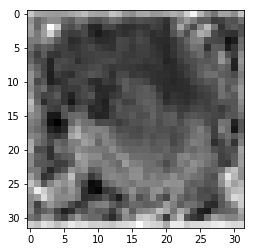

Bild Nr. 242
Richtiges Label [4]
Knn Label Ergebnis: [3]


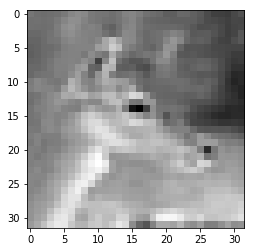

Bild Nr. 243
Richtiges Label [1]
Knn Label Ergebnis: [8]


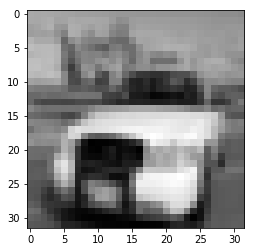

Bild Nr. 244
Richtiges Label [9]
Knn Label Ergebnis: [3]


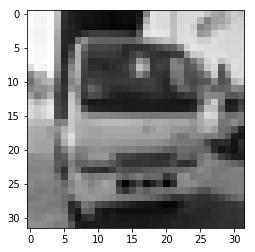

Bild Nr. 245
Richtiges Label [6]
Knn Label Ergebnis: [5]


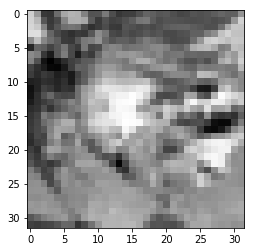

Bild Nr. 246
Richtiges Label [6]
Knn Label Ergebnis: [0]


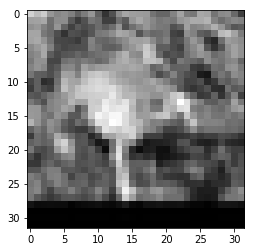

Bild Nr. 247
Richtiges Label [3]
Knn Label Ergebnis: [4]


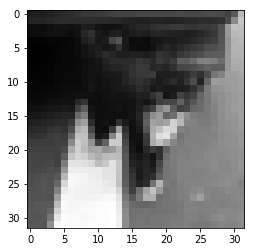

Bild Nr. 248
Richtiges Label [6]
Knn Label Ergebnis: [2]


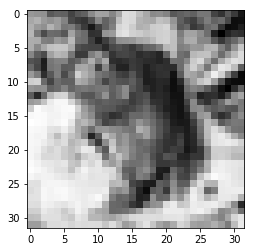

Bild Nr. 249
Richtiges Label [9]
Knn Label Ergebnis: [4]


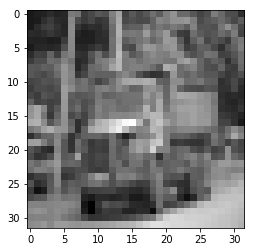

Bild Nr. 250
Richtiges Label [0]
Knn Label Ergebnis: [4]


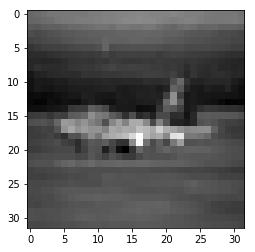

Bild Nr. 251
Richtiges Label [6]
Knn Label Ergebnis: [0]


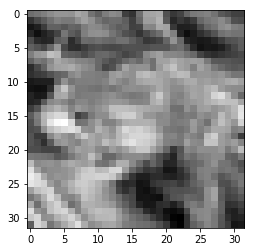

Bild Nr. 252
Richtiges Label [6]
Knn Label Ergebnis: [8]


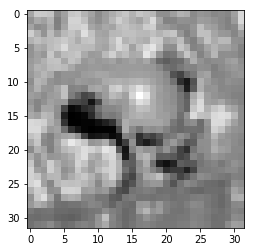

Bild Nr. 253
Richtiges Label [3]
Knn Label Ergebnis: [2]


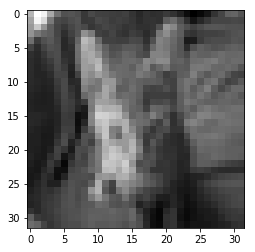

Bild Nr. 254
Richtiges Label [3]
Knn Label Ergebnis: [6]


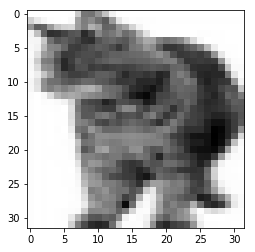

Bild Nr. 255
Richtiges Label [8]
Knn Label Ergebnis: [4]


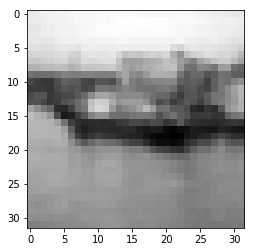

Bild Nr. 256
Richtiges Label [5]
Knn Label Ergebnis: [3]


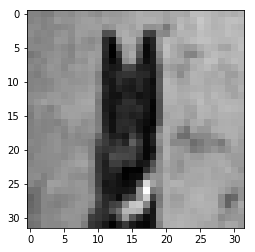

Bild Nr. 257
Richtiges Label [6]
Knn Label Ergebnis: [4]


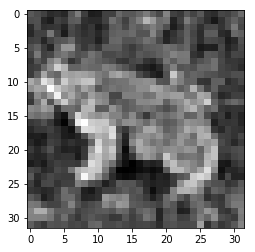

Bild Nr. 258
Richtiges Label [6]
Knn Label Ergebnis: [4]


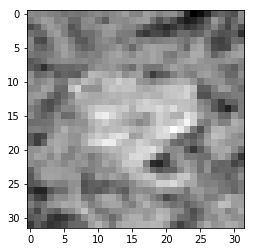

Bild Nr. 259
Richtiges Label [1]
Knn Label Ergebnis: [4]


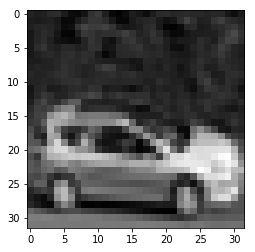

Bild Nr. 260
Richtiges Label [1]
Knn Label Ergebnis: [4]


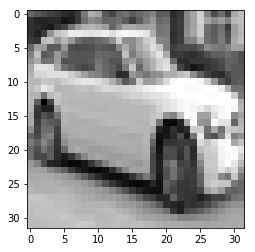

Bild Nr. 261
Richtiges Label [4]
Knn Label Ergebnis: [2]


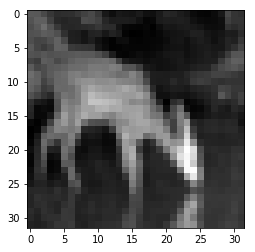

Bild Nr. 262
Richtiges Label [1]
Knn Label Ergebnis: [8]


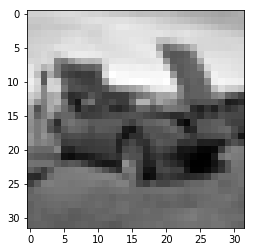

Bild Nr. 263
Richtiges Label [5]
Knn Label Ergebnis: [0]


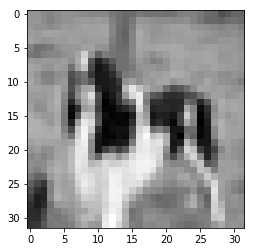

Bild Nr. 264
Richtiges Label [7]
Knn Label Ergebnis: [0]


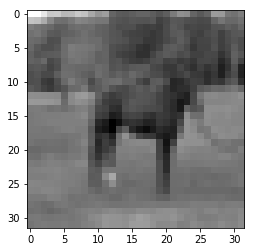

Bild Nr. 265
Richtiges Label [6]
Knn Label Ergebnis: [4]


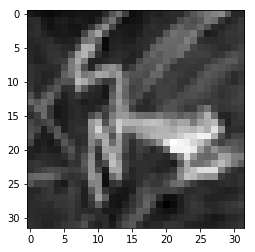

Bild Nr. 266
Richtiges Label [5]
Knn Label Ergebnis: [2]


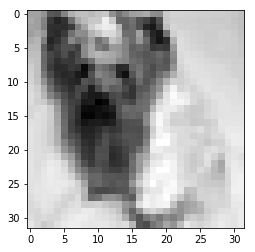

Bild Nr. 267
Richtiges Label [1]
Knn Label Ergebnis: [0]


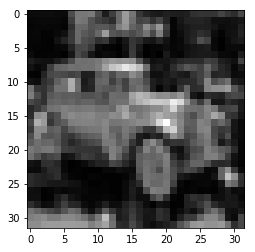

Bild Nr. 268
Richtiges Label [8]
Knn Label Ergebnis: [0]


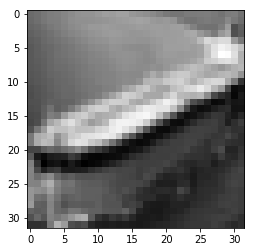

Bild Nr. 269
Richtiges Label [6]
Knn Label Ergebnis: [4]


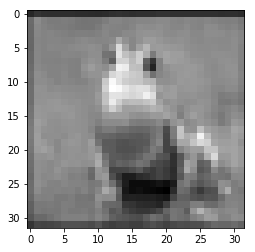

Bild Nr. 270
Richtiges Label [6]
Knn Label Ergebnis: [0]


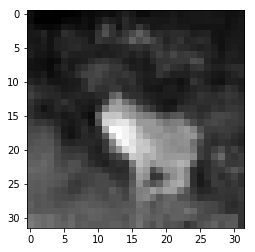

Bild Nr. 271
Richtiges Label [6]
Knn Label Ergebnis: [2]


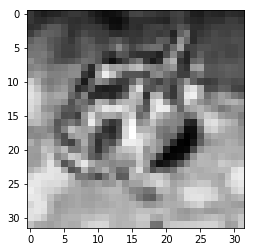

Bild Nr. 272
Richtiges Label [6]
Knn Label Ergebnis: [0]


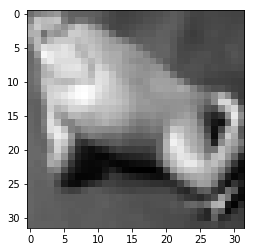

Bild Nr. 273
Richtiges Label [3]
Knn Label Ergebnis: [8]


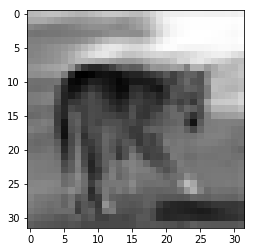

Bild Nr. 274
Richtiges Label [9]
Knn Label Ergebnis: [8]


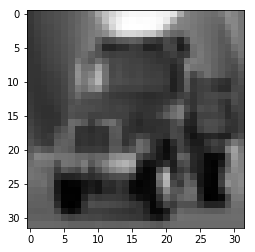

Bild Nr. 275
Richtiges Label [7]
Knn Label Ergebnis: [6]


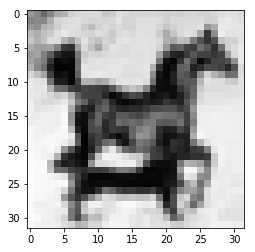

Bild Nr. 276
Richtiges Label [9]
Knn Label Ergebnis: [3]


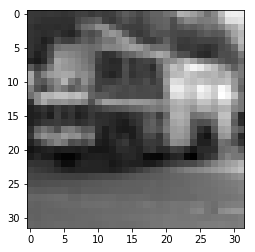

Bild Nr. 277
Richtiges Label [0]
Knn Label Ergebnis: [4]


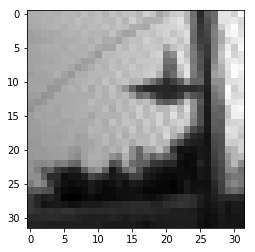

Bild Nr. 278
Richtiges Label [9]
Knn Label Ergebnis: [0]


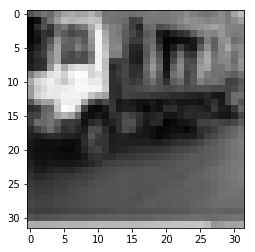

Bild Nr. 279
Richtiges Label [1]
Knn Label Ergebnis: [0]


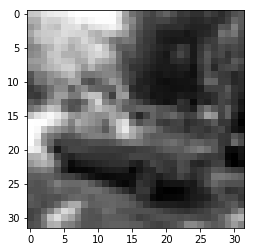

Bild Nr. 280
Richtiges Label [9]
Knn Label Ergebnis: [8]


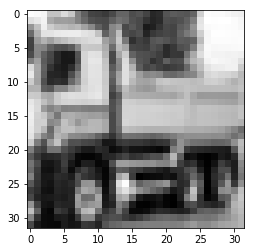

Bild Nr. 281
Richtiges Label [5]
Knn Label Ergebnis: [3]


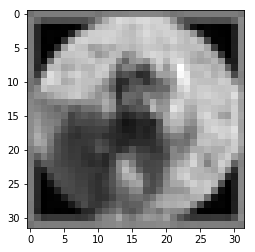

Bild Nr. 282
Richtiges Label [8]
Knn Label Ergebnis: [3]


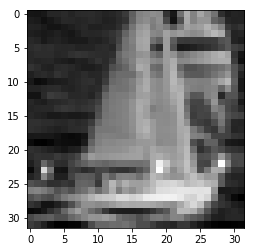

Bild Nr. 283
Richtiges Label [1]
Knn Label Ergebnis: [7]


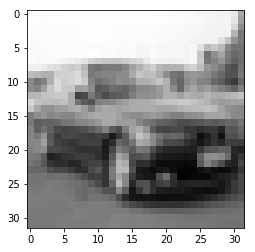

Bild Nr. 284
Richtiges Label [7]
Knn Label Ergebnis: [0]


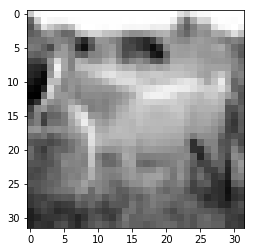

Bild Nr. 285
Richtiges Label [3]
Knn Label Ergebnis: [6]


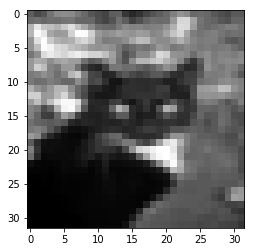

Bild Nr. 286
Richtiges Label [5]
Knn Label Ergebnis: [0]


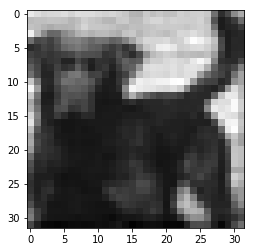

Bild Nr. 287
Richtiges Label [7]
Knn Label Ergebnis: [4]


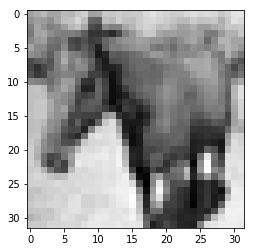

Bild Nr. 288
Richtiges Label [2]
Knn Label Ergebnis: [6]


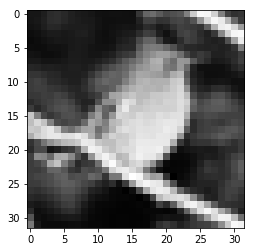

Bild Nr. 289
Richtiges Label [0]
Knn Label Ergebnis: [2]


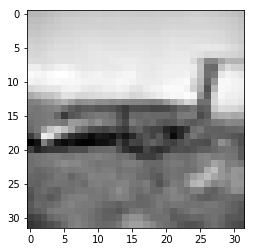

Bild Nr. 290
Richtiges Label [7]
Knn Label Ergebnis: [0]


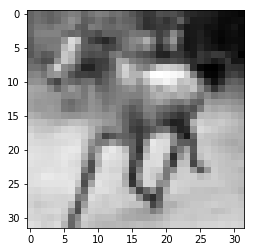

Bild Nr. 291
Richtiges Label [8]
Knn Label Ergebnis: [0]


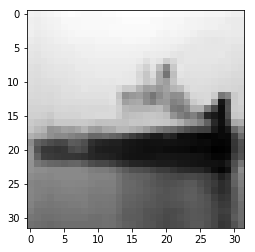

Bild Nr. 292
Richtiges Label [2]
Knn Label Ergebnis: [0]


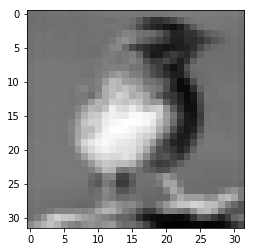

Bild Nr. 293
Richtiges Label [5]
Knn Label Ergebnis: [2]


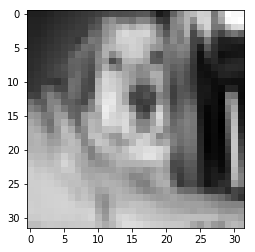

Bild Nr. 294
Richtiges Label [2]
Knn Label Ergebnis: [8]


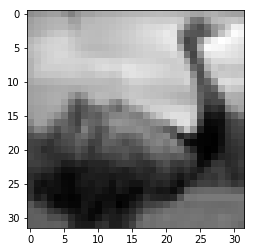

Bild Nr. 295
Richtiges Label [2]
Knn Label Ergebnis: [3]


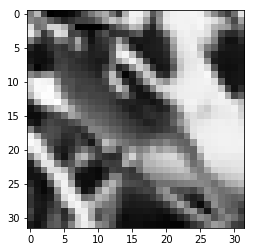

Bild Nr. 296
Richtiges Label [3]
Knn Label Ergebnis: [2]


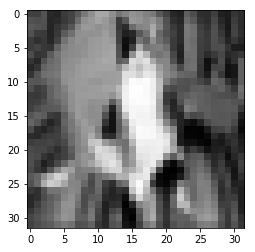

Bild Nr. 297
Richtiges Label [7]
Knn Label Ergebnis: [6]


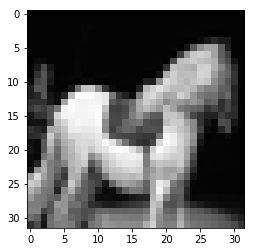

Bild Nr. 298
Richtiges Label [5]
Knn Label Ergebnis: [6]


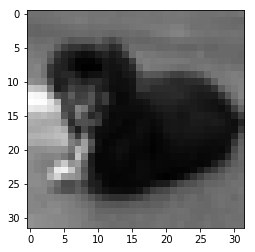

Bild Nr. 299
Richtiges Label [2]
Knn Label Ergebnis: [0]


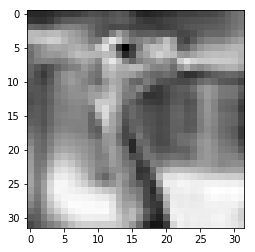

Bild Nr. 300
Richtiges Label [9]
Knn Label Ergebnis: [8]


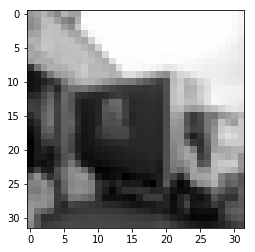

Bild Nr. 301
Richtiges Label [3]
Knn Label Ergebnis: [2]


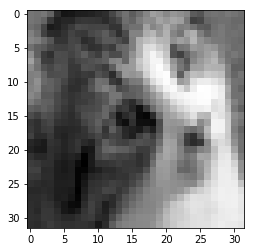

Bild Nr. 302
Richtiges Label [2]
Knn Label Ergebnis: [0]


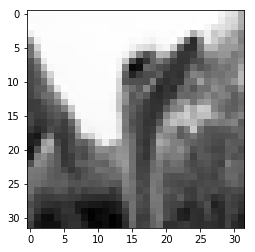

Bild Nr. 303
Richtiges Label [6]
Knn Label Ergebnis: [4]


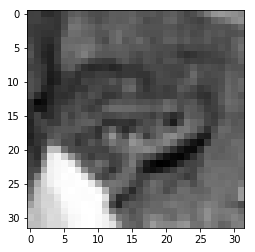

Bild Nr. 304
Richtiges Label [9]
Knn Label Ergebnis: [0]


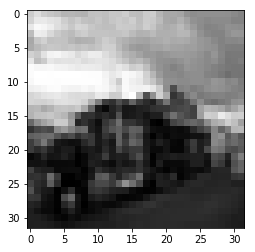

Bild Nr. 305
Richtiges Label [1]
Knn Label Ergebnis: [5]


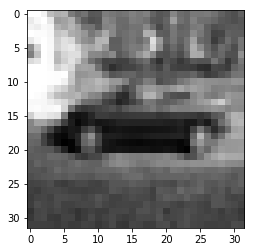

Bild Nr. 306
Richtiges Label [5]
Knn Label Ergebnis: [0]


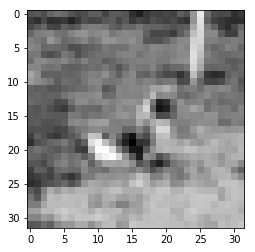

Bild Nr. 307
Richtiges Label [4]
Knn Label Ergebnis: [8]


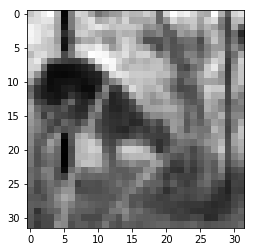

Bild Nr. 308
Richtiges Label [5]
Knn Label Ergebnis: [4]


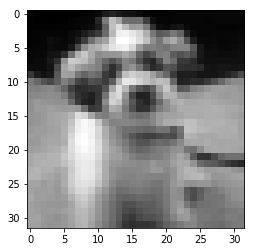

Bild Nr. 309
Richtiges Label [4]
Knn Label Ergebnis: [0]


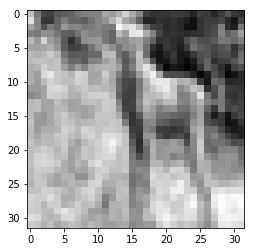

Bild Nr. 310
Richtiges Label [6]
Knn Label Ergebnis: [2]


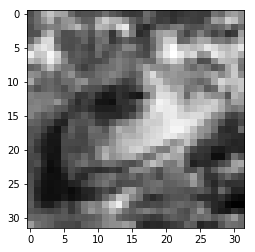

Bild Nr. 311
Richtiges Label [0]
Knn Label Ergebnis: [8]


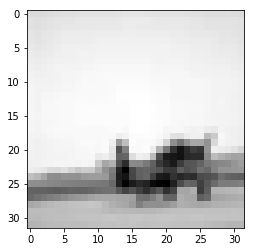

Bild Nr. 312
Richtiges Label [4]
Knn Label Ergebnis: [0]


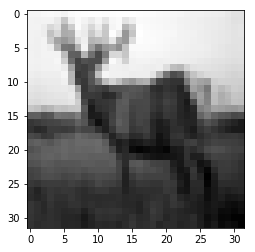

Bild Nr. 313
Richtiges Label [9]
Knn Label Ergebnis: [8]


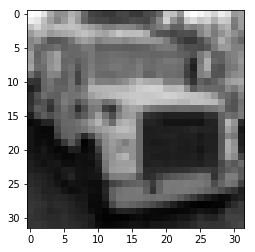

Bild Nr. 314
Richtiges Label [7]
Knn Label Ergebnis: [3]


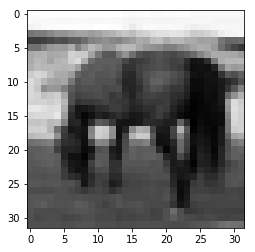

Bild Nr. 315
Richtiges Label [1]
Knn Label Ergebnis: [9]


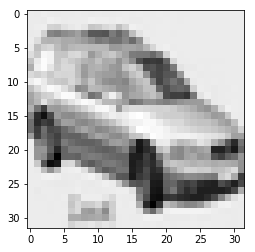

Bild Nr. 316
Richtiges Label [6]
Knn Label Ergebnis: [2]


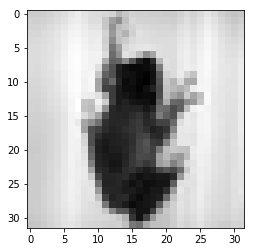

Bild Nr. 317
Richtiges Label [1]
Knn Label Ergebnis: [8]


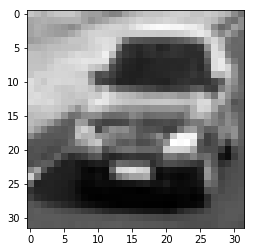

Bild Nr. 318
Richtiges Label [5]
Knn Label Ergebnis: [0]


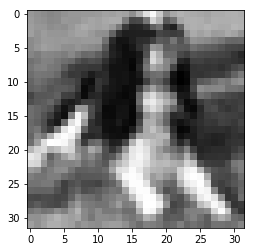

Bild Nr. 319
Richtiges Label [7]
Knn Label Ergebnis: [4]


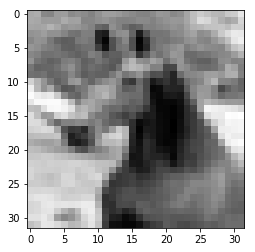

Bild Nr. 320
Richtiges Label [2]
Knn Label Ergebnis: [4]


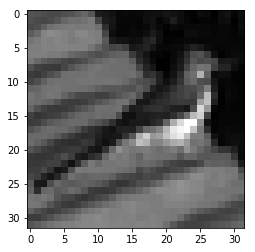

Bild Nr. 321
Richtiges Label [9]
Knn Label Ergebnis: [7]


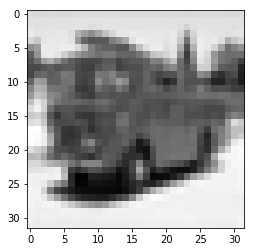

Bild Nr. 322
Richtiges Label [1]
Knn Label Ergebnis: [3]


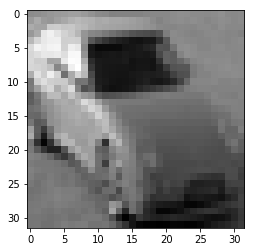

Bild Nr. 323
Richtiges Label [8]
Knn Label Ergebnis: [4]


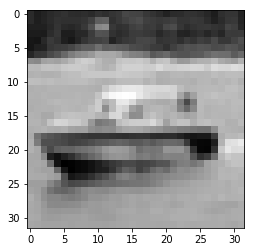

Bild Nr. 324
Richtiges Label [2]
Knn Label Ergebnis: [7]


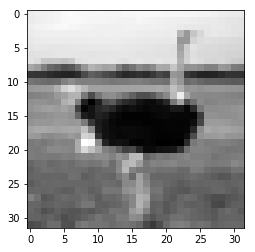

Bild Nr. 325
Richtiges Label [2]
Knn Label Ergebnis: [0]


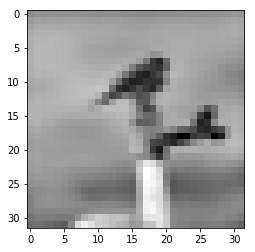

Bild Nr. 326
Richtiges Label [9]
Knn Label Ergebnis: [8]


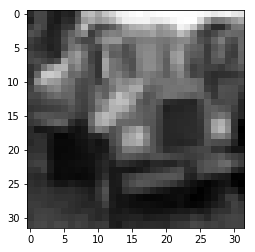

Bild Nr. 327
Richtiges Label [2]
Knn Label Ergebnis: [4]


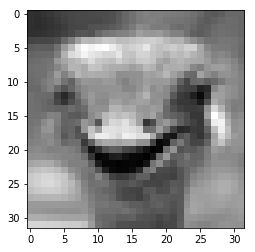

Bild Nr. 328
Richtiges Label [1]
Knn Label Ergebnis: [2]


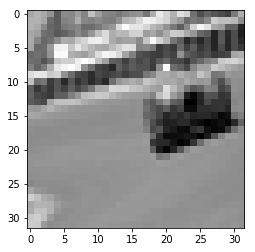

Bild Nr. 329
Richtiges Label [2]
Knn Label Ergebnis: [0]


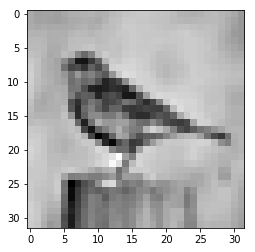

Bild Nr. 330
Richtiges Label [1]
Knn Label Ergebnis: [0]


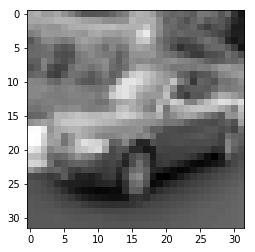

Bild Nr. 331
Richtiges Label [4]
Knn Label Ergebnis: [8]


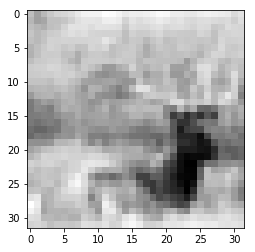

Bild Nr. 332
Richtiges Label [7]
Knn Label Ergebnis: [2]


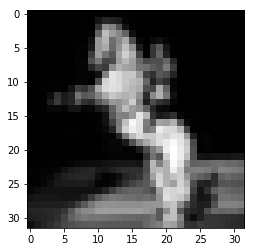

Bild Nr. 333
Richtiges Label [5]
Knn Label Ergebnis: [4]


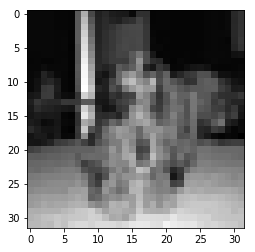

Bild Nr. 334
Richtiges Label [3]
Knn Label Ergebnis: [5]


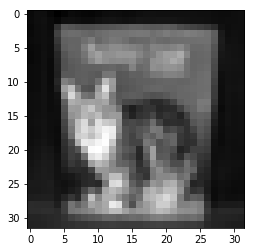

Bild Nr. 335
Richtiges Label [3]
Knn Label Ergebnis: [0]


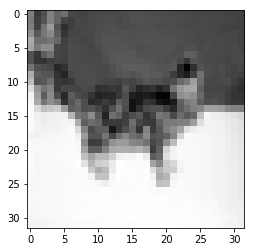

Bild Nr. 336
Richtiges Label [2]
Knn Label Ergebnis: [4]


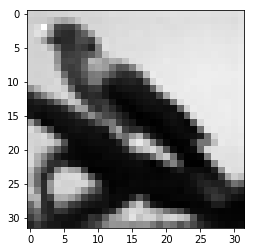

Bild Nr. 337
Richtiges Label [7]
Knn Label Ergebnis: [0]


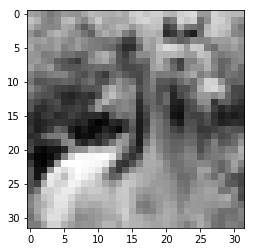

Bild Nr. 338
Richtiges Label [3]
Knn Label Ergebnis: [6]


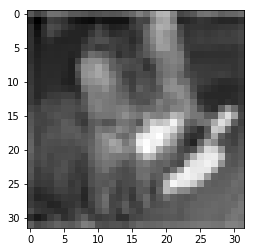

Bild Nr. 339
Richtiges Label [4]
Knn Label Ergebnis: [6]


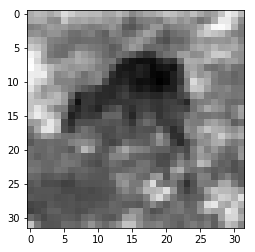

Bild Nr. 340
Richtiges Label [6]
Knn Label Ergebnis: [0]


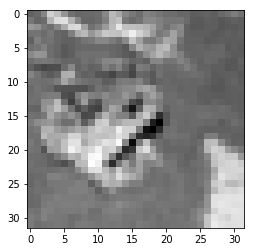

Bild Nr. 341
Richtiges Label [4]
Knn Label Ergebnis: [2]


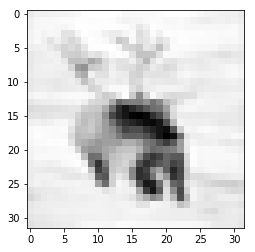

Bild Nr. 342
Richtiges Label [4]
Knn Label Ergebnis: [0]


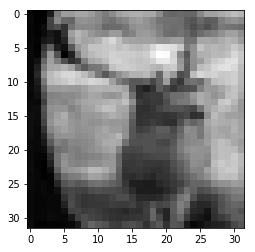

Bild Nr. 343
Richtiges Label [3]
Knn Label Ergebnis: [6]


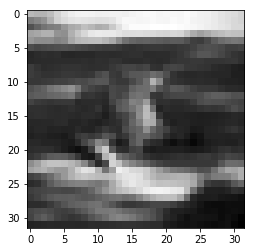

Bild Nr. 344
Richtiges Label [7]
Knn Label Ergebnis: [4]


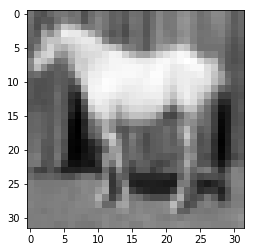

Bild Nr. 345
Richtiges Label [5]
Knn Label Ergebnis: [2]


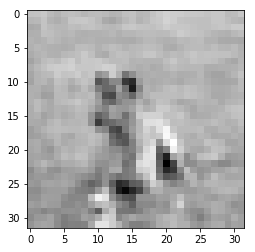

Bild Nr. 346
Richtiges Label [8]
Knn Label Ergebnis: [3]


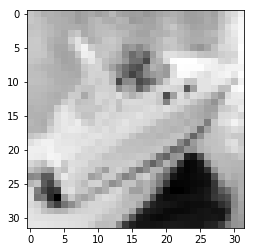

Bild Nr. 347
Richtiges Label [5]
Knn Label Ergebnis: [0]


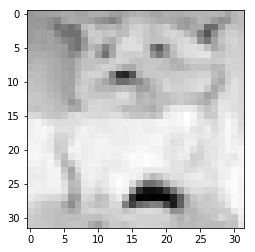

Bild Nr. 348
Richtiges Label [5]
Knn Label Ergebnis: [4]


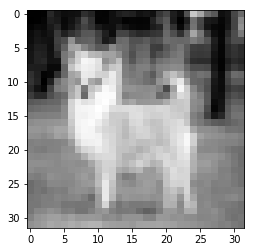

Bild Nr. 349
Richtiges Label [0]
Knn Label Ergebnis: [2]


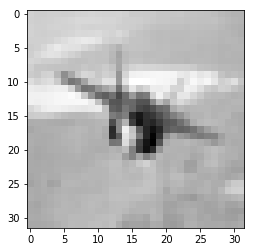

Bild Nr. 350
Richtiges Label [1]
Knn Label Ergebnis: [6]


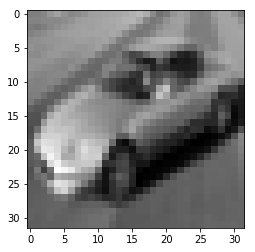

Bild Nr. 351
Richtiges Label [5]
Knn Label Ergebnis: [8]


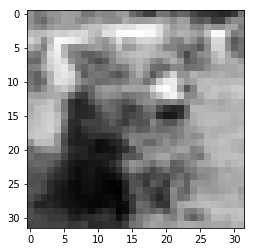

Bild Nr. 352
Richtiges Label [7]
Knn Label Ergebnis: [0]


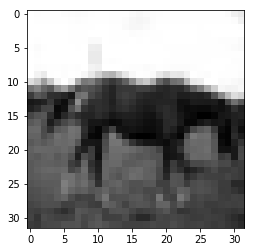

Bild Nr. 353
Richtiges Label [7]
Knn Label Ergebnis: [2]


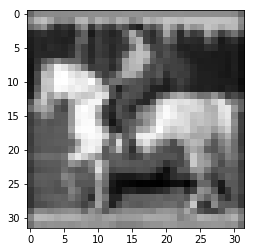

Bild Nr. 354
Richtiges Label [9]
Knn Label Ergebnis: [8]


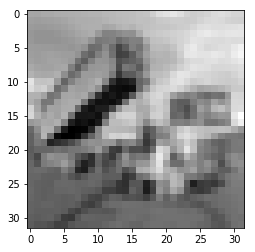

Bild Nr. 355
Richtiges Label [6]
Knn Label Ergebnis: [4]


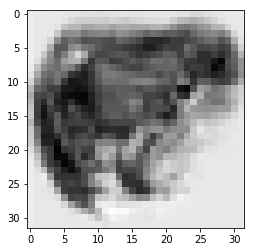

Bild Nr. 356
Richtiges Label [7]
Knn Label Ergebnis: [2]


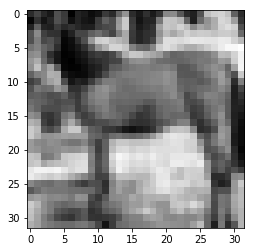

Bild Nr. 357
Richtiges Label [6]
Knn Label Ergebnis: [5]


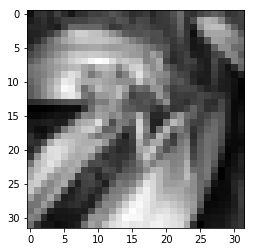

Bild Nr. 358
Richtiges Label [1]
Knn Label Ergebnis: [8]


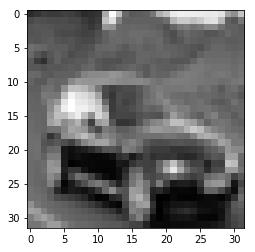

Bild Nr. 359
Richtiges Label [4]
Knn Label Ergebnis: [8]


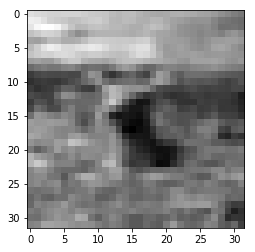

Bild Nr. 360
Richtiges Label [5]
Knn Label Ergebnis: [2]


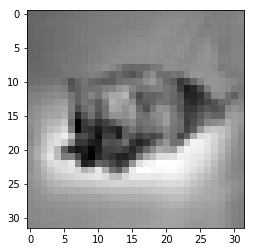

Bild Nr. 361
Richtiges Label [0]
Knn Label Ergebnis: [6]


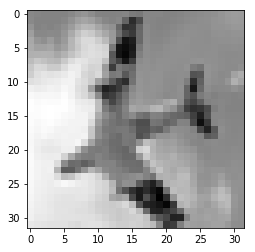

Bild Nr. 362
Richtiges Label [1]
Knn Label Ergebnis: [9]


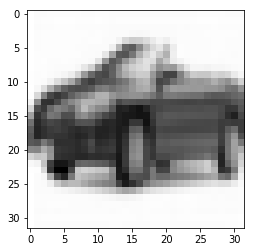

Bild Nr. 363
Richtiges Label [7]
Knn Label Ergebnis: [4]


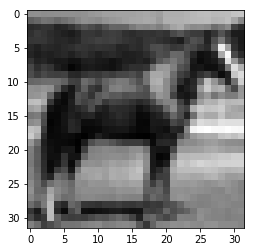

Bild Nr. 364
Richtiges Label [6]
Knn Label Ergebnis: [4]


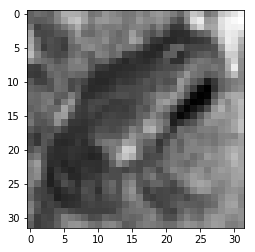

Bild Nr. 365
Richtiges Label [2]
Knn Label Ergebnis: [0]


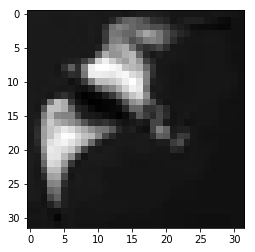

Bild Nr. 366
Richtiges Label [7]
Knn Label Ergebnis: [6]


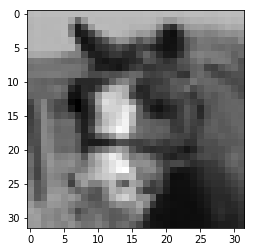

Bild Nr. 367
Richtiges Label [0]
Knn Label Ergebnis: [5]


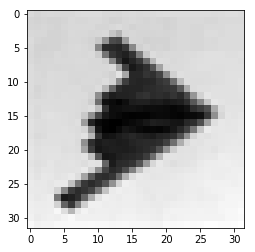

Bild Nr. 368
Richtiges Label [6]
Knn Label Ergebnis: [9]


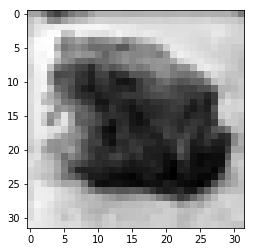

Bild Nr. 369
Richtiges Label [7]
Knn Label Ergebnis: [8]


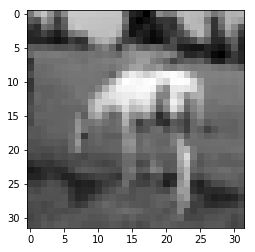

Bild Nr. 370
Richtiges Label [4]
Knn Label Ergebnis: [0]


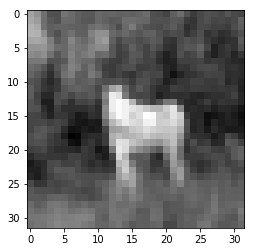

Bild Nr. 371
Richtiges Label [9]
Knn Label Ergebnis: [1]


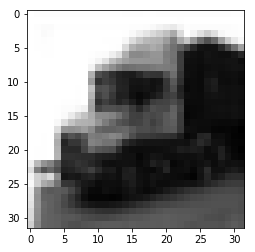

Bild Nr. 372
Richtiges Label [6]
Knn Label Ergebnis: [2]


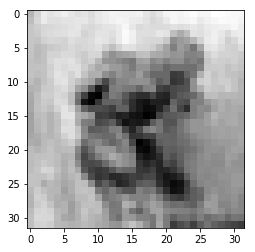

Bild Nr. 373
Richtiges Label [5]
Knn Label Ergebnis: [3]


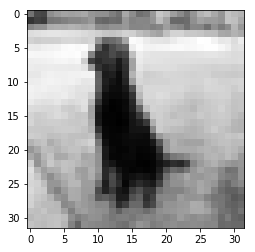

Bild Nr. 374
Richtiges Label [5]
Knn Label Ergebnis: [2]


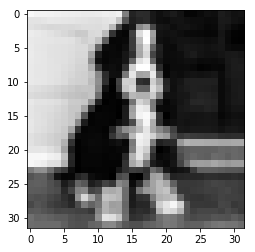

Bild Nr. 375
Richtiges Label [6]
Knn Label Ergebnis: [2]


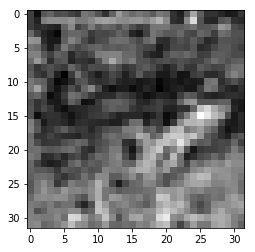

Bild Nr. 376
Richtiges Label [5]
Knn Label Ergebnis: [6]


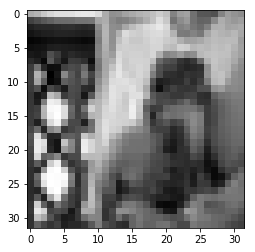

Bild Nr. 377
Richtiges Label [2]
Knn Label Ergebnis: [4]


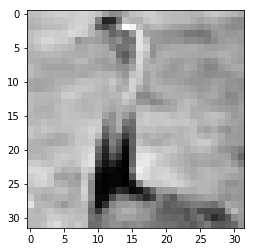

Bild Nr. 378
Richtiges Label [7]
Knn Label Ergebnis: [0]


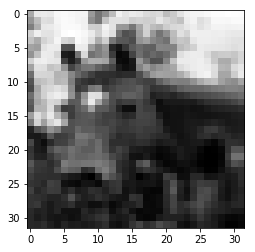

Bild Nr. 379
Richtiges Label [5]
Knn Label Ergebnis: [4]


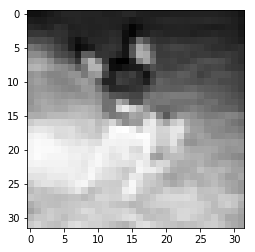

Bild Nr. 380
Richtiges Label [3]
Knn Label Ergebnis: [0]


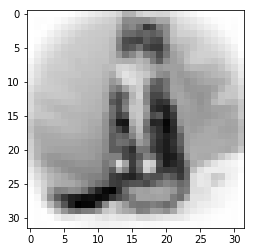

Bild Nr. 381
Richtiges Label [2]
Knn Label Ergebnis: [4]


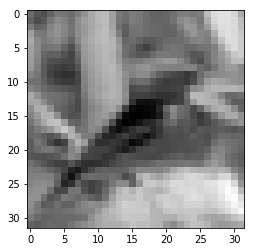

Bild Nr. 382
Richtiges Label [3]
Knn Label Ergebnis: [2]


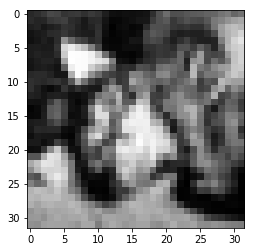

Bild Nr. 383
Richtiges Label [5]
Knn Label Ergebnis: [2]


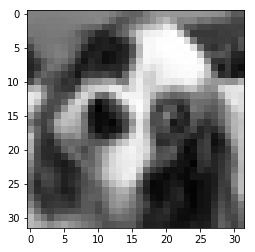

Bild Nr. 384
Richtiges Label [6]
Knn Label Ergebnis: [5]


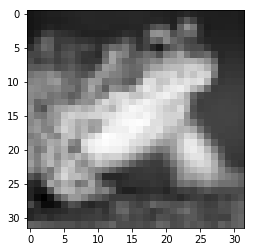

Bild Nr. 385
Richtiges Label [3]
Knn Label Ergebnis: [0]


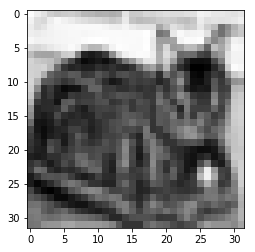

Bild Nr. 386
Richtiges Label [2]
Knn Label Ergebnis: [3]


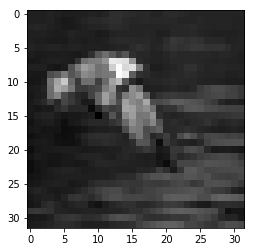

Bild Nr. 387
Richtiges Label [1]
Knn Label Ergebnis: [2]


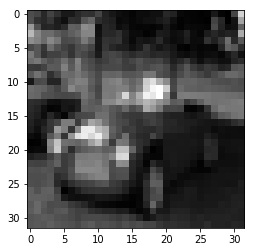

Bild Nr. 388
Richtiges Label [1]
Knn Label Ergebnis: [6]


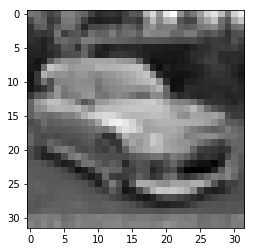

Bild Nr. 389
Richtiges Label [7]
Knn Label Ergebnis: [0]


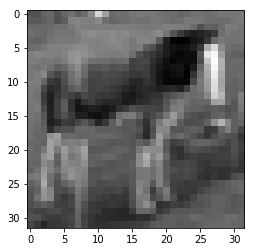

Bild Nr. 390
Richtiges Label [4]
Knn Label Ergebnis: [0]


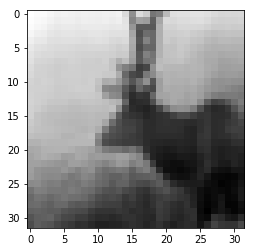

Bild Nr. 391
Richtiges Label [4]
Knn Label Ergebnis: [2]


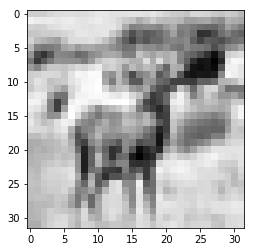

Bild Nr. 392
Richtiges Label [5]
Knn Label Ergebnis: [4]


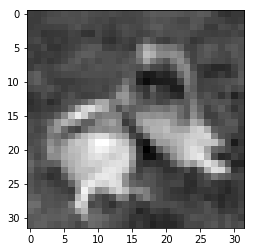

Bild Nr. 393
Richtiges Label [7]
Knn Label Ergebnis: [8]


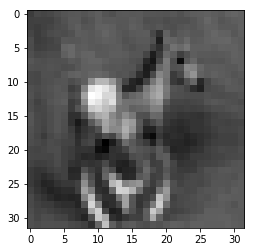

Bild Nr. 394
Richtiges Label [3]
Knn Label Ergebnis: [6]


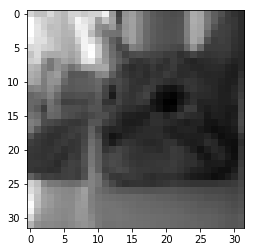

Bild Nr. 395
Richtiges Label [8]
Knn Label Ergebnis: [0]


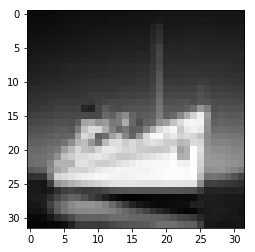

Bild Nr. 396
Richtiges Label [2]
Knn Label Ergebnis: [0]


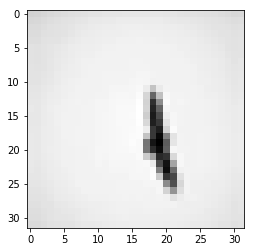

Bild Nr. 397
Richtiges Label [3]
Knn Label Ergebnis: [5]


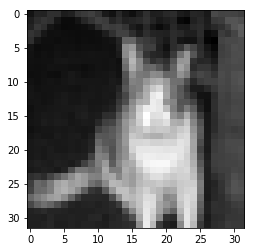

Confusion matrix, without normalization
[[13  0  4  0  5  1  2  1 12  1]
 [ 7  5  6  3  5  2  4  2 13  2]
 [12  0 18  3 14  0  2  1  1  0]
 [14  0 10  9  8  3 11  1  4  2]
 [ 9  0 14  1 13  3  2  0  5  1]
 [11  0  9  6 11 10  2  1  3  0]
 [11  0  9  3 12  5  6  1  4  1]
 [14  2  9  3  8  3  4  6  6  0]
 [14  0  2  3  7  0  0  0 20  0]
 [ 5  2  2  5  7  0  0  2 19  3]]


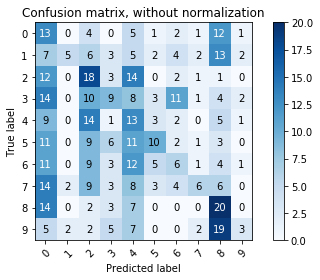

In [0]:
knn_result = knn(4)
calc_error(knn_result)

KNN für k= 8
Errorrate:  77.2 %
Errorrate für 0  =  66.67 %
Errorrate für 1  =  85.71 %
Errorrate für 2  =  60.78 %
Errorrate für 3  =  79.03 %
Errorrate für 4  =  75.0 %
Errorrate für 5  =  81.13 %
Errorrate für 6  =  90.38 %
Errorrate für 7  =  92.73 %
Errorrate für 8  =  45.65 %
Errorrate für 9  =  88.89 %
Index der Fehler im Sampleset:  [0, 1, 2, 3, 4, 5, 6, 9, 10, 11, 12, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 41, 44, 45, 46, 47, 49, 50, 52, 53, 54, 56, 57, 58, 60, 61, 62, 63, 65, 66, 67, 69, 70, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 100, 101, 102, 103, 105, 106, 107, 108, 110, 111, 112, 116, 117, 118, 120, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 154, 155, 156, 158, 159, 160, 161, 162, 163, 164, 165, 167, 168, 169, 173, 175, 177, 179, 180, 181, 182, 183, 1

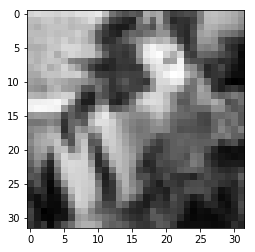

Bild Nr. 2
Richtiges Label [5]
Knn Label Ergebnis: [2]


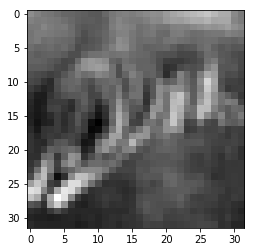

Bild Nr. 3
Richtiges Label [0]
Knn Label Ergebnis: [2]


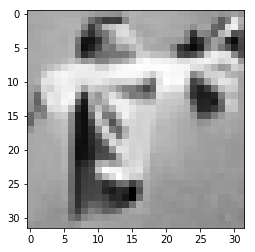

Bild Nr. 4
Richtiges Label [1]
Knn Label Ergebnis: [8]


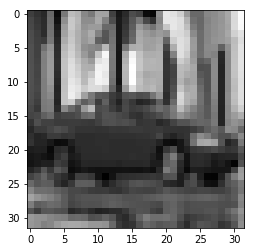

Bild Nr. 5
Richtiges Label [2]
Knn Label Ergebnis: [4]


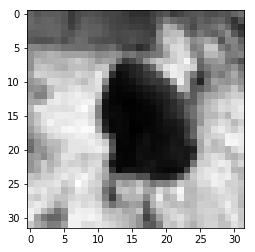

Bild Nr. 6
Richtiges Label [6]
Knn Label Ergebnis: [4]


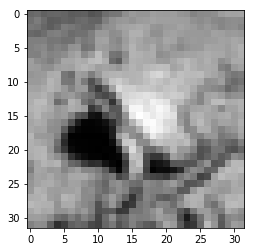

Bild Nr. 7
Richtiges Label [1]
Knn Label Ergebnis: [0]


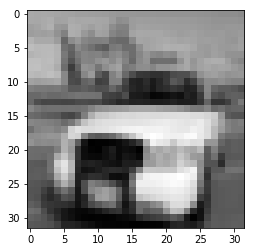

Bild Nr. 8
Richtiges Label [1]
Knn Label Ergebnis: [8]


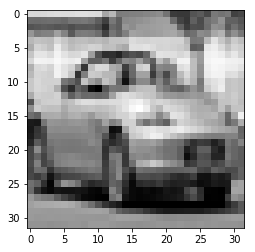

Bild Nr. 9
Richtiges Label [5]
Knn Label Ergebnis: [0]


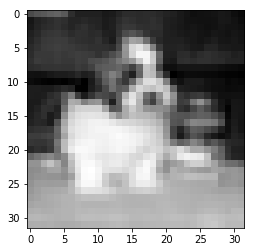

Bild Nr. 10
Richtiges Label [5]
Knn Label Ergebnis: [7]


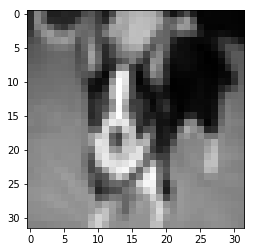

Bild Nr. 11
Richtiges Label [3]
Knn Label Ergebnis: [4]


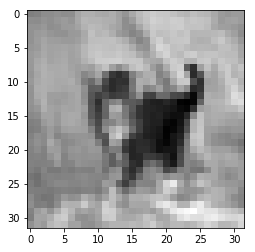

Bild Nr. 12
Richtiges Label [2]
Knn Label Ergebnis: [8]


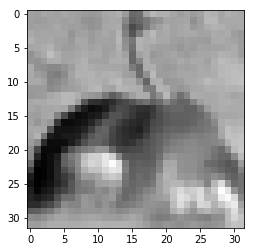

Bild Nr. 13
Richtiges Label [7]
Knn Label Ergebnis: [8]


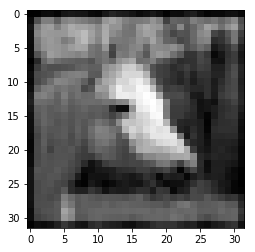

Bild Nr. 14
Richtiges Label [6]
Knn Label Ergebnis: [3]


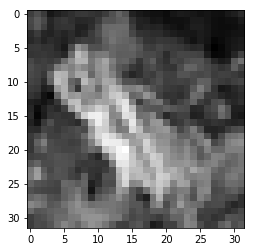

Bild Nr. 15
Richtiges Label [7]
Knn Label Ergebnis: [4]


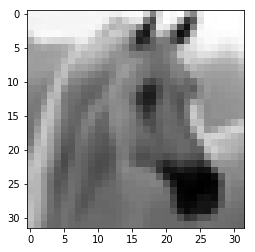

Bild Nr. 16
Richtiges Label [1]
Knn Label Ergebnis: [8]


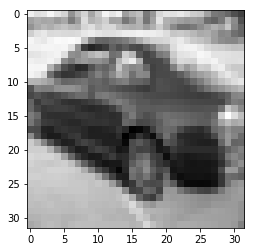

Bild Nr. 17
Richtiges Label [8]
Knn Label Ergebnis: [4]


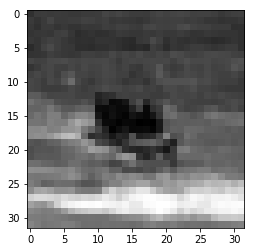

Bild Nr. 18
Richtiges Label [0]
Knn Label Ergebnis: [2]


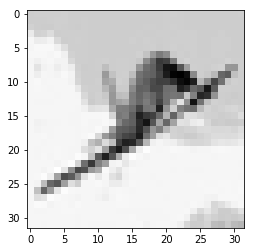

Bild Nr. 19
Richtiges Label [6]
Knn Label Ergebnis: [4]


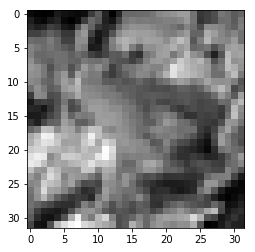

Bild Nr. 20
Richtiges Label [9]
Knn Label Ergebnis: [4]


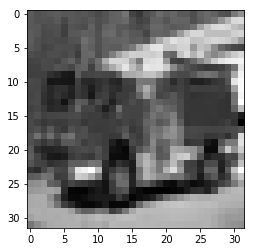

Bild Nr. 21
Richtiges Label [0]
Knn Label Ergebnis: [8]


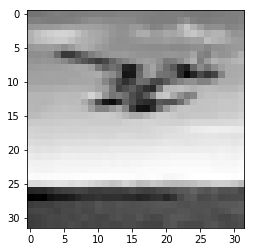

Bild Nr. 22
Richtiges Label [0]
Knn Label Ergebnis: [2]


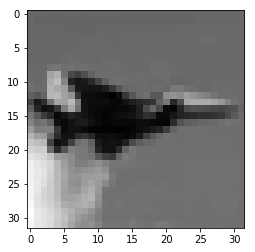

Bild Nr. 23
Richtiges Label [2]
Knn Label Ergebnis: [4]


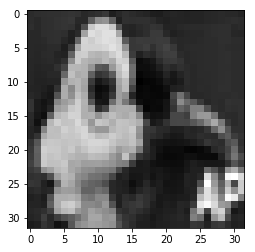

Bild Nr. 24
Richtiges Label [2]
Knn Label Ergebnis: [0]


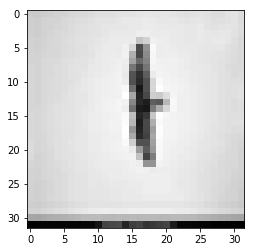

Bild Nr. 25
Richtiges Label [1]
Knn Label Ergebnis: [8]


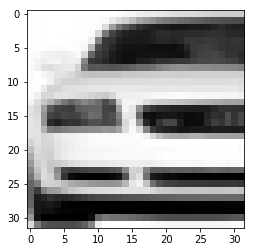

Bild Nr. 26
Richtiges Label [6]
Knn Label Ergebnis: [4]


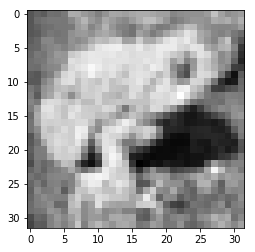

Bild Nr. 27
Richtiges Label [3]
Knn Label Ergebnis: [5]


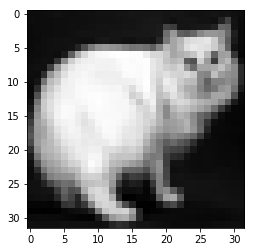

Bild Nr. 28
Richtiges Label [7]
Knn Label Ergebnis: [3]


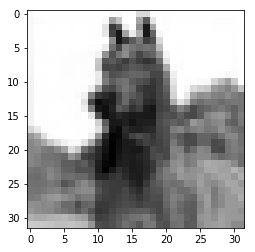

Bild Nr. 29
Richtiges Label [5]
Knn Label Ergebnis: [2]


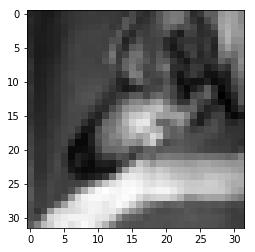

Bild Nr. 30
Richtiges Label [6]
Knn Label Ergebnis: [2]


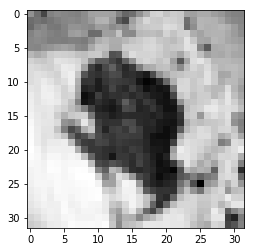

Bild Nr. 31
Richtiges Label [1]
Knn Label Ergebnis: [8]


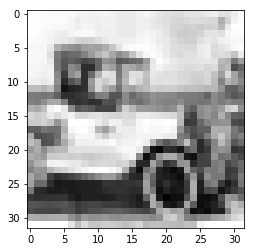

Bild Nr. 32
Richtiges Label [8]
Knn Label Ergebnis: [3]


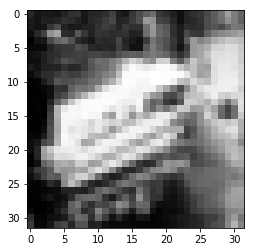

Bild Nr. 33
Richtiges Label [9]
Knn Label Ergebnis: [8]


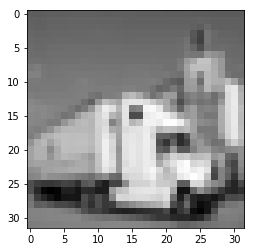

Bild Nr. 34
Richtiges Label [7]
Knn Label Ergebnis: [1]


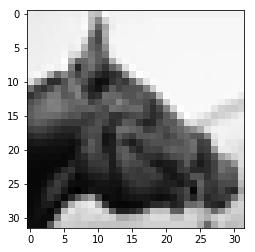

Bild Nr. 35
Richtiges Label [1]
Knn Label Ergebnis: [2]


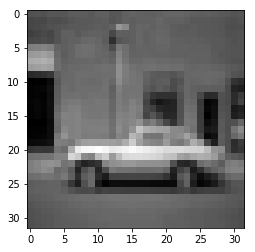

Bild Nr. 36
Richtiges Label [7]
Knn Label Ergebnis: [4]


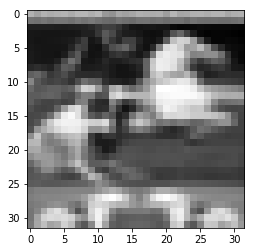

Bild Nr. 37
Richtiges Label [6]
Knn Label Ergebnis: [5]


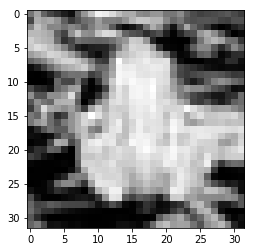

Bild Nr. 38
Richtiges Label [9]
Knn Label Ergebnis: [2]


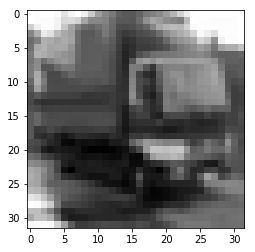

Bild Nr. 39
Richtiges Label [4]
Knn Label Ergebnis: [0]


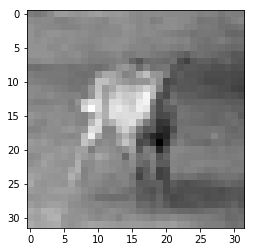

Bild Nr. 40
Richtiges Label [9]
Knn Label Ergebnis: [3]


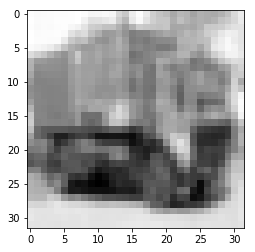

Bild Nr. 41
Richtiges Label [3]
Knn Label Ergebnis: [4]


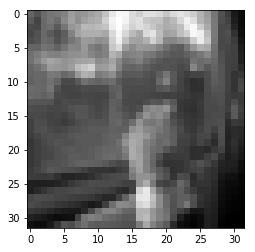

Bild Nr. 42
Richtiges Label [3]
Knn Label Ergebnis: [0]


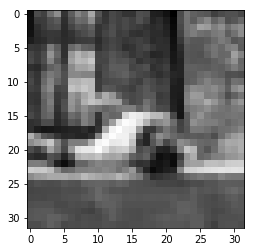

Bild Nr. 43
Richtiges Label [4]
Knn Label Ergebnis: [2]


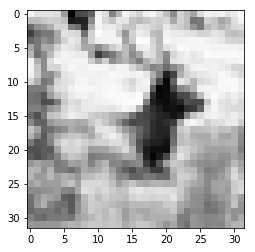

Bild Nr. 44
Richtiges Label [3]
Knn Label Ergebnis: [6]


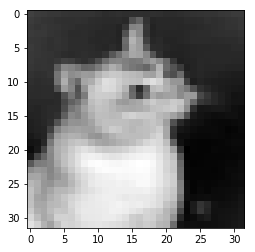

Bild Nr. 45
Richtiges Label [5]
Knn Label Ergebnis: [2]


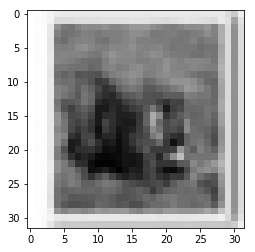

Bild Nr. 46
Richtiges Label [6]
Knn Label Ergebnis: [0]


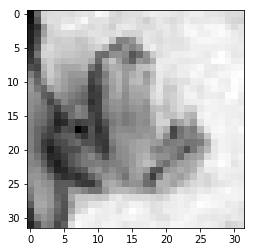

Bild Nr. 47
Richtiges Label [9]
Knn Label Ergebnis: [4]


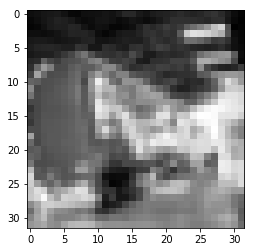

Bild Nr. 48
Richtiges Label [5]
Knn Label Ergebnis: [0]


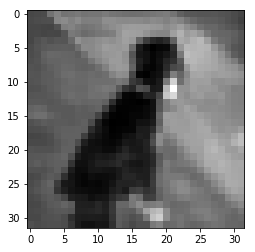

Bild Nr. 49
Richtiges Label [5]
Knn Label Ergebnis: [4]


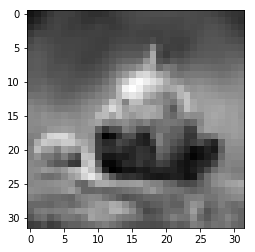

Bild Nr. 50
Richtiges Label [5]
Knn Label Ergebnis: [0]


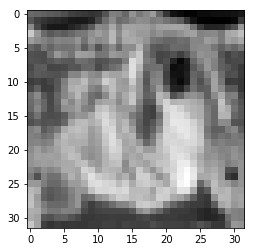

Bild Nr. 51
Richtiges Label [7]
Knn Label Ergebnis: [4]


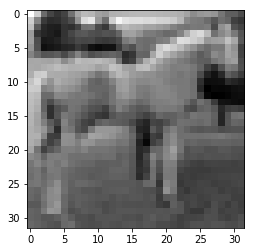

Bild Nr. 52
Richtiges Label [4]
Knn Label Ergebnis: [0]


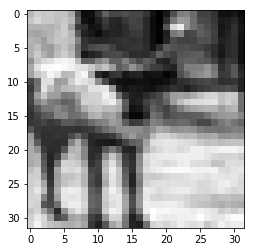

Bild Nr. 53
Richtiges Label [7]
Knn Label Ergebnis: [0]


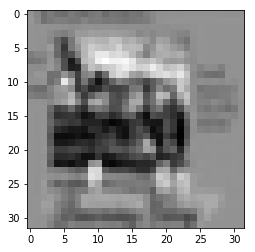

Bild Nr. 54
Richtiges Label [5]
Knn Label Ergebnis: [9]


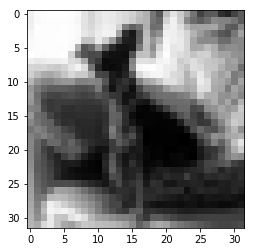

Bild Nr. 55
Richtiges Label [9]
Knn Label Ergebnis: [0]


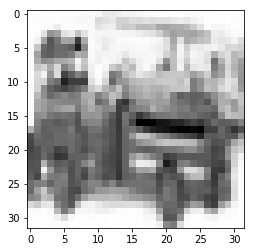

Bild Nr. 56
Richtiges Label [7]
Knn Label Ergebnis: [0]


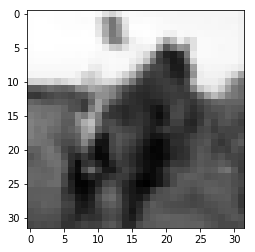

Bild Nr. 57
Richtiges Label [0]
Knn Label Ergebnis: [8]


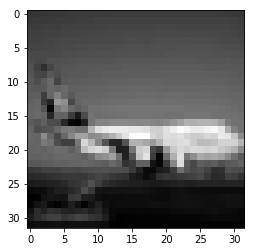

Bild Nr. 58
Richtiges Label [5]
Knn Label Ergebnis: [4]


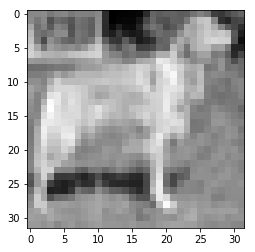

Bild Nr. 59
Richtiges Label [7]
Knn Label Ergebnis: [4]


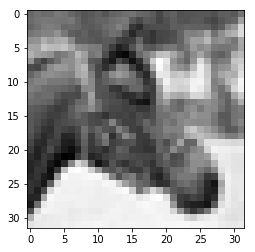

Bild Nr. 60
Richtiges Label [9]
Knn Label Ergebnis: [0]


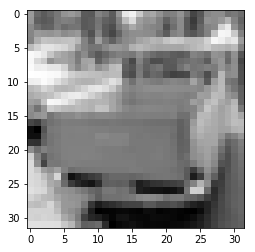

Bild Nr. 61
Richtiges Label [4]
Knn Label Ergebnis: [3]


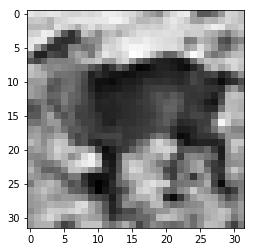

Bild Nr. 62
Richtiges Label [9]
Knn Label Ergebnis: [4]


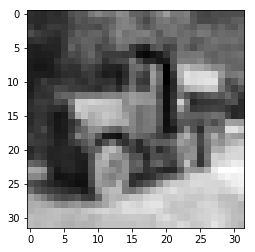

Bild Nr. 63
Richtiges Label [5]
Knn Label Ergebnis: [0]


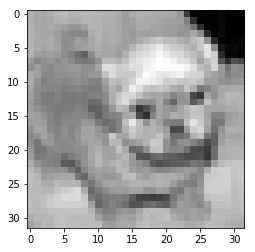

Bild Nr. 64
Richtiges Label [0]
Knn Label Ergebnis: [8]


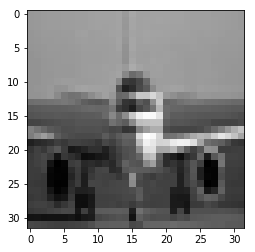

Bild Nr. 65
Richtiges Label [9]
Knn Label Ergebnis: [3]


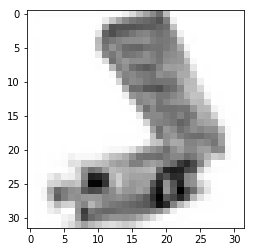

Bild Nr. 66
Richtiges Label [5]
Knn Label Ergebnis: [2]


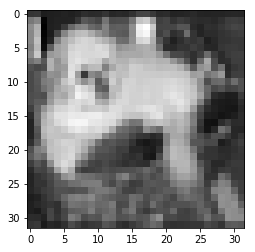

Bild Nr. 67
Richtiges Label [8]
Knn Label Ergebnis: [2]


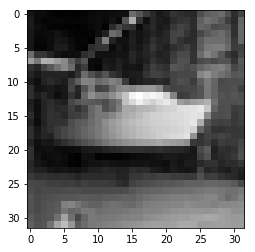

Bild Nr. 68
Richtiges Label [3]
Knn Label Ergebnis: [2]


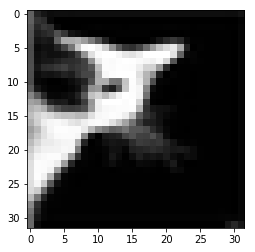

Bild Nr. 69
Richtiges Label [0]
Knn Label Ergebnis: [8]


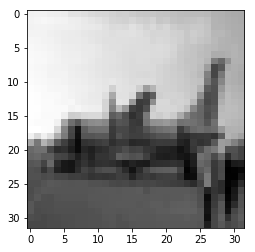

Bild Nr. 70
Richtiges Label [9]
Knn Label Ergebnis: [8]


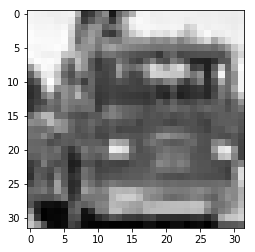

Bild Nr. 71
Richtiges Label [9]
Knn Label Ergebnis: [8]


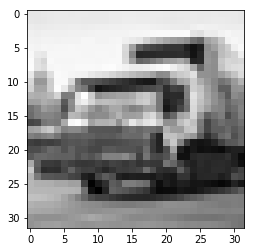

Bild Nr. 72
Richtiges Label [2]
Knn Label Ergebnis: [4]


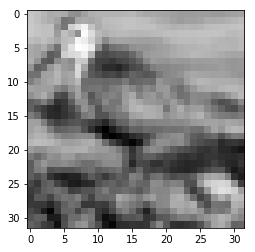

Bild Nr. 73
Richtiges Label [2]
Knn Label Ergebnis: [3]


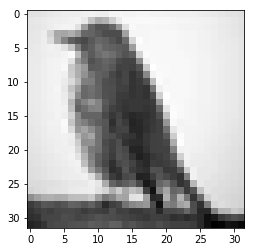

Bild Nr. 74
Richtiges Label [3]
Knn Label Ergebnis: [2]


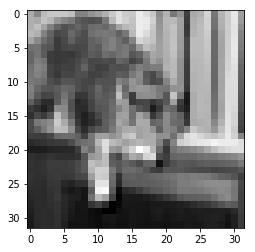

Bild Nr. 75
Richtiges Label [6]
Knn Label Ergebnis: [0]


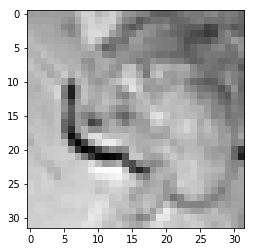

Bild Nr. 76
Richtiges Label [4]
Knn Label Ergebnis: [2]


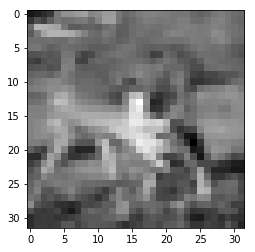

Bild Nr. 77
Richtiges Label [4]
Knn Label Ergebnis: [8]


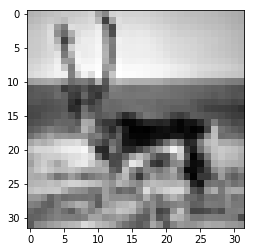

Bild Nr. 78
Richtiges Label [5]
Knn Label Ergebnis: [2]


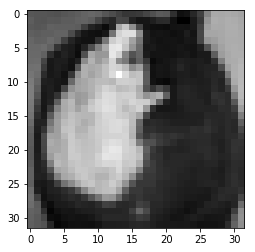

Bild Nr. 79
Richtiges Label [6]
Knn Label Ergebnis: [8]


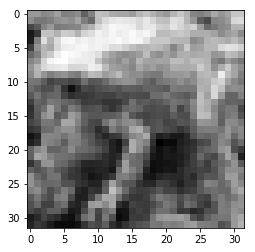

Bild Nr. 80
Richtiges Label [3]
Knn Label Ergebnis: [0]


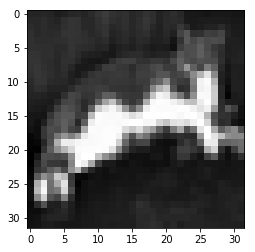

Bild Nr. 81
Richtiges Label [0]
Knn Label Ergebnis: [2]


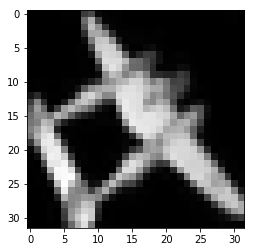

Bild Nr. 82
Richtiges Label [5]
Knn Label Ergebnis: [0]


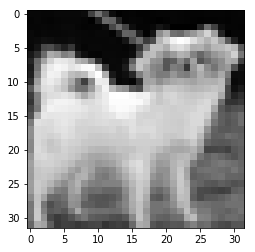

Bild Nr. 83
Richtiges Label [5]
Knn Label Ergebnis: [0]


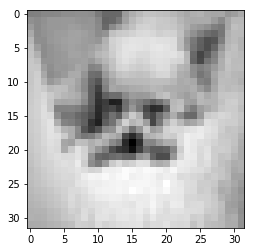

Bild Nr. 84
Richtiges Label [6]
Knn Label Ergebnis: [8]


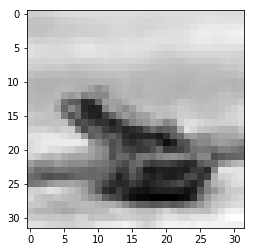

Bild Nr. 85
Richtiges Label [8]
Knn Label Ergebnis: [0]


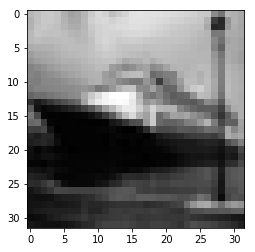

Bild Nr. 86
Richtiges Label [4]
Knn Label Ergebnis: [2]


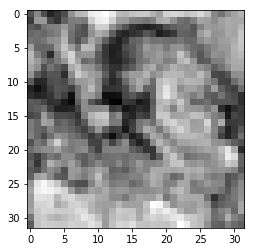

Bild Nr. 87
Richtiges Label [4]
Knn Label Ergebnis: [3]


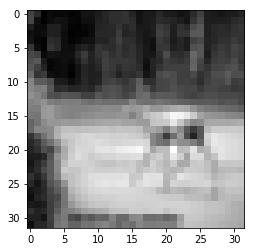

Bild Nr. 88
Richtiges Label [9]
Knn Label Ergebnis: [8]


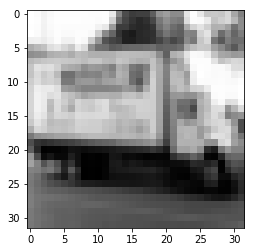

Bild Nr. 89
Richtiges Label [7]
Knn Label Ergebnis: [6]


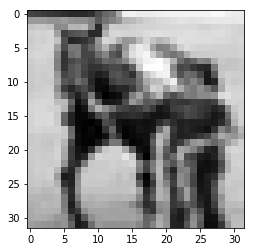

Bild Nr. 90
Richtiges Label [4]
Knn Label Ergebnis: [9]


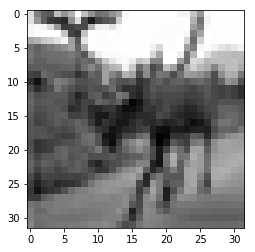

Bild Nr. 91
Richtiges Label [7]
Knn Label Ergebnis: [4]


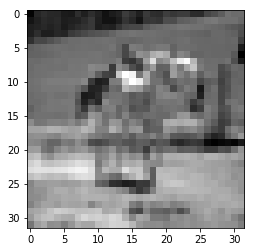

Bild Nr. 92
Richtiges Label [7]
Knn Label Ergebnis: [0]


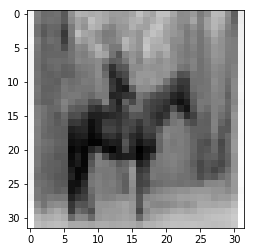

Bild Nr. 93
Richtiges Label [8]
Knn Label Ergebnis: [0]


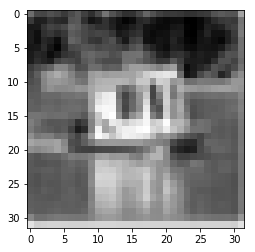

Bild Nr. 94
Richtiges Label [4]
Knn Label Ergebnis: [2]


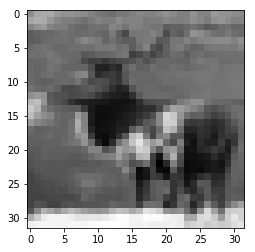

Bild Nr. 95
Richtiges Label [1]
Knn Label Ergebnis: [2]


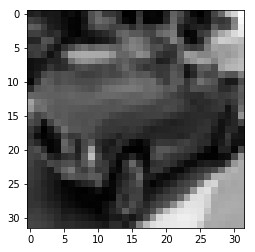

Bild Nr. 96
Richtiges Label [2]
Knn Label Ergebnis: [4]


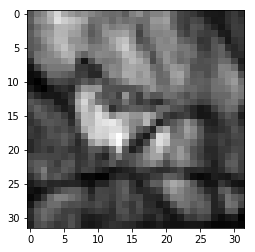

Bild Nr. 97
Richtiges Label [7]
Knn Label Ergebnis: [2]


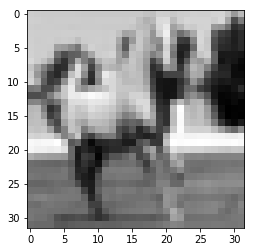

Bild Nr. 98
Richtiges Label [3]
Knn Label Ergebnis: [0]


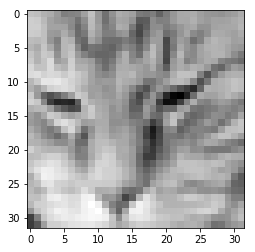

Bild Nr. 99
Richtiges Label [6]
Knn Label Ergebnis: [8]


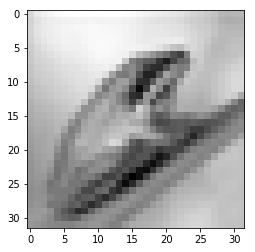

Bild Nr. 100
Richtiges Label [9]
Knn Label Ergebnis: [8]


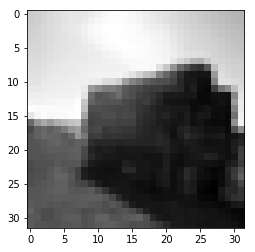

Bild Nr. 101
Richtiges Label [1]
Knn Label Ergebnis: [8]


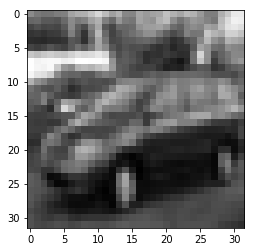

Bild Nr. 102
Richtiges Label [4]
Knn Label Ergebnis: [2]


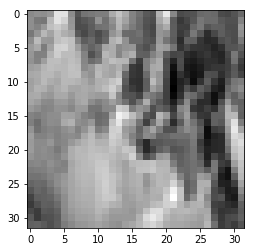

Bild Nr. 103
Richtiges Label [7]
Knn Label Ergebnis: [6]


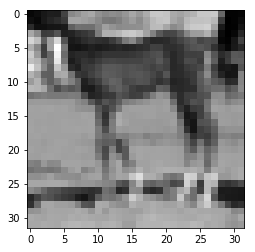

Bild Nr. 104
Richtiges Label [9]
Knn Label Ergebnis: [8]


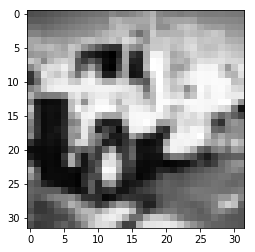

Bild Nr. 105
Richtiges Label [7]
Knn Label Ergebnis: [4]


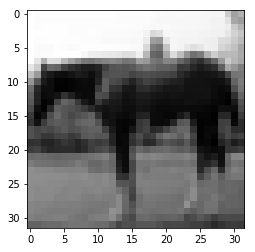

Bild Nr. 106
Richtiges Label [1]
Knn Label Ergebnis: [4]


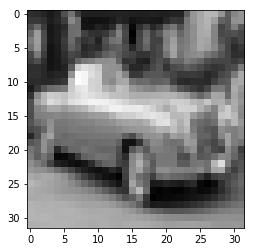

Bild Nr. 107
Richtiges Label [3]
Knn Label Ergebnis: [4]


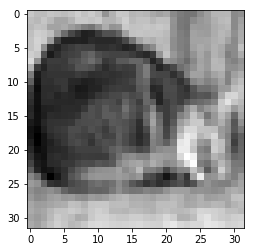

Bild Nr. 108
Richtiges Label [0]
Knn Label Ergebnis: [8]


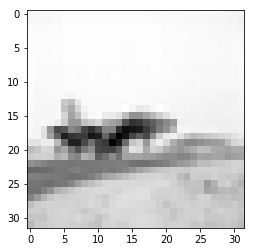

Bild Nr. 109
Richtiges Label [2]
Knn Label Ergebnis: [4]


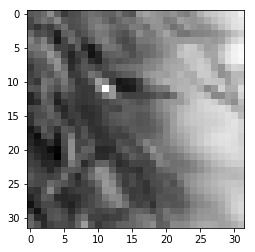

Bild Nr. 110
Richtiges Label [3]
Knn Label Ergebnis: [2]


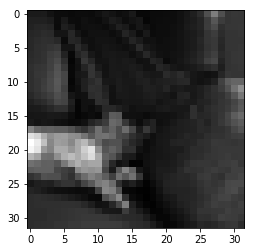

Bild Nr. 111
Richtiges Label [2]
Knn Label Ergebnis: [6]


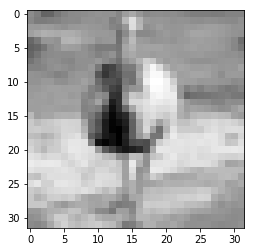

Bild Nr. 112
Richtiges Label [5]
Knn Label Ergebnis: [2]


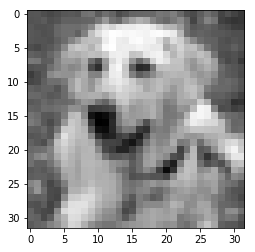

Bild Nr. 113
Richtiges Label [1]
Knn Label Ergebnis: [8]


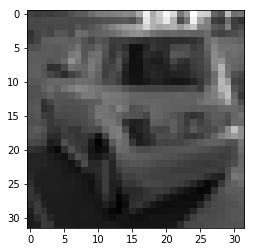

Bild Nr. 114
Richtiges Label [1]
Knn Label Ergebnis: [4]


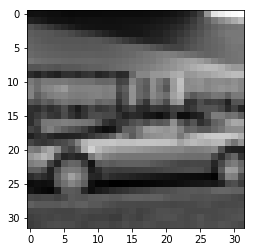

Bild Nr. 115
Richtiges Label [1]
Knn Label Ergebnis: [6]


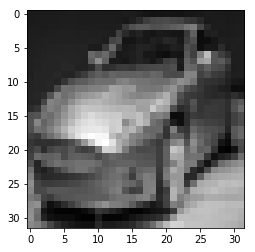

Bild Nr. 116
Richtiges Label [6]
Knn Label Ergebnis: [0]


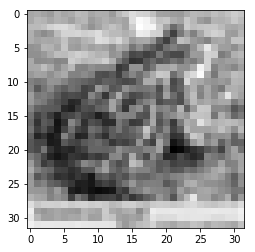

Bild Nr. 117
Richtiges Label [7]
Knn Label Ergebnis: [0]


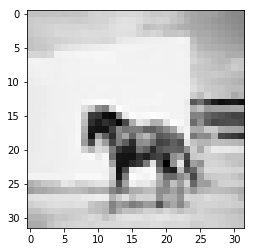

Bild Nr. 118
Richtiges Label [8]
Knn Label Ergebnis: [4]


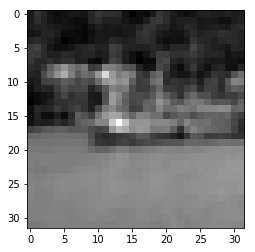

Bild Nr. 119
Richtiges Label [1]
Knn Label Ergebnis: [0]


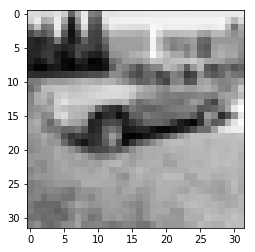

Bild Nr. 120
Richtiges Label [9]
Knn Label Ergebnis: [4]


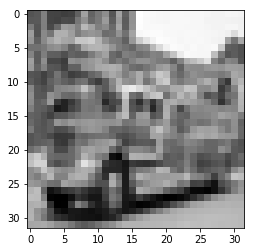

Bild Nr. 121
Richtiges Label [4]
Knn Label Ergebnis: [2]


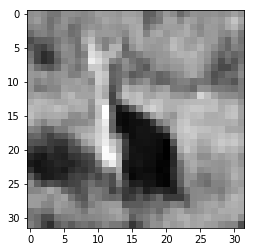

Bild Nr. 122
Richtiges Label [3]
Knn Label Ergebnis: [8]


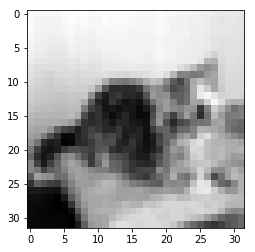

Bild Nr. 123
Richtiges Label [0]
Knn Label Ergebnis: [4]


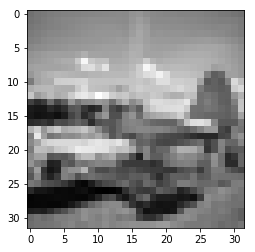

Bild Nr. 124
Richtiges Label [7]
Knn Label Ergebnis: [4]


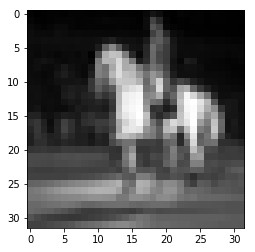

Bild Nr. 125
Richtiges Label [1]
Knn Label Ergebnis: [8]


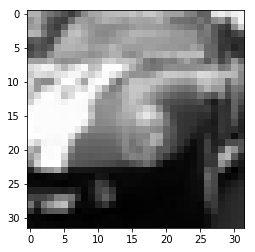

Bild Nr. 126
Richtiges Label [0]
Knn Label Ergebnis: [6]


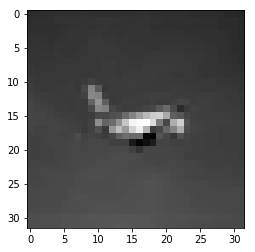

Bild Nr. 127
Richtiges Label [4]
Knn Label Ergebnis: [2]


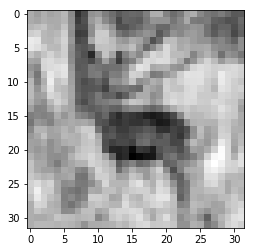

Bild Nr. 128
Richtiges Label [3]
Knn Label Ergebnis: [4]


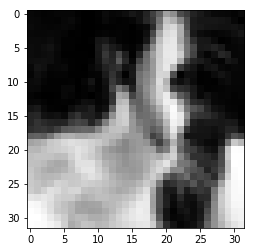

Bild Nr. 129
Richtiges Label [9]
Knn Label Ergebnis: [8]


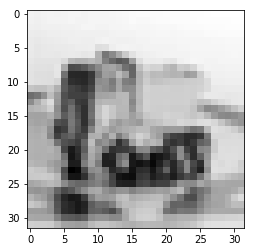

Bild Nr. 130
Richtiges Label [6]
Knn Label Ergebnis: [0]


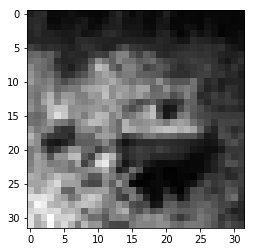

Bild Nr. 131
Richtiges Label [4]
Knn Label Ergebnis: [3]


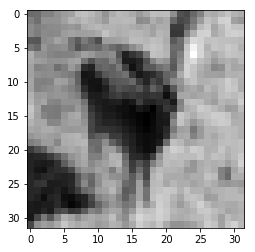

Bild Nr. 132
Richtiges Label [2]
Knn Label Ergebnis: [0]


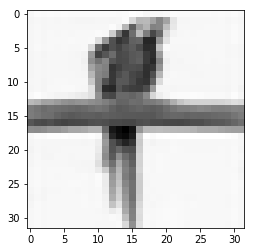

Bild Nr. 133
Richtiges Label [8]
Knn Label Ergebnis: [0]


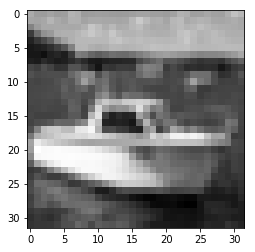

Bild Nr. 134
Richtiges Label [3]
Knn Label Ergebnis: [8]


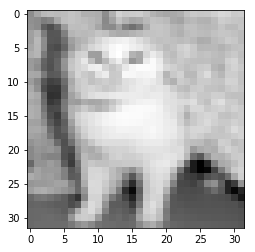

Bild Nr. 135
Richtiges Label [5]
Knn Label Ergebnis: [3]


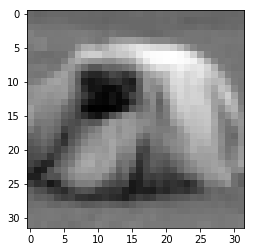

Bild Nr. 136
Richtiges Label [6]
Knn Label Ergebnis: [2]


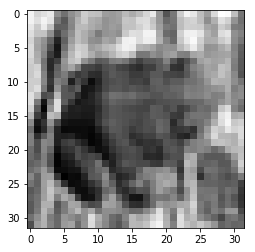

Bild Nr. 137
Richtiges Label [8]
Knn Label Ergebnis: [0]


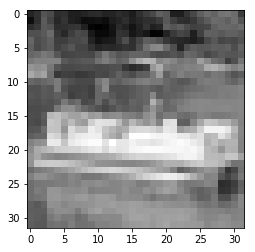

Bild Nr. 138
Richtiges Label [6]
Knn Label Ergebnis: [2]


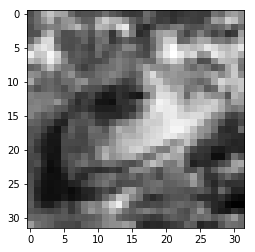

Bild Nr. 139
Richtiges Label [1]
Knn Label Ergebnis: [8]


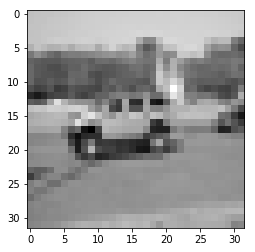

Bild Nr. 140
Richtiges Label [3]
Knn Label Ergebnis: [2]


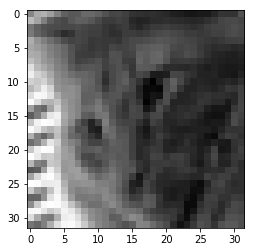

Bild Nr. 141
Richtiges Label [9]
Knn Label Ergebnis: [8]


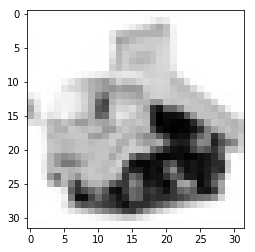

Bild Nr. 142
Richtiges Label [3]
Knn Label Ergebnis: [0]


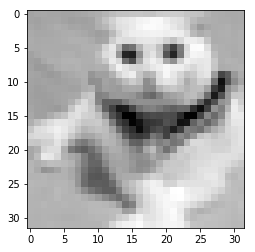

Bild Nr. 143
Richtiges Label [3]
Knn Label Ergebnis: [0]


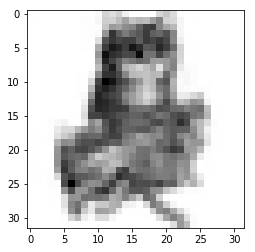

Bild Nr. 144
Richtiges Label [3]
Knn Label Ergebnis: [0]


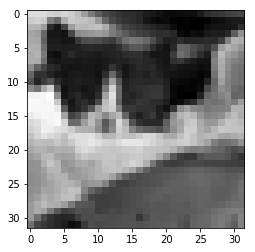

Bild Nr. 145
Richtiges Label [2]
Knn Label Ergebnis: [4]


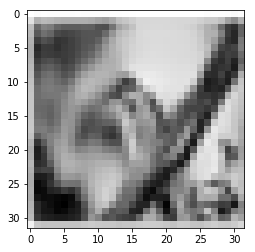

Bild Nr. 146
Richtiges Label [1]
Knn Label Ergebnis: [0]


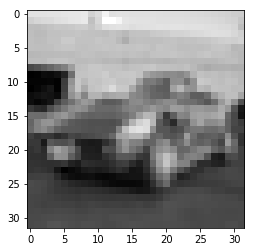

Bild Nr. 147
Richtiges Label [3]
Knn Label Ergebnis: [0]


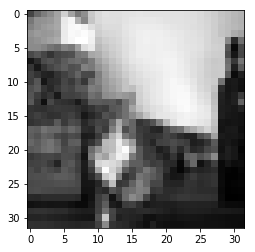

Bild Nr. 148
Richtiges Label [3]
Knn Label Ergebnis: [0]


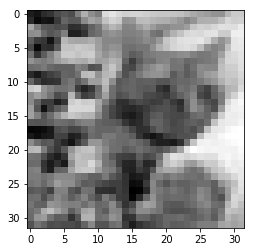

Bild Nr. 149
Richtiges Label [2]
Knn Label Ergebnis: [0]


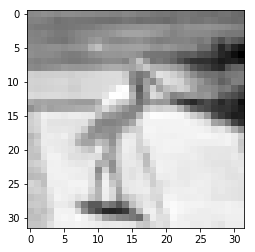

Bild Nr. 150
Richtiges Label [9]
Knn Label Ergebnis: [4]


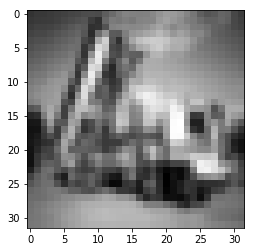

Bild Nr. 151
Richtiges Label [3]
Knn Label Ergebnis: [2]


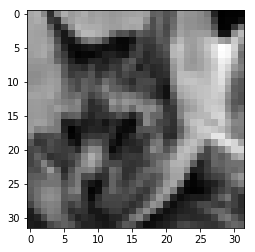

Bild Nr. 152
Richtiges Label [7]
Knn Label Ergebnis: [2]


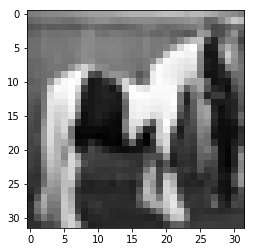

Bild Nr. 153
Richtiges Label [7]
Knn Label Ergebnis: [0]


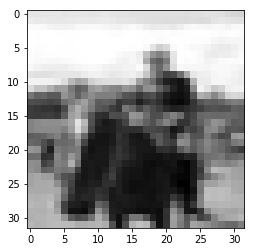

Bild Nr. 154
Richtiges Label [6]
Knn Label Ergebnis: [0]


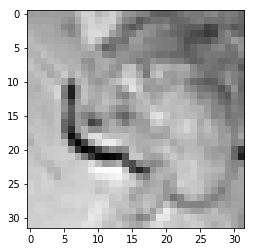

Bild Nr. 155
Richtiges Label [3]
Knn Label Ergebnis: [4]


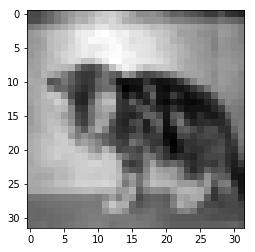

Bild Nr. 156
Richtiges Label [8]
Knn Label Ergebnis: [2]


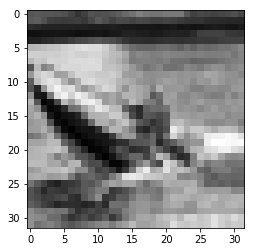

Bild Nr. 157
Richtiges Label [3]
Knn Label Ergebnis: [5]


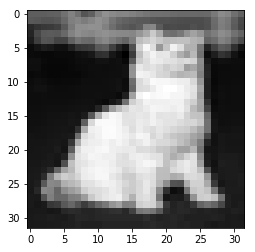

Bild Nr. 158
Richtiges Label [2]
Knn Label Ergebnis: [0]


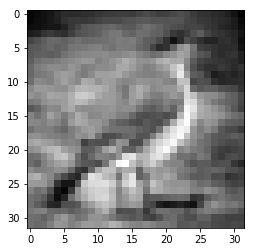

Bild Nr. 159
Richtiges Label [0]
Knn Label Ergebnis: [8]


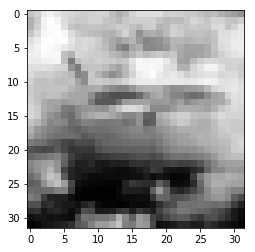

Bild Nr. 160
Richtiges Label [8]
Knn Label Ergebnis: [3]


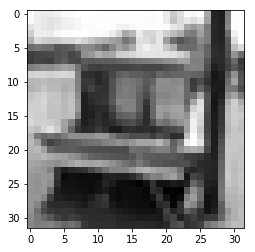

Bild Nr. 161
Richtiges Label [9]
Knn Label Ergebnis: [4]


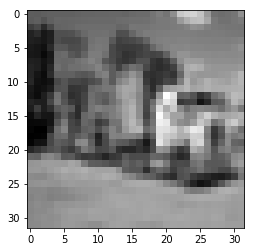

Bild Nr. 162
Richtiges Label [3]
Knn Label Ergebnis: [0]


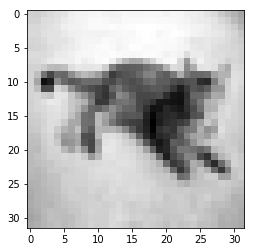

Bild Nr. 163
Richtiges Label [3]
Knn Label Ergebnis: [4]


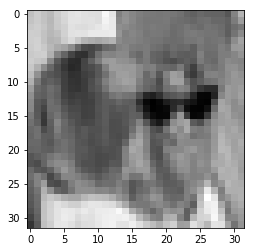

Bild Nr. 164
Richtiges Label [9]
Knn Label Ergebnis: [8]


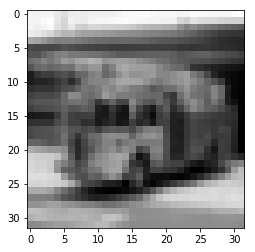

Bild Nr. 165
Richtiges Label [8]
Knn Label Ergebnis: [4]


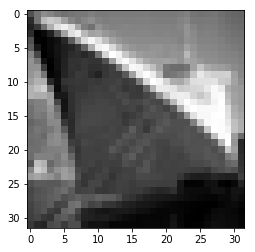

Bild Nr. 166
Richtiges Label [0]
Knn Label Ergebnis: [8]


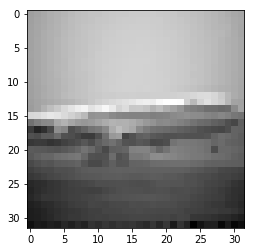

Bild Nr. 167
Richtiges Label [7]
Knn Label Ergebnis: [0]


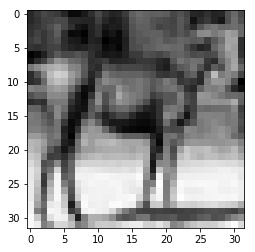

Bild Nr. 168
Richtiges Label [7]
Knn Label Ergebnis: [4]


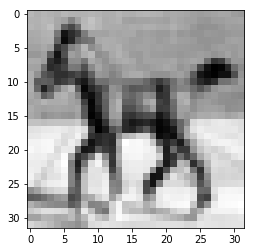

Bild Nr. 169
Richtiges Label [3]
Knn Label Ergebnis: [4]


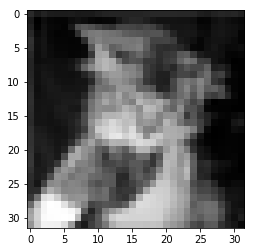

Bild Nr. 170
Richtiges Label [5]
Knn Label Ergebnis: [3]


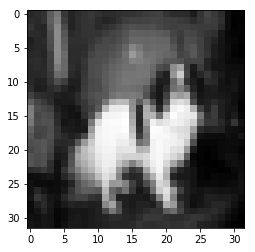

Bild Nr. 171
Richtiges Label [1]
Knn Label Ergebnis: [3]


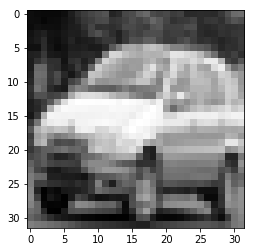

Bild Nr. 172
Richtiges Label [4]
Knn Label Ergebnis: [2]


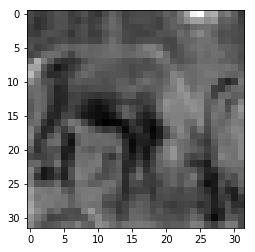

Bild Nr. 173
Richtiges Label [6]
Knn Label Ergebnis: [3]


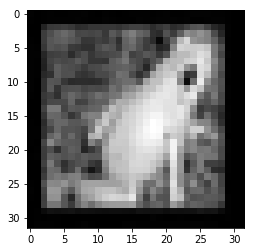

Bild Nr. 174
Richtiges Label [7]
Knn Label Ergebnis: [4]


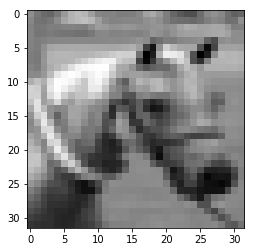

Bild Nr. 175
Richtiges Label [3]
Knn Label Ergebnis: [4]


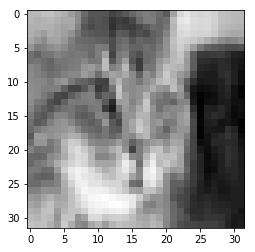

Bild Nr. 176
Richtiges Label [4]
Knn Label Ergebnis: [2]


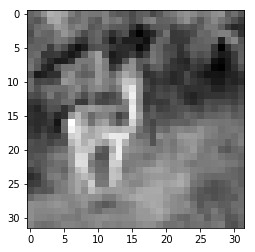

Bild Nr. 177
Richtiges Label [5]
Knn Label Ergebnis: [4]


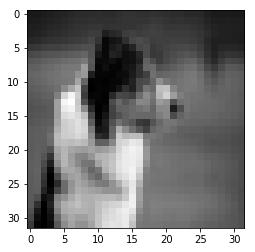

Bild Nr. 178
Richtiges Label [3]
Knn Label Ergebnis: [6]


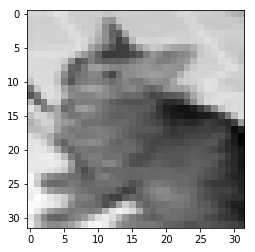

Bild Nr. 179
Richtiges Label [9]
Knn Label Ergebnis: [4]


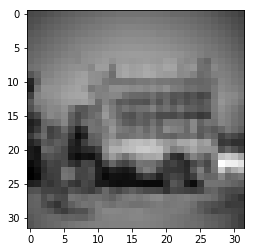

Bild Nr. 180
Richtiges Label [9]
Knn Label Ergebnis: [8]


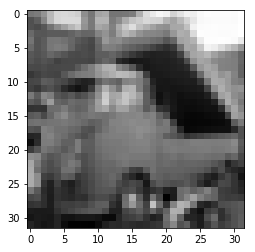

Bild Nr. 181
Richtiges Label [6]
Knn Label Ergebnis: [2]


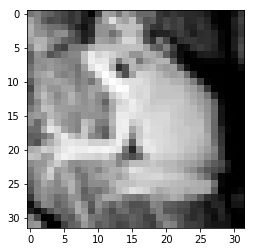

Bild Nr. 182
Richtiges Label [2]
Knn Label Ergebnis: [4]


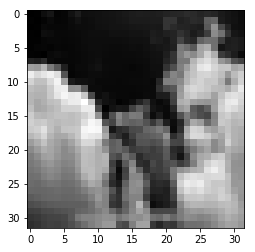

Bild Nr. 183
Richtiges Label [0]
Knn Label Ergebnis: [8]


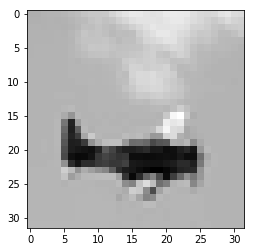

Bild Nr. 184
Richtiges Label [8]
Knn Label Ergebnis: [0]


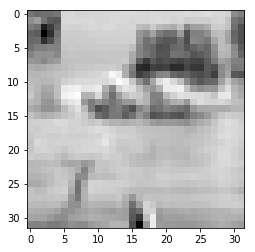

Bild Nr. 185
Richtiges Label [0]
Knn Label Ergebnis: [4]


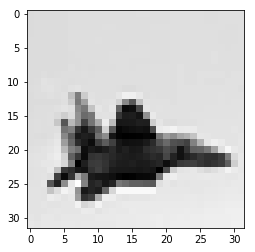

Bild Nr. 186
Richtiges Label [1]
Knn Label Ergebnis: [0]


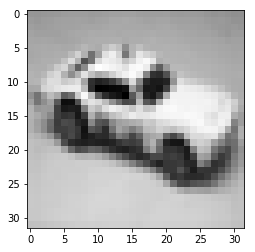

Bild Nr. 187
Richtiges Label [4]
Knn Label Ergebnis: [2]


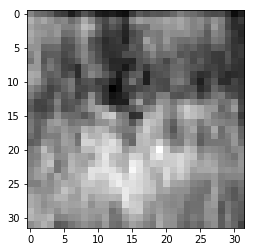

Bild Nr. 188
Richtiges Label [4]
Knn Label Ergebnis: [0]


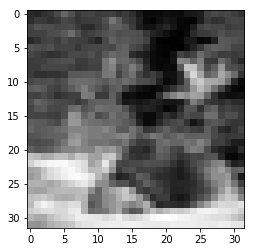

Bild Nr. 189
Richtiges Label [1]
Knn Label Ergebnis: [0]


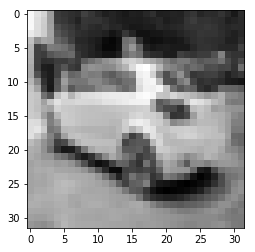

Bild Nr. 190
Richtiges Label [9]
Knn Label Ergebnis: [0]


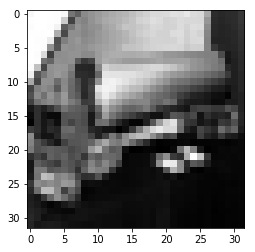

Bild Nr. 191
Richtiges Label [6]
Knn Label Ergebnis: [4]


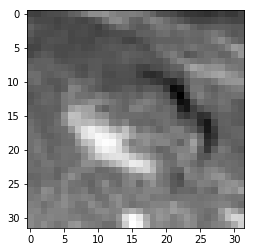

Bild Nr. 192
Richtiges Label [2]
Knn Label Ergebnis: [4]


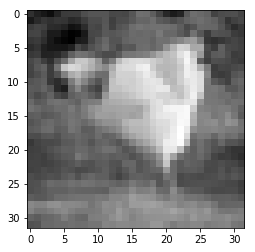

Bild Nr. 193
Richtiges Label [3]
Knn Label Ergebnis: [2]


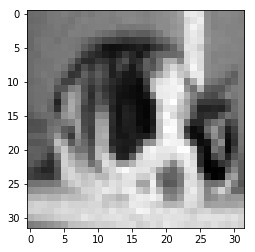

Bild Nr. 194
Richtiges Label [0]
Knn Label Ergebnis: [8]


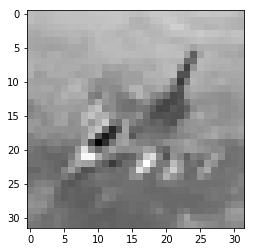

Bild Nr. 195
Richtiges Label [7]
Knn Label Ergebnis: [8]


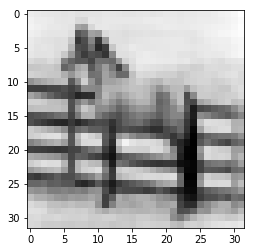

Bild Nr. 196
Richtiges Label [8]
Knn Label Ergebnis: [0]


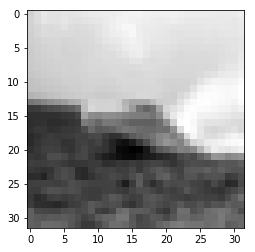

Bild Nr. 197
Richtiges Label [1]
Knn Label Ergebnis: [0]


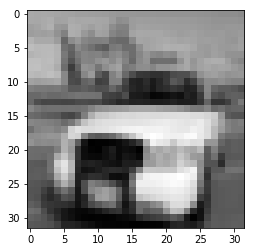

Bild Nr. 198
Richtiges Label [1]
Knn Label Ergebnis: [0]


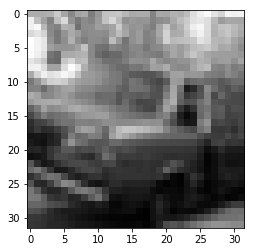

Bild Nr. 199
Richtiges Label [0]
Knn Label Ergebnis: [2]


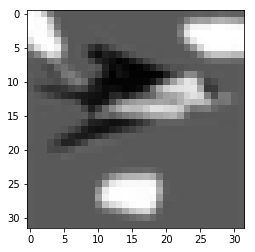

Bild Nr. 200
Richtiges Label [4]
Knn Label Ergebnis: [0]


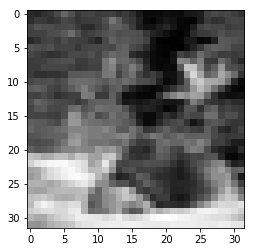

Bild Nr. 201
Richtiges Label [7]
Knn Label Ergebnis: [0]


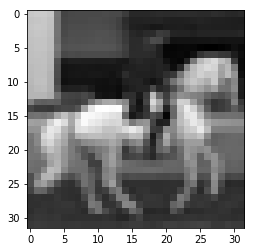

Bild Nr. 202
Richtiges Label [4]
Knn Label Ergebnis: [2]


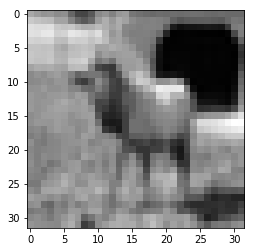

Bild Nr. 203
Richtiges Label [9]
Knn Label Ergebnis: [8]


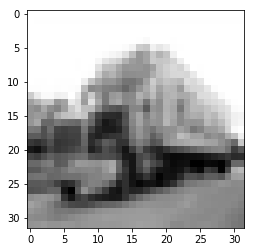

Bild Nr. 204
Richtiges Label [1]
Knn Label Ergebnis: [4]


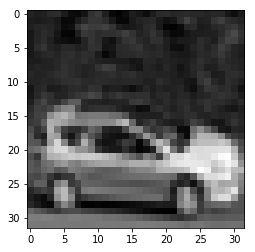

Bild Nr. 205
Richtiges Label [7]
Knn Label Ergebnis: [3]


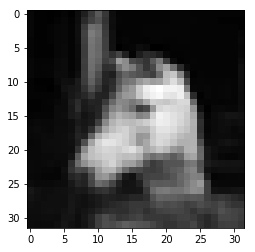

Bild Nr. 206
Richtiges Label [5]
Knn Label Ergebnis: [4]


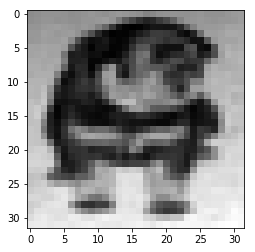

Bild Nr. 207
Richtiges Label [3]
Knn Label Ergebnis: [2]


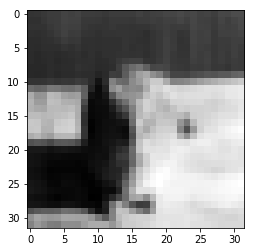

Bild Nr. 208
Richtiges Label [6]
Knn Label Ergebnis: [8]


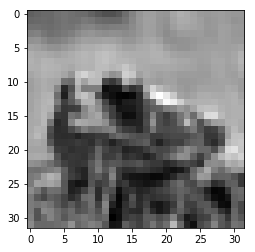

Bild Nr. 209
Richtiges Label [3]
Knn Label Ergebnis: [5]


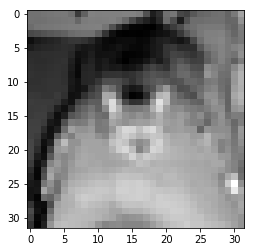

Bild Nr. 210
Richtiges Label [7]
Knn Label Ergebnis: [2]


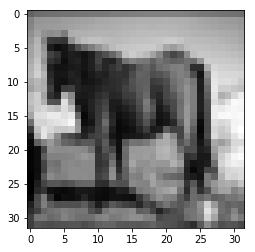

Bild Nr. 211
Richtiges Label [2]
Knn Label Ergebnis: [4]


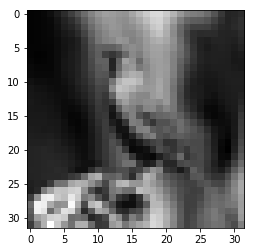

Bild Nr. 212
Richtiges Label [4]
Knn Label Ergebnis: [2]


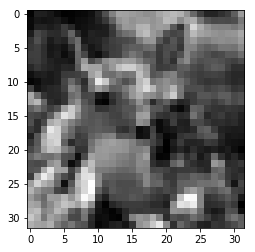

Bild Nr. 213
Richtiges Label [7]
Knn Label Ergebnis: [4]


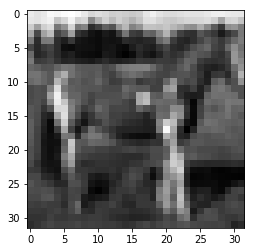

Bild Nr. 214
Richtiges Label [9]
Knn Label Ergebnis: [0]


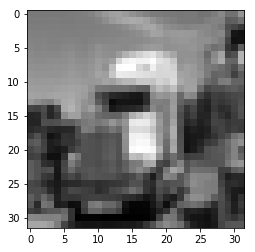

Bild Nr. 215
Richtiges Label [0]
Knn Label Ergebnis: [8]


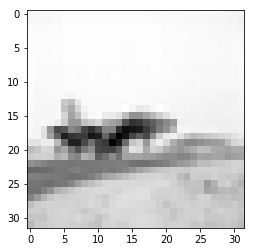

Bild Nr. 216
Richtiges Label [2]
Knn Label Ergebnis: [4]


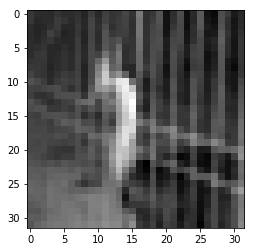

Bild Nr. 217
Richtiges Label [3]
Knn Label Ergebnis: [4]


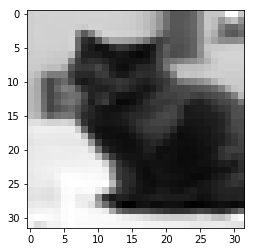

Bild Nr. 218
Richtiges Label [7]
Knn Label Ergebnis: [2]


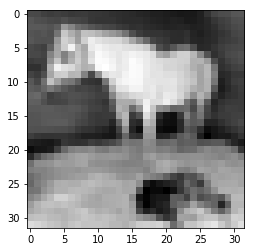

Bild Nr. 219
Richtiges Label [1]
Knn Label Ergebnis: [8]


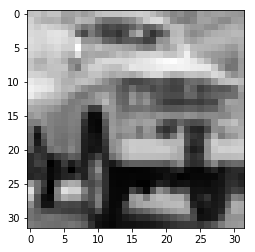

Bild Nr. 220
Richtiges Label [9]
Knn Label Ergebnis: [0]


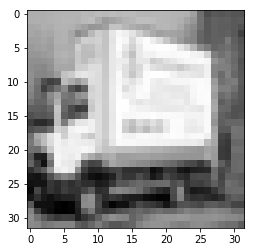

Bild Nr. 221
Richtiges Label [9]
Knn Label Ergebnis: [5]


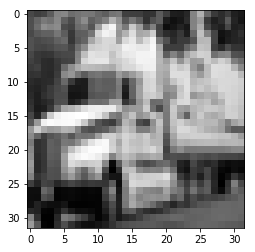

Bild Nr. 222
Richtiges Label [2]
Knn Label Ergebnis: [8]


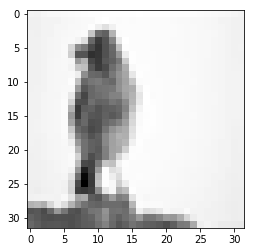

Bild Nr. 223
Richtiges Label [8]
Knn Label Ergebnis: [4]


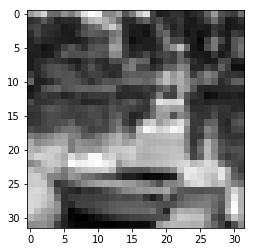

Bild Nr. 224
Richtiges Label [8]
Knn Label Ergebnis: [0]


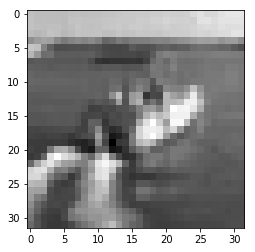

Bild Nr. 225
Richtiges Label [3]
Knn Label Ergebnis: [2]


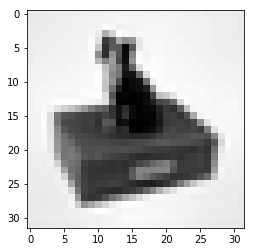

Bild Nr. 226
Richtiges Label [1]
Knn Label Ergebnis: [8]


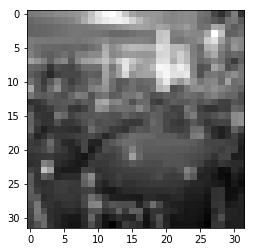

Bild Nr. 227
Richtiges Label [5]
Knn Label Ergebnis: [0]


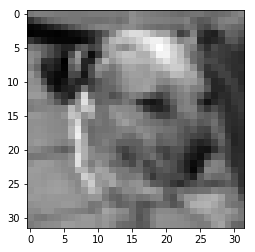

Bild Nr. 228
Richtiges Label [1]
Knn Label Ergebnis: [4]


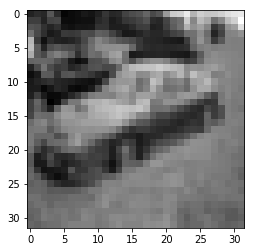

Bild Nr. 229
Richtiges Label [6]
Knn Label Ergebnis: [0]


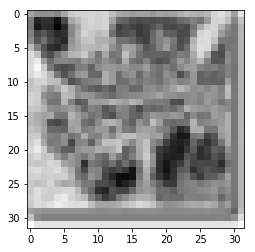

Bild Nr. 230
Richtiges Label [7]
Knn Label Ergebnis: [4]


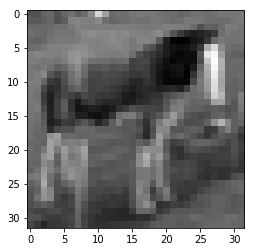

Bild Nr. 231
Richtiges Label [6]
Knn Label Ergebnis: [3]


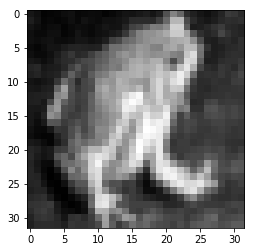

Bild Nr. 232
Richtiges Label [6]
Knn Label Ergebnis: [4]


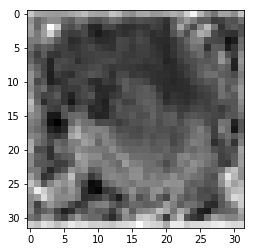

Bild Nr. 233
Richtiges Label [4]
Knn Label Ergebnis: [3]


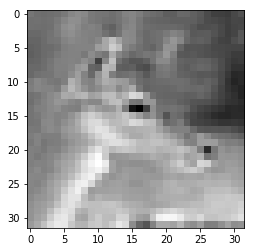

Bild Nr. 234
Richtiges Label [1]
Knn Label Ergebnis: [0]


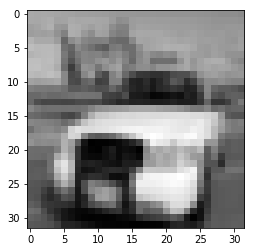

Bild Nr. 235
Richtiges Label [9]
Knn Label Ergebnis: [7]


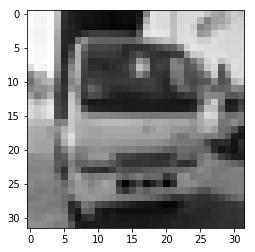

Bild Nr. 236
Richtiges Label [1]
Knn Label Ergebnis: [2]


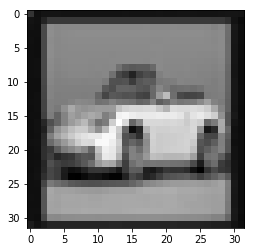

Bild Nr. 237
Richtiges Label [6]
Knn Label Ergebnis: [2]


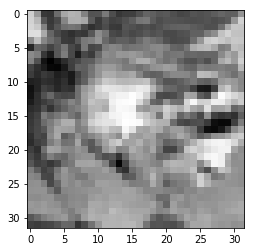

Bild Nr. 238
Richtiges Label [6]
Knn Label Ergebnis: [0]


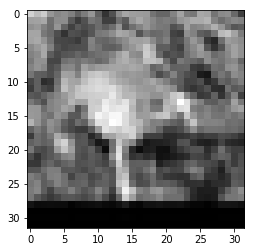

Bild Nr. 239
Richtiges Label [6]
Knn Label Ergebnis: [5]


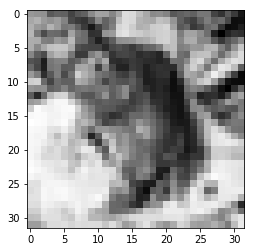

Bild Nr. 240
Richtiges Label [9]
Knn Label Ergebnis: [4]


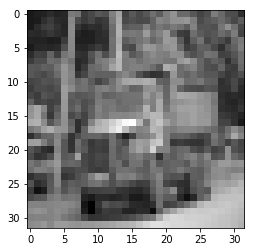

Bild Nr. 241
Richtiges Label [0]
Knn Label Ergebnis: [4]


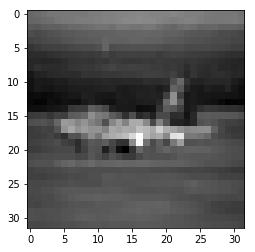

Bild Nr. 242
Richtiges Label [6]
Knn Label Ergebnis: [4]


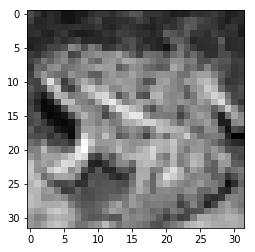

Bild Nr. 243
Richtiges Label [6]
Knn Label Ergebnis: [4]


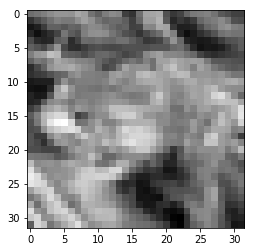

Bild Nr. 244
Richtiges Label [6]
Knn Label Ergebnis: [8]


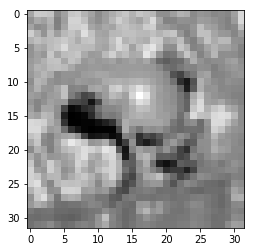

Bild Nr. 245
Richtiges Label [3]
Knn Label Ergebnis: [2]


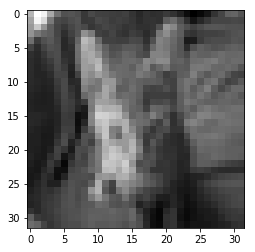

Bild Nr. 246
Richtiges Label [3]
Knn Label Ergebnis: [6]


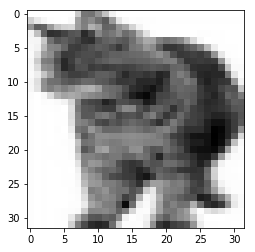

Bild Nr. 247
Richtiges Label [8]
Knn Label Ergebnis: [0]


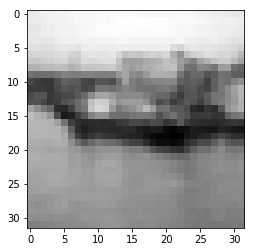

Bild Nr. 248
Richtiges Label [5]
Knn Label Ergebnis: [3]


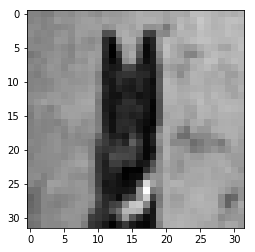

Bild Nr. 249
Richtiges Label [4]
Knn Label Ergebnis: [0]


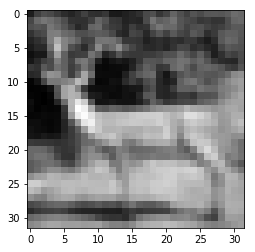

Bild Nr. 250
Richtiges Label [6]
Knn Label Ergebnis: [4]


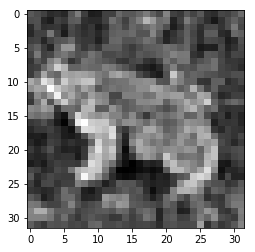

Bild Nr. 251
Richtiges Label [6]
Knn Label Ergebnis: [4]


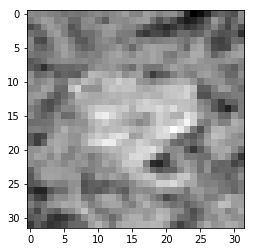

Bild Nr. 252
Richtiges Label [1]
Knn Label Ergebnis: [4]


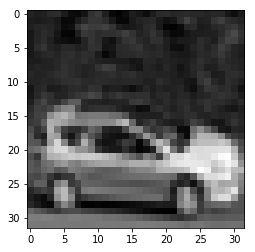

Bild Nr. 253
Richtiges Label [1]
Knn Label Ergebnis: [0]


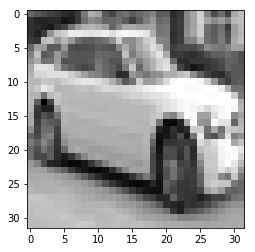

Bild Nr. 254
Richtiges Label [4]
Knn Label Ergebnis: [2]


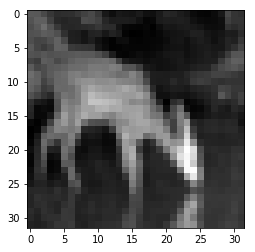

Bild Nr. 255
Richtiges Label [1]
Knn Label Ergebnis: [8]


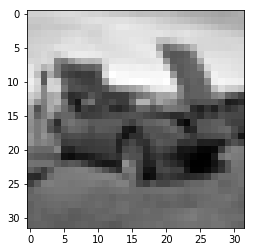

Bild Nr. 256
Richtiges Label [5]
Knn Label Ergebnis: [0]


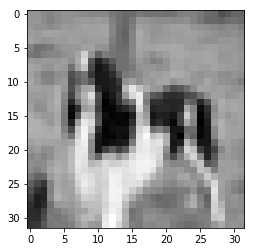

Bild Nr. 257
Richtiges Label [4]
Knn Label Ergebnis: [0]


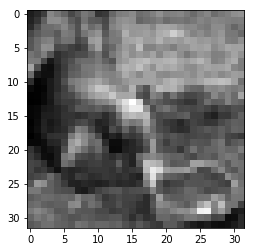

Bild Nr. 258
Richtiges Label [7]
Knn Label Ergebnis: [0]


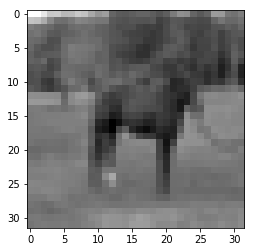

Bild Nr. 259
Richtiges Label [6]
Knn Label Ergebnis: [4]


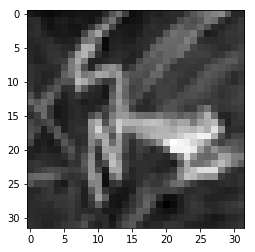

Bild Nr. 260
Richtiges Label [5]
Knn Label Ergebnis: [2]


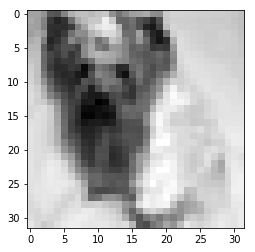

Bild Nr. 261
Richtiges Label [1]
Knn Label Ergebnis: [3]


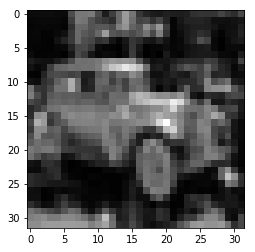

Bild Nr. 262
Richtiges Label [6]
Knn Label Ergebnis: [4]


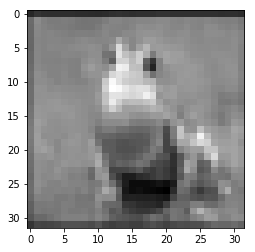

Bild Nr. 263
Richtiges Label [6]
Knn Label Ergebnis: [0]


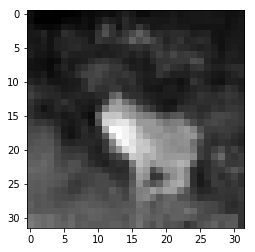

Bild Nr. 264
Richtiges Label [6]
Knn Label Ergebnis: [4]


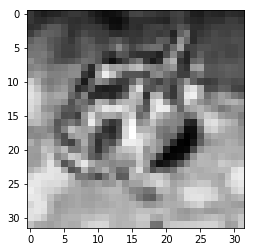

Bild Nr. 265
Richtiges Label [6]
Knn Label Ergebnis: [0]


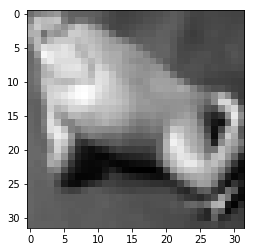

Bild Nr. 266
Richtiges Label [3]
Knn Label Ergebnis: [8]


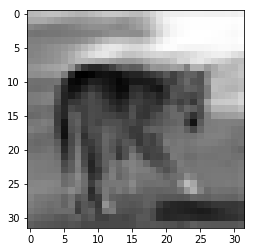

Bild Nr. 267
Richtiges Label [9]
Knn Label Ergebnis: [8]


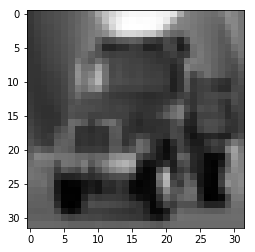

Bild Nr. 268
Richtiges Label [7]
Knn Label Ergebnis: [6]


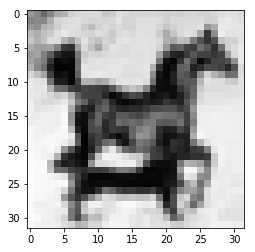

Bild Nr. 269
Richtiges Label [9]
Knn Label Ergebnis: [0]


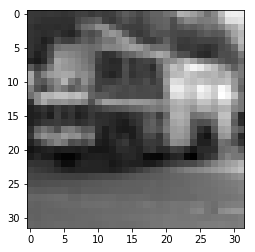

Bild Nr. 270
Richtiges Label [0]
Knn Label Ergebnis: [8]


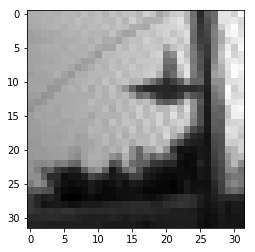

Bild Nr. 271
Richtiges Label [9]
Knn Label Ergebnis: [0]


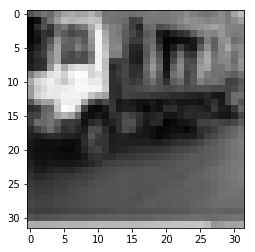

Bild Nr. 272
Richtiges Label [9]
Knn Label Ergebnis: [8]


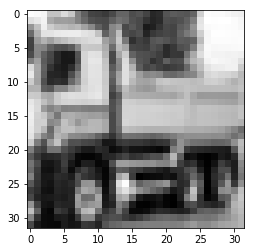

Bild Nr. 273
Richtiges Label [5]
Knn Label Ergebnis: [0]


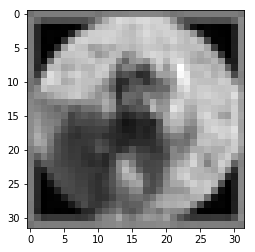

Bild Nr. 274
Richtiges Label [8]
Knn Label Ergebnis: [5]


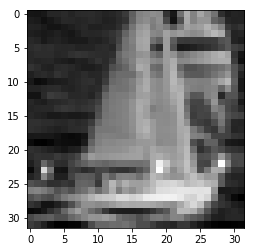

Bild Nr. 275
Richtiges Label [1]
Knn Label Ergebnis: [8]


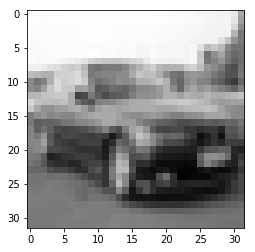

Bild Nr. 276
Richtiges Label [7]
Knn Label Ergebnis: [8]


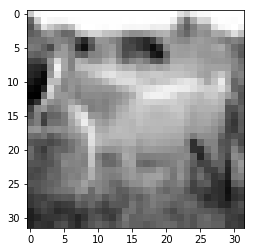

Bild Nr. 277
Richtiges Label [3]
Knn Label Ergebnis: [6]


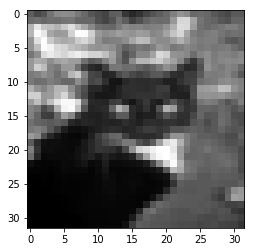

Bild Nr. 278
Richtiges Label [5]
Knn Label Ergebnis: [0]


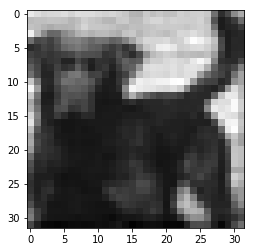

Bild Nr. 279
Richtiges Label [7]
Knn Label Ergebnis: [3]


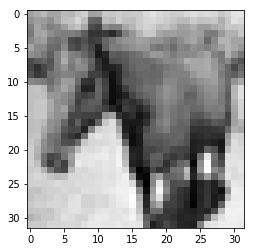

Bild Nr. 280
Richtiges Label [2]
Knn Label Ergebnis: [6]


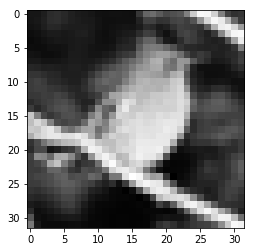

Bild Nr. 281
Richtiges Label [0]
Knn Label Ergebnis: [8]


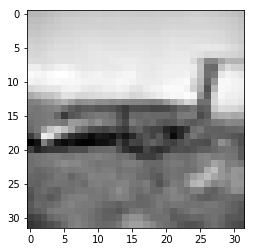

Bild Nr. 282
Richtiges Label [7]
Knn Label Ergebnis: [0]


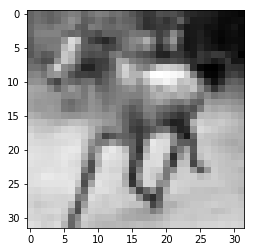

Bild Nr. 283
Richtiges Label [5]
Knn Label Ergebnis: [2]


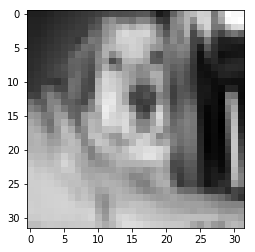

Bild Nr. 284
Richtiges Label [2]
Knn Label Ergebnis: [8]


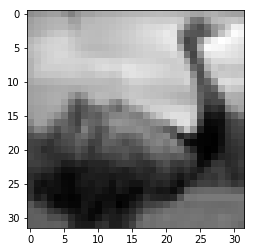

Bild Nr. 285
Richtiges Label [2]
Knn Label Ergebnis: [3]


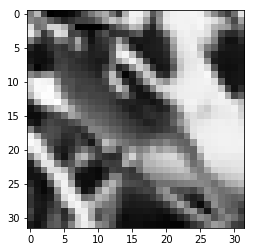

Bild Nr. 286
Richtiges Label [3]
Knn Label Ergebnis: [2]


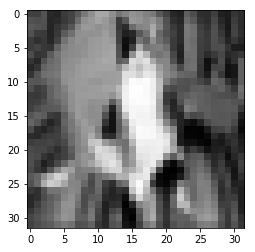

Bild Nr. 287
Richtiges Label [7]
Knn Label Ergebnis: [6]


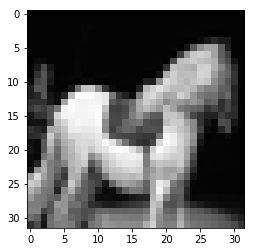

Bild Nr. 288
Richtiges Label [5]
Knn Label Ergebnis: [6]


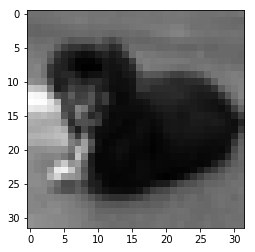

Bild Nr. 289
Richtiges Label [2]
Knn Label Ergebnis: [0]


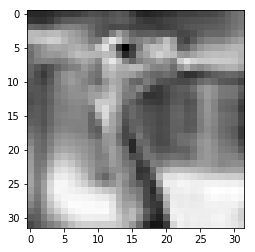

Bild Nr. 290
Richtiges Label [9]
Knn Label Ergebnis: [1]


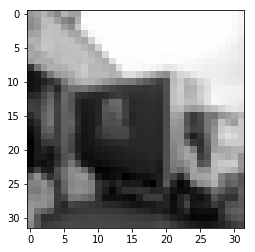

Bild Nr. 291
Richtiges Label [2]
Knn Label Ergebnis: [0]


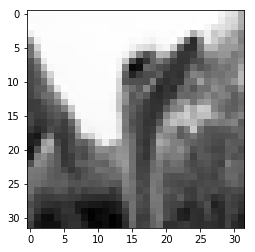

Bild Nr. 292
Richtiges Label [6]
Knn Label Ergebnis: [4]


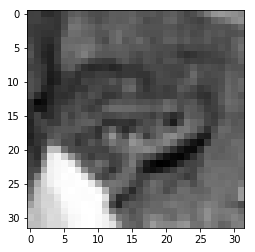

Bild Nr. 293
Richtiges Label [9]
Knn Label Ergebnis: [0]


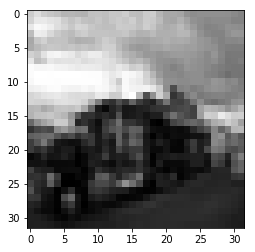

Bild Nr. 294
Richtiges Label [1]
Knn Label Ergebnis: [8]


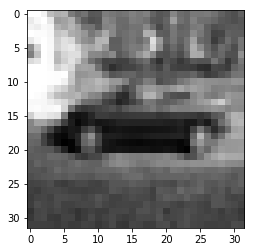

Bild Nr. 295
Richtiges Label [5]
Knn Label Ergebnis: [0]


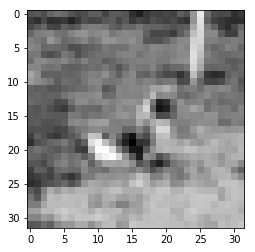

Bild Nr. 296
Richtiges Label [4]
Knn Label Ergebnis: [8]


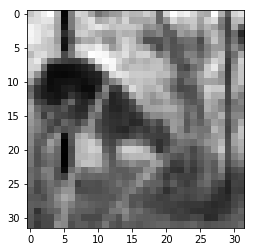

Bild Nr. 297
Richtiges Label [5]
Knn Label Ergebnis: [4]


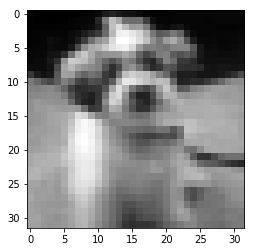

Bild Nr. 298
Richtiges Label [6]
Knn Label Ergebnis: [2]


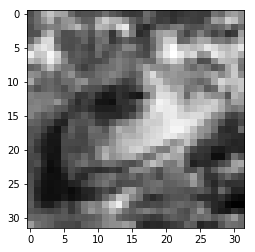

Bild Nr. 299
Richtiges Label [0]
Knn Label Ergebnis: [8]


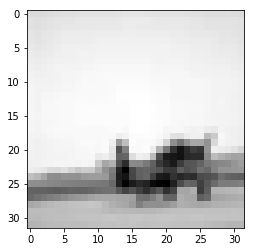

Bild Nr. 300
Richtiges Label [4]
Knn Label Ergebnis: [0]


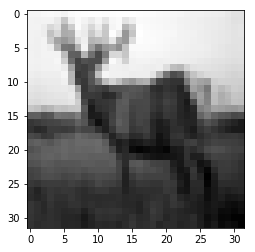

Bild Nr. 301
Richtiges Label [9]
Knn Label Ergebnis: [8]


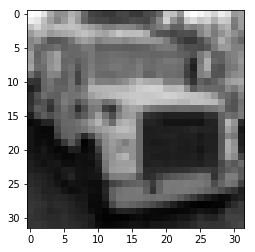

Bild Nr. 302
Richtiges Label [7]
Knn Label Ergebnis: [9]


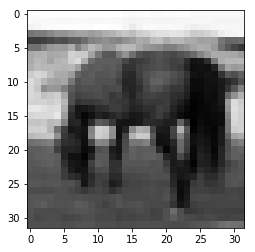

Bild Nr. 303
Richtiges Label [6]
Knn Label Ergebnis: [2]


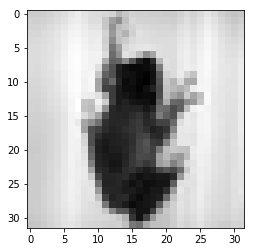

Bild Nr. 304
Richtiges Label [1]
Knn Label Ergebnis: [8]


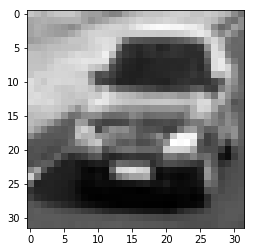

Bild Nr. 305
Richtiges Label [5]
Knn Label Ergebnis: [0]


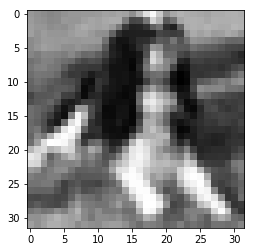

Bild Nr. 306
Richtiges Label [7]
Knn Label Ergebnis: [2]


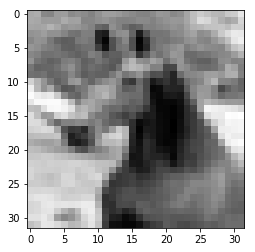

Bild Nr. 307
Richtiges Label [2]
Knn Label Ergebnis: [4]


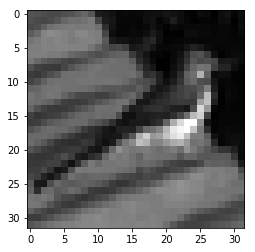

Bild Nr. 308
Richtiges Label [9]
Knn Label Ergebnis: [0]


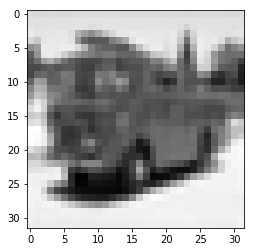

Bild Nr. 309
Richtiges Label [1]
Knn Label Ergebnis: [3]


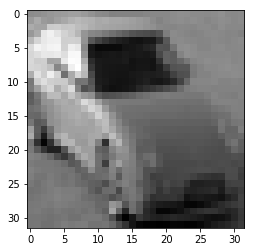

Bild Nr. 310
Richtiges Label [8]
Knn Label Ergebnis: [0]


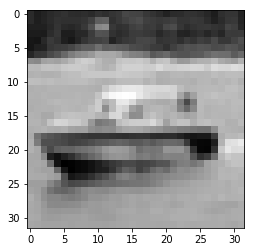

Bild Nr. 311
Richtiges Label [2]
Knn Label Ergebnis: [7]


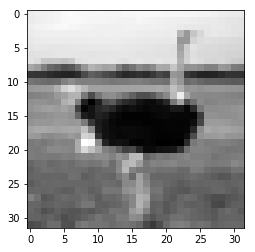

Bild Nr. 312
Richtiges Label [9]
Knn Label Ergebnis: [8]


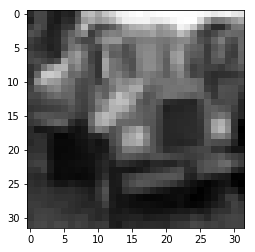

Bild Nr. 313
Richtiges Label [2]
Knn Label Ergebnis: [4]


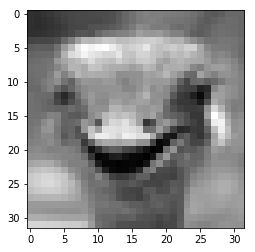

Bild Nr. 314
Richtiges Label [1]
Knn Label Ergebnis: [2]


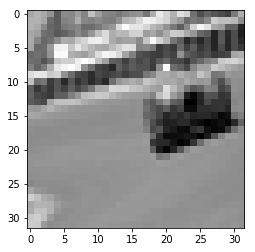

Bild Nr. 315
Richtiges Label [2]
Knn Label Ergebnis: [0]


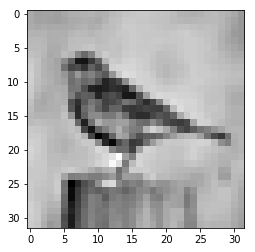

Bild Nr. 316
Richtiges Label [0]
Knn Label Ergebnis: [8]


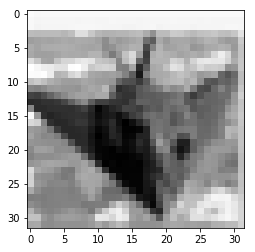

Bild Nr. 317
Richtiges Label [1]
Knn Label Ergebnis: [8]


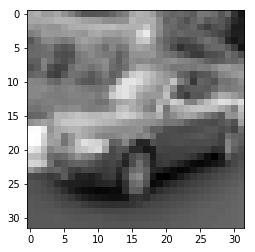

Bild Nr. 318
Richtiges Label [4]
Knn Label Ergebnis: [8]


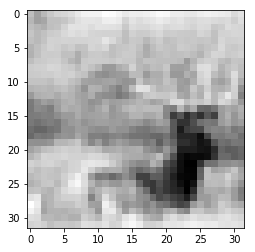

Bild Nr. 319
Richtiges Label [7]
Knn Label Ergebnis: [5]


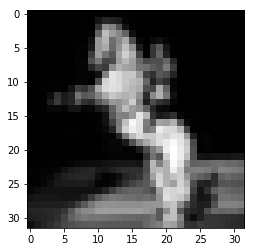

Bild Nr. 320
Richtiges Label [5]
Knn Label Ergebnis: [4]


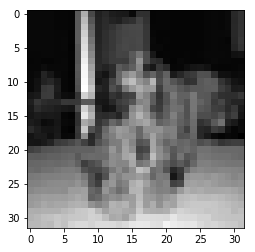

Bild Nr. 321
Richtiges Label [8]
Knn Label Ergebnis: [4]


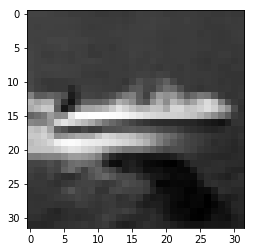

Bild Nr. 322
Richtiges Label [3]
Knn Label Ergebnis: [5]


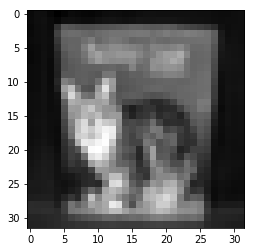

Bild Nr. 323
Richtiges Label [3]
Knn Label Ergebnis: [0]


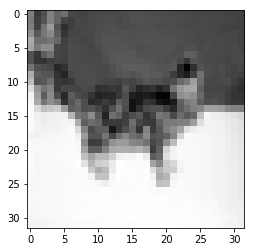

Bild Nr. 324
Richtiges Label [2]
Knn Label Ergebnis: [4]


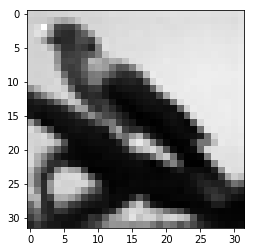

Bild Nr. 325
Richtiges Label [7]
Knn Label Ergebnis: [0]


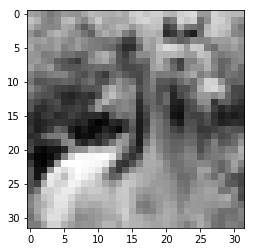

Bild Nr. 326
Richtiges Label [3]
Knn Label Ergebnis: [6]


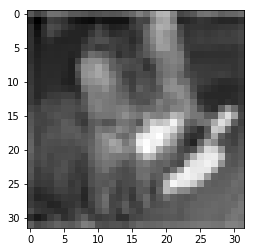

Bild Nr. 327
Richtiges Label [4]
Knn Label Ergebnis: [2]


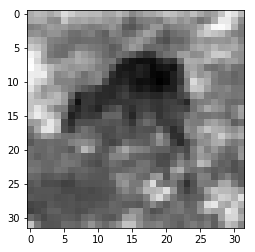

Bild Nr. 328
Richtiges Label [6]
Knn Label Ergebnis: [4]


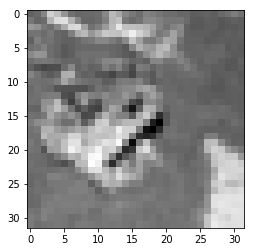

Bild Nr. 329
Richtiges Label [4]
Knn Label Ergebnis: [0]


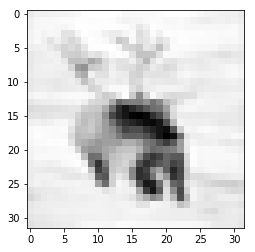

Bild Nr. 330
Richtiges Label [4]
Knn Label Ergebnis: [0]


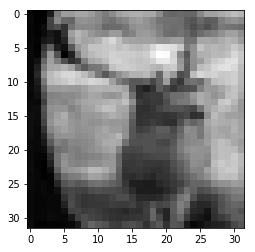

Bild Nr. 331
Richtiges Label [3]
Knn Label Ergebnis: [4]


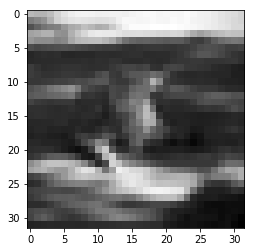

Bild Nr. 332
Richtiges Label [7]
Knn Label Ergebnis: [4]


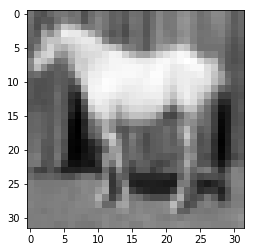

Bild Nr. 333
Richtiges Label [7]
Knn Label Ergebnis: [4]


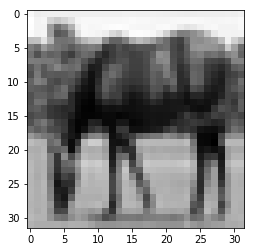

Bild Nr. 334
Richtiges Label [5]
Knn Label Ergebnis: [2]


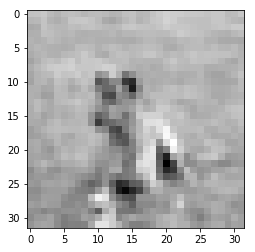

Bild Nr. 335
Richtiges Label [8]
Knn Label Ergebnis: [3]


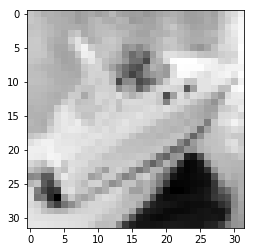

Bild Nr. 336
Richtiges Label [5]
Knn Label Ergebnis: [0]


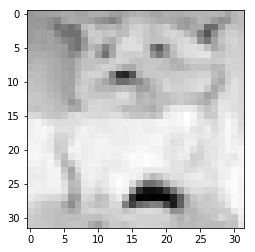

Bild Nr. 337
Richtiges Label [5]
Knn Label Ergebnis: [4]


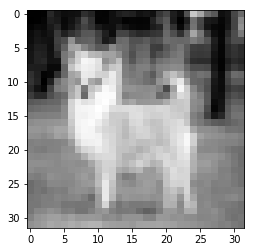

Bild Nr. 338
Richtiges Label [0]
Knn Label Ergebnis: [2]


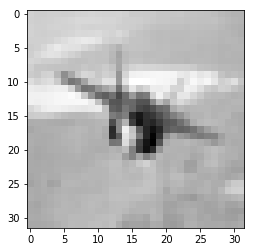

Bild Nr. 339
Richtiges Label [1]
Knn Label Ergebnis: [8]


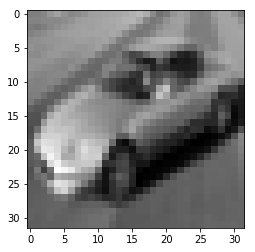

Bild Nr. 340
Richtiges Label [5]
Knn Label Ergebnis: [2]


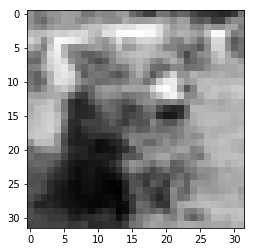

Bild Nr. 341
Richtiges Label [7]
Knn Label Ergebnis: [0]


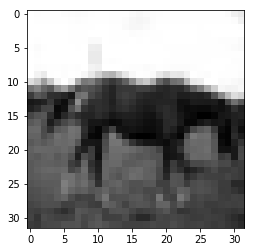

Bild Nr. 342
Richtiges Label [7]
Knn Label Ergebnis: [4]


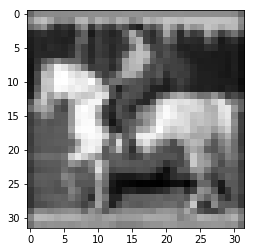

Bild Nr. 343
Richtiges Label [9]
Knn Label Ergebnis: [0]


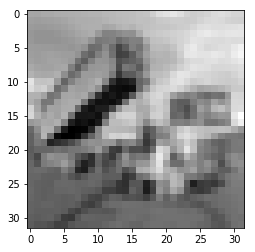

Bild Nr. 344
Richtiges Label [6]
Knn Label Ergebnis: [4]


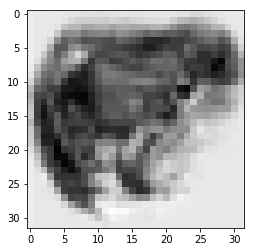

Bild Nr. 345
Richtiges Label [7]
Knn Label Ergebnis: [2]


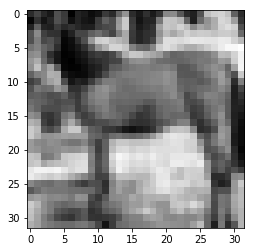

Bild Nr. 346
Richtiges Label [6]
Knn Label Ergebnis: [5]


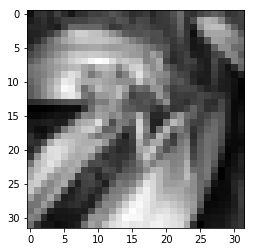

Bild Nr. 347
Richtiges Label [1]
Knn Label Ergebnis: [8]


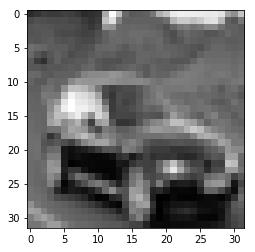

Bild Nr. 348
Richtiges Label [4]
Knn Label Ergebnis: [8]


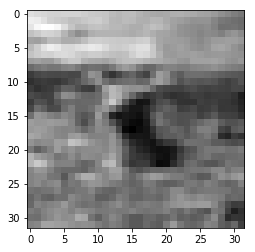

Bild Nr. 349
Richtiges Label [5]
Knn Label Ergebnis: [0]


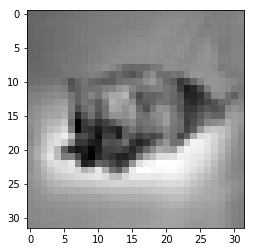

Bild Nr. 350
Richtiges Label [0]
Knn Label Ergebnis: [6]


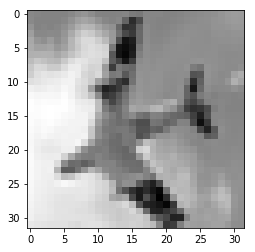

Bild Nr. 351
Richtiges Label [7]
Knn Label Ergebnis: [4]


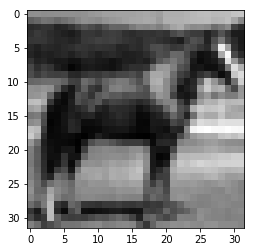

Bild Nr. 352
Richtiges Label [6]
Knn Label Ergebnis: [4]


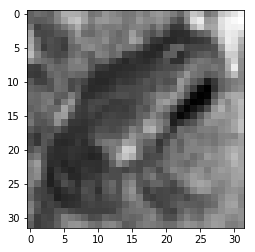

Bild Nr. 353
Richtiges Label [7]
Knn Label Ergebnis: [6]


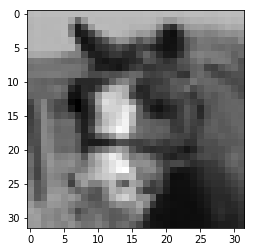

Bild Nr. 354
Richtiges Label [0]
Knn Label Ergebnis: [5]


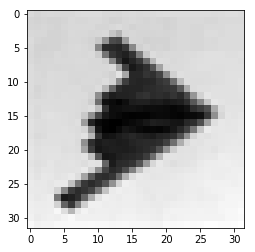

Bild Nr. 355
Richtiges Label [6]
Knn Label Ergebnis: [9]


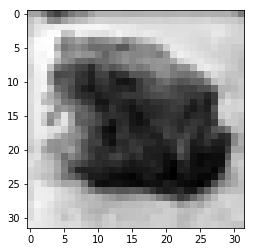

Bild Nr. 356
Richtiges Label [7]
Knn Label Ergebnis: [2]


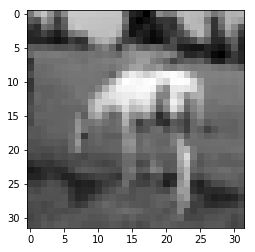

Bild Nr. 357
Richtiges Label [4]
Knn Label Ergebnis: [0]


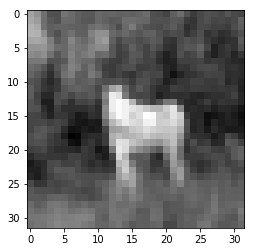

Bild Nr. 358
Richtiges Label [3]
Knn Label Ergebnis: [0]


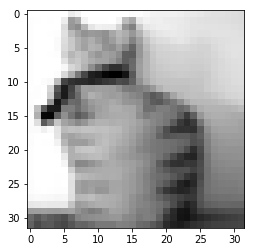

Bild Nr. 359
Richtiges Label [9]
Knn Label Ergebnis: [1]


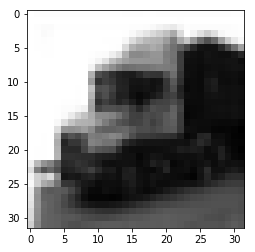

Bild Nr. 360
Richtiges Label [6]
Knn Label Ergebnis: [2]


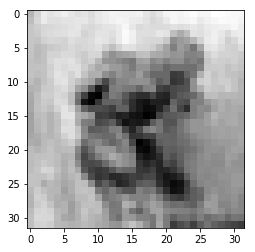

Bild Nr. 361
Richtiges Label [5]
Knn Label Ergebnis: [2]


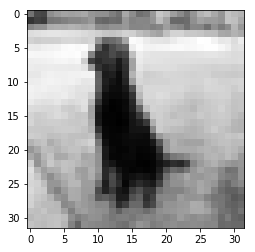

Bild Nr. 362
Richtiges Label [5]
Knn Label Ergebnis: [2]


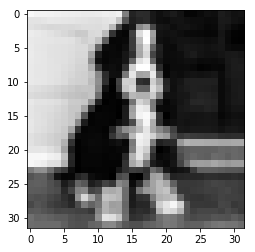

Bild Nr. 363
Richtiges Label [6]
Knn Label Ergebnis: [2]


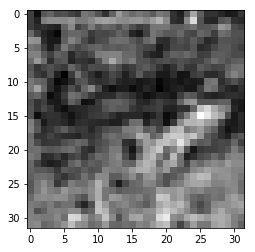

Bild Nr. 364
Richtiges Label [5]
Knn Label Ergebnis: [6]


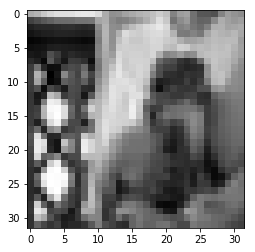

Bild Nr. 365
Richtiges Label [2]
Knn Label Ergebnis: [4]


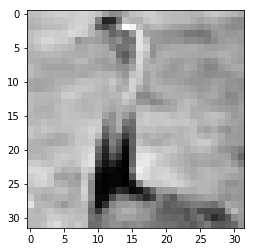

Bild Nr. 366
Richtiges Label [7]
Knn Label Ergebnis: [0]


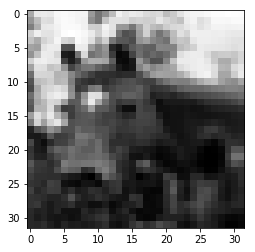

Bild Nr. 367
Richtiges Label [5]
Knn Label Ergebnis: [0]


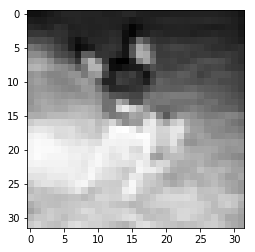

Bild Nr. 368
Richtiges Label [3]
Knn Label Ergebnis: [0]


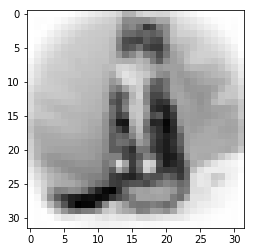

Bild Nr. 369
Richtiges Label [2]
Knn Label Ergebnis: [4]


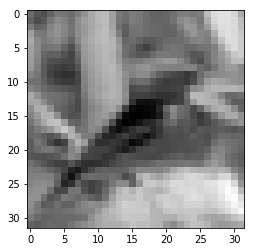

Bild Nr. 370
Richtiges Label [3]
Knn Label Ergebnis: [2]


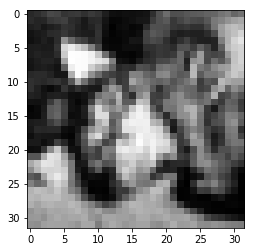

Bild Nr. 371
Richtiges Label [5]
Knn Label Ergebnis: [2]


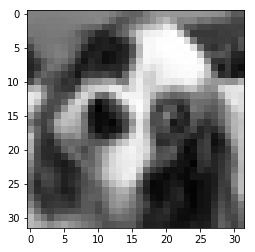

Bild Nr. 372
Richtiges Label [4]
Knn Label Ergebnis: [0]


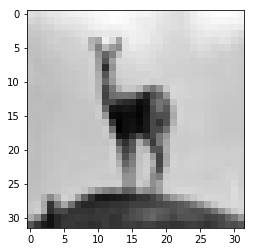

Bild Nr. 373
Richtiges Label [6]
Knn Label Ergebnis: [5]


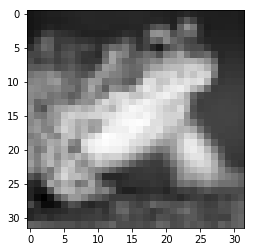

Bild Nr. 374
Richtiges Label [3]
Knn Label Ergebnis: [7]


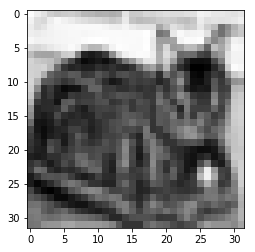

Bild Nr. 375
Richtiges Label [1]
Knn Label Ergebnis: [3]


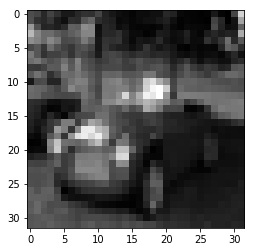

Bild Nr. 376
Richtiges Label [7]
Knn Label Ergebnis: [4]


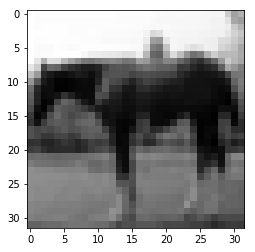

Bild Nr. 377
Richtiges Label [1]
Knn Label Ergebnis: [0]


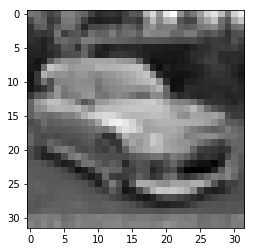

Bild Nr. 378
Richtiges Label [7]
Knn Label Ergebnis: [4]


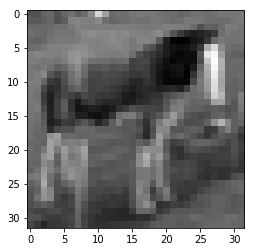

Bild Nr. 379
Richtiges Label [4]
Knn Label Ergebnis: [0]


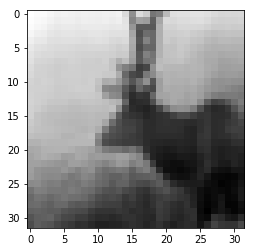

Bild Nr. 380
Richtiges Label [4]
Knn Label Ergebnis: [2]


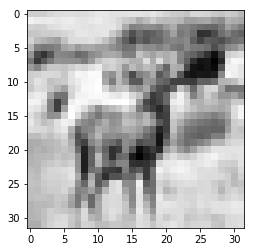

Bild Nr. 381
Richtiges Label [5]
Knn Label Ergebnis: [4]


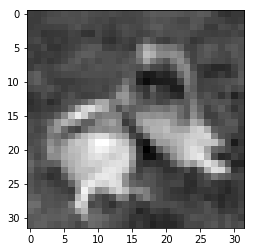

Bild Nr. 382
Richtiges Label [7]
Knn Label Ergebnis: [2]


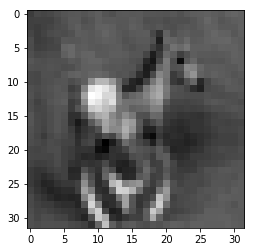

Bild Nr. 383
Richtiges Label [3]
Knn Label Ergebnis: [6]


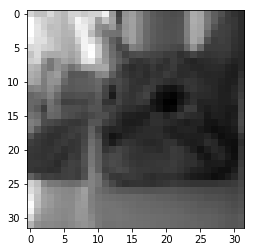

Bild Nr. 384
Richtiges Label [8]
Knn Label Ergebnis: [0]


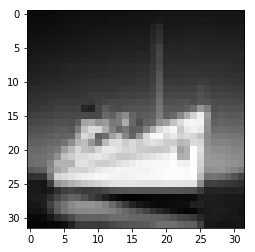

Bild Nr. 385
Richtiges Label [2]
Knn Label Ergebnis: [0]


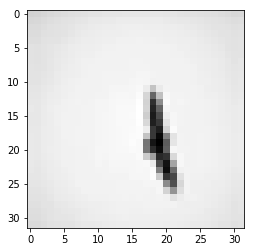

Bild Nr. 386
Richtiges Label [3]
Knn Label Ergebnis: [5]


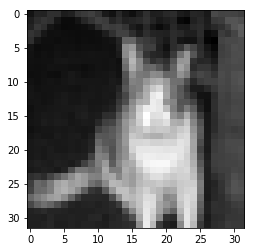

Confusion matrix, without normalization
[[13  0  6  0  3  1  2  0 14  0]
 [10  7  4  4  5  0  1  0 18  0]
 [ 8  0 20  2 15  0  2  1  3  0]
 [13  0 11 13 10  5  6  1  3  0]
 [12  0 15  4 12  0  0  0  4  1]
 [15  0 13  3  8 10  2  1  0  1]
 [ 9  0  9  3 16  4  5  0  5  1]
 [12  1  8  3 17  1  5  4  3  1]
 [10  0  2  3  5  1  0  0 25  0]
 [10  2  1  2  8  1  0  1 15  5]]


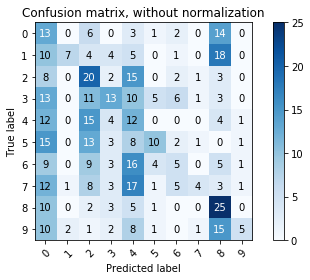

In [0]:
knn_result = knn(8)
calc_error(knn_result)

# **KMEANS**

In [0]:
def kmeans(n_iterations):
  print("KNN für", n_iterations, "Iterationen")
  #1000 Sampledaten aus den 60000 Trainingsdaten
  n_sample = 10000
  idx = np.random.randint(n_train, size=n_sample)
  global x_sample, y_sample
  x_sample = images_train_gray_flat[idx]
  y_sample = labels_train_list[idx]
  #Anzahl Cluster
  global k
  k = 10

  # init centroids
  # 10 random Centroids finden
  idx_centroid = np.random.randint(n_sample, size=k)
  #Centroids in eigene Variable speichern
  centroids = x_sample[idx_centroid]

  idx_centroid

  # init centroids
  #range für iterations anpassen
  global labels
  for j in range(n_iterations):
      
      # calc distances
      dists = scipy.spatial.distance.cdist(x_sample, centroids, metric='euclid')
      
      # label according to nearest centroids
      
      labels = np.argmin(dists, axis=1)
      
      # get new centroids
      centroid_list = [x_sample[labels == i].mean(0) for i in range(k)]
      centroids = np.stack(centroid_list)

In [0]:
def cluster_output():
  gesamt = 0
  for i in range(k):
    size = y_sample[labels == i].shape[0]
    count_numbers = np.bincount(y_sample[labels == i])
    number_idx = count_numbers.argmax()
    correct = count_numbers[number_idx]
    percentage = (correct / size) * 100
    gesamt += size
    print("Clustergröße: ", size)
    print("Verteilung der Bilder", count_numbers)
    print("Index der häufigsten Bildgruppe", number_idx)
    print("Richtig zugeordnet", correct)
    print("Cluster " + str(i) + " besteht zu " + str(round(percentage, 2)) + " % aus dem Bild " + str(number_idx))
    #print(gesamt)
    print("___________________________________________")


In [0]:
data_preparation()
kmeans(10)
cluster_output()

KNN für 10 Iterationen
Clustergröße:  1015
Verteilung der Bilder [ 46 108  67 128  77 208 161  74 106  40]
Index der häufigsten Bildgruppe 5
Richtig zugeordnet 208
Cluster 0 besteht zu 20.49 % aus dem Bild 5
___________________________________________
Clustergröße:  871
Verteilung der Bilder [ 58 145  99  86  85  67 130  73  44  84]
Index der häufigsten Bildgruppe 1
Richtig zugeordnet 145
Cluster 1 besteht zu 16.65 % aus dem Bild 1
___________________________________________
Clustergröße:  1346
Verteilung der Bilder [ 83 102 222 113 219 130 187 162  37  91]
Index der häufigsten Bildgruppe 2
Richtig zugeordnet 222
Cluster 2 besteht zu 16.49 % aus dem Bild 2
___________________________________________
Clustergröße:  647
Verteilung der Bilder [ 27  53  80  98  94  74 141  42  25  13]
Index der häufigsten Bildgruppe 6
Richtig zugeordnet 141
Cluster 3 besteht zu 21.79 % aus dem Bild 6
___________________________________________
Clustergröße:  876
Verteilung der Bilder [150  92  36  35  37  

In [0]:
kmeans(100)
cluster_output()

KNN für 100 Iterationen
Clustergröße:  1381
Verteilung der Bilder [ 86 198 150 137 139 111 206 113  95 146]
Index der häufigsten Bildgruppe 6
Richtig zugeordnet 206
Cluster 0 besteht zu 14.92 % aus dem Bild 6
___________________________________________
Clustergröße:  1029
Verteilung der Bilder [150  29 172 123 134 143  82 107  70  19]
Index der häufigsten Bildgruppe 2
Richtig zugeordnet 172
Cluster 1 besteht zu 16.72 % aus dem Bild 2
___________________________________________
Clustergröße:  1096
Verteilung der Bilder [ 92 107  72 132  82 189 116  96 152  58]
Index der häufigsten Bildgruppe 5
Richtig zugeordnet 189
Cluster 2 besteht zu 17.24 % aus dem Bild 5
___________________________________________
Clustergröße:  878
Verteilung der Bilder [151 100  41  42  46  37  14  35 290 122]
Index der häufigsten Bildgruppe 8
Richtig zugeordnet 290
Cluster 3 besteht zu 33.03 % aus dem Bild 8
___________________________________________
Clustergröße:  683
Verteilung der Bilder [ 74  92  38  63  28

In [0]:
kmeans(1000)
cluster_output()

KNN für 1000 Iterationen
Clustergröße:  1077
Verteilung der Bilder [ 59 175  62  81  60  60  63 102 147 268]
Index der häufigsten Bildgruppe 9
Richtig zugeordnet 268
Cluster 0 besteht zu 24.88 % aus dem Bild 9
___________________________________________
Clustergröße:  892
Verteilung der Bilder [141  19 157 105 107 126  70 106  43  18]
Index der häufigsten Bildgruppe 2
Richtig zugeordnet 157
Cluster 1 besteht zu 17.6 % aus dem Bild 2
___________________________________________
Clustergröße:  1354
Verteilung der Bilder [ 87 122 180 133 196 126 157 199  39 115]
Index der häufigsten Bildgruppe 7
Richtig zugeordnet 199
Cluster 2 besteht zu 14.7 % aus dem Bild 7
___________________________________________
Clustergröße:  1155
Verteilung der Bilder [145  78 157 100 117 131  98  86 183  60]
Index der häufigsten Bildgruppe 8
Richtig zugeordnet 183
Cluster 3 besteht zu 15.84 % aus dem Bild 8
___________________________________________
Clustergröße:  760
Verteilung der Bilder [ 79  83  65  71  30 

# **Antwort**
**What is the error rate of KNN on the test set and what is the error rate for each label (number)?**

**How does the choice of k influence the results?**

Basiert auf 10000 Trainsamples und 500 Testsamples.

KNN für k= 2

Errorrate:  78.0 %
```    
Errorrate für 0  =  46.15 %
Errorrate für 1  =  89.8 %
Errorrate für 2  =  62.75 %
Errorrate für 3  =  82.26 %
Errorrate für 4  =  77.08 %
Errorrate für 5  =  77.36 %
Errorrate für 6  =  84.62 %
Errorrate für 7  =  94.55 %
Errorrate für 8  =  63.04 %
Errorrate für 9  =  93.33 %
```
---

KNN für k= 4

Errorrate:  79.4 %
```    
Errorrate für 0  =  66.67 %
Errorrate für 1  =  89.8 %
Errorrate für 2  =  64.71 %
Errorrate für 3  =  85.48 %
Errorrate für 4  =  72.92 %
Errorrate für 5  =  81.13 %
Errorrate für 6  =  88.46 %
Errorrate für 7  =  89.09 %
Errorrate für 8  =  56.52 %
Errorrate für 9  =  93.33 %
```
----

KNN für k= 8

Errorrate:  77.2 %
```  
Errorrate für 0  =  66.67 %
Errorrate für 1  =  85.71 %
Errorrate für 2  =  60.78 %
Errorrate für 3  =  79.03 %
Errorrate für 4  =  75.0 %
Errorrate für 5  =  81.13 %
Errorrate für 6  =  90.38 %
Errorrate für 7  =  92.73 %
Errorrate für 8  =  45.65 %
Errorrate für 9  =  88.89 %
```
----

Die Errorrate nimmt von k=2 auf k=8 zwar ab, jedoch handelt es nicht um keine Änderung die eine merkbare Verbesserung der Ergebnisse verursacht. Die Vorhersage ist trotz steigendem k schlecht.

Die individuelle Errorrate ändert sich ebenfalls zwischen den verschiedenen k, jedoch ist auch hier Veränderung zu sehen, die das Endergebnis deutlich verbessern würde.

---
---

**What is the majority class of each cluster and what is the percentage of the majority class in each cluster??**

KMEANS für 10 Iterationen
```
Cluster 0 besteht zu 20.49 % aus dem Bild 5
Cluster 1 besteht zu 16.65 % aus dem Bild 1
Cluster 2 besteht zu 16.49 % aus dem Bild 2
Cluster 3 besteht zu 21.79 % aus dem Bild 6
Cluster 4 besteht zu 30.94 % aus dem Bild 8
Cluster 5 besteht zu 22.91 % aus dem Bild 9
Cluster 6 besteht zu 20.27 % aus dem Bild 7
Cluster 7 besteht zu 18.09 % aus dem Bild 4
Cluster 8 besteht zu 30.13 % aus dem Bild 0
Cluster 9 besteht zu 15.55 % aus dem Bild 5
```
KMEANS für 100 Iterationen
```
Cluster 0 besteht zu 14.92 % aus dem Bild 6
Cluster 1 besteht zu 16.72 % aus dem Bild 2
Cluster 2 besteht zu 17.24 % aus dem Bild 5
Cluster 3 besteht zu 33.03 % aus dem Bild 8
Cluster 4 besteht zu 17.86 % aus dem Bild 7
Cluster 5 besteht zu 30.12 % aus dem Bild 0
Cluster 6 besteht zu 21.33 % aus dem Bild 4
Cluster 7 besteht zu 20.9 % aus dem Bild 6
Cluster 8 besteht zu 32.21 % aus dem Bild 9
Cluster 9 besteht zu 13.38 % aus dem Bild 7
```
KMEANS für 1000 Iterationen
```
Cluster 0 besteht zu 24.88 % aus dem Bild 9
Cluster 1 besteht zu 17.6 % aus dem Bild 2
Cluster 2 besteht zu 14.7 % aus dem Bild 7
Cluster 3 besteht zu 15.84 % aus dem Bild 8
Cluster 4 besteht zu 18.42 % aus dem Bild 7
Cluster 5 besteht zu 17.97 % aus dem Bild 6
Cluster 6 besteht zu 20.17 % aus dem Bild 4
Cluster 7 besteht zu 29.37 % aus dem Bild 0
Cluster 8 besteht zu 30.78 % aus dem Bild 8
Cluster 9 besteht zu 16.08 % aus dem Bild 6
```
**Does each number have a cluster? If not, which hasn’t?**

Für 10 Iterationen hat das Bild mit dem Index 3 kein Cluster.

Für 100 Iterationen haben die Bilder mit den Indexen 1 und 3 kein Cluster.

Für 1000 Iterationen haben die Bilder mit den Indexen 1, 3 und 5 kein Cluster.

Wie man erkennen kann hat das Bild mit den Index 3 in keinem der 3 Durchläufe eine Cluster erhalten. Das Bild mit dem Index 1 hat in zwei Durchläufen kein Cluster erhalten.

Die Anteile der Bilder die eine Mehrheit in einem Cluster haben sind jedoch sehr gering. Der Anteil der Mehrheitsbilder in einem Cluster liegt meist zwischen 10%-30%. Wenn man sich dann die Outputs anschaut, merkt man, dass die Bilder zwar eine Mehrheit haben, jedoch von der Verteilung fast auch zufällig predicted sein könnten.

----

**Some numbers are more difficult to predict with KNN and to cluster with
K-means. Show why. Start with examples, and get more general**

Schauen wir uns die Fehlerhaften Bilder des Ergebnises von KNN k=2 wird schnell klar warum KNN und KMEANS Probleme haben eine zuverlässige vorhersage zu treffen. 

Nehmen wir Bild Nr. 6 und Bild Nr. 8 als Beispiel. Beide gehören zur Gruppe [1] (automobile). Wenn man die Bilder vergleicht fällt direkt auf, dass das Motiv völlig andere Eigenschaften hat. Bei Bild Nr. 6 handelt es sich um ein Polizeiauto, welches in einem anderen Winkel auf dem Foto ist wie das normale Auto auf Bild Nr. 8. Dazu hat das Polizeiauto auf Bild Nr. 6 Eigenschaften wie Stoßstange oder Polizeilicht, die das normale Auto nicht hat.

Weiteres Beispiel aus dem Ergebnis von KNN k=8.
Bild Nr. 18 und Bild Nr. 21 gehören beide zur Kategorie [0] (airplane). Es handelt sich wieder um unterschiedliche Flugzeugtypen, unterschiedliche Hintergründe, unterschiedliche Winkel der Aufnahme und viele weitere unterschiedliche Eigenschaften.

Als letztes Beispiel nehmen wir Bild Nr. 23 und Bild Nr. 24 aus KNN k=8. Es soll sich hierbei um die Klasse [2] (bird) handeln. Wie in den vorherigen Beispielen handelt es sich hier um unterschiedliche Vogelarten, Winkel und Hintergründe.


Wie man an der vorhergehenden Bildern sehen konnte (man findet noch hunderte weitere) haben KNN und KMEANS erhebliche Probleme die Bilder zuverlässig vorherzusagen, da in diesem Datensatz viele Faktoren eine Rolle spielen. Winkel der Aufnahme, Spezifikationen des Objekts, der Hintergrund und weitere Faktoren ändern sich von Bild zu Bild. Wenn die Algorithmen versuchen in diesem Trainingsset gemeinsamkeiten zu errechnen werden die Ergebnisse durch das Rauschen des Hintergrunds und die Änderung der Spezifikation in jedem Bild verfälscht.


